In [1]:
import pandas as pd

In [2]:
import h5py 
import numpy as np
def import_tfmodisco_motifs(tfm_results_path, trim=True, only_pos=True):
    """
    Imports the PFMs to into a dictionary, mapping `(x, y)` to the PFM,
    where `x` is the metacluster index and `y` is the pattern index.
    Arguments:
        `tfm_results_path`: path to HDF5 containing TF-MoDISco results
        `out_dir`: where to save motifs
        `trim`: if True, trim the motif flanks based on information content
        `only_pos`: if True, only return motifs with positive contributions
    Returns the dictionary of PFMs.
    """ 
    pfms = {}
    with h5py.File(tfm_results_path, "r") as f:
        metaclusters = f["metacluster_idx_to_submetacluster_results"]
        num_metaclusters = len(metaclusters.keys())
        for metacluster_i, metacluster_key in enumerate(metaclusters.keys()):
            metacluster = metaclusters[metacluster_key]
            print(len(metacluster["seqlets"].value))
            if "patterns" not in metacluster["seqlets_to_patterns_result"]:
                continue
            patterns = metacluster["seqlets_to_patterns_result"]["patterns"]
            num_patterns = len(patterns["all_pattern_names"][:])
            for pattern_i, pattern_name in enumerate(patterns["all_pattern_names"][:]):
                pattern_name = pattern_name
                pattern = patterns[pattern_name]
                if metacluster_i==0:
                    key = "pos_patterns.pattern_"+str(pattern_i)
                if metacluster_i==1:
                    key = "neg_patterns.pattern_"+str(pattern_i)                
                
                if key not in pfms:
                    pfms[key] = []

                for seqlet in pattern["seqlets_and_alnmts"]["seqlets"]:
                    pfms[key].append(seqlet)
               
    return pfms

In [3]:
dttype = 'ATAC'
mode = "counts"
celltype="K562"
dttype1="ATAC_PE"
tfm_results_path = '/oak/stanford/groups/akundaje/projects/chromatin-atlas-2022/chrombpnet/folds/'+dttype+'/'+celltype+'/merge_folds_new/'+mode+'/modisco_old_format.h5'

pfms = import_tfmodisco_motifs(tfm_results_path)

/users/anusri/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.


157239
2134


In [4]:
htmld="/oak/stanford/groups/akundaje/projects/chromatin-atlas-2022/chrombpnet/folds/"+dttype+'/'+celltype+"/merge_folds_new/counts/motifs.html"
df = pd.read_html(htmld)
tomtom = df[0]
tomtom

,pattern,num_seqlets,modisco_cwm_fwd,modisco_cwm_rev,match0,qval0,match0_logo,match1,qval1,match1_logo,match2,qval2,match2_logo
0,pos_patterns.pattern_0,36366,NaN,NaN,GATA3_GATA_1,2.261690e-01,NaN,GATA3_GATA_2,2.261690e-01,NaN,GATA3_MA0037.3,2.261690e-01,NaN
1,pos_patterns.pattern_1,33817,NaN,NaN,CTCF_MA0139.1,1.215460e-15,NaN,CTCF_HUMAN.H11MO.0.A,5.730620e-12,NaN,CTCF_MOUSE.H11MO.0.A,3.063360e-11,NaN
2,pos_patterns.pattern_2,26683,NaN,NaN,KLF12_HUMAN.H11MO.0.C,8.183800e-06,NaN,KLF3_HUMAN.H11MO.0.B,4.967560e-05,NaN,KLF3_MOUSE.H11MO.0.A,4.967560e-05,NaN
3,pos_patterns.pattern_3,13473,NaN,NaN,BACH2_MOUSE.H11MO.0.A,5.835680e-06,NaN,BACH2_HUMAN.H11MO.0.A,5.835680e-06,NaN,NFE2_HUMAN.H11MO.0.A,7.780910e-06,NaN
4,pos_patterns.pattern_4,9415,NaN,NaN,Gabpa_MA0062.2,9.275380e-05,NaN,EHF_ETS_1,9.275380e-05,NaN,EHF_MA0598.2,9.275380e-05,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,neg_patterns.pattern_15,39,NaN,NaN,MYF6_HUMAN.H11MO.0.C,1.190630e-01,NaN,MYF6_MOUSE.H11MO.0.C,1.190630e-01,NaN,SNAI1_HUMAN.H11MO.0.C,1.217790e-01,NaN
59,neg_patterns.pattern_16,39,NaN,NaN,PKNOX2_MA0783.1,3.550630e-02,NaN,PKNOX2_MEIS_1,3.550630e-02,NaN,Meis2.mouse_MEIS_2,3.550630e-02,NaN
60,neg_patterns.pattern_17,34,NaN,NaN,YY2_C2H2_3,5.186480e-01,NaN,FOSB+JUN_MA1127.1,5.186480e-01,NaN,FOSL1+JUN_MA1129.1,5.186480e-01,NaN
61,neg_patterns.pattern_18,34,NaN,NaN,TFAP4_HUMAN.H11MO.0.A,3.024530e-01,NaN,TGIF1_MOUSE.H11MO.0.A,3.024530e-01,NaN,ASCL1_MA1100.1,3.975420e-01,NaN


In [5]:
bed="/oak/stanford/groups/akundaje/projects/chromatin-atlas-2022/chrombpnet/folds/"+dttype+'/'+celltype+"/merge_folds_new/in_peaks.interpreted_regions.bed"
bed = pd.read_csv(bed, sep="\t", header=None)
bed.head()
print(bed.shape)

(269719, 11)


In [6]:
lists=[]
for key in pfms:
    print(key)
    if key in tomtom["pattern"].values:
        match_name = tomtom[tomtom["pattern"]==key]["match0"]
        keyd = key.replace("pos_patterns.pattern","0").replace("neg_patterns.pattern","1")+"_"+match_name
        keyd = keyd.values[0]
        #print(keyd.values[0])
        for seqlet in pfms[key]:
            vals = seqlet.split(",")
            peak_id = int(vals[0].split(":")[1])
            ss = vals[1].split(":")[1]
            ee = vals[2].split(":")[1]
            blist = [bed.loc[peak_id,0], bed.loc[peak_id,1]+bed.loc[peak_id,9]-250+int(ss), bed.loc[peak_id,1]+bed.loc[peak_id,9]-250+int(ee), keyd]
            print(blist)
            lists.append(blist)
    else:
        print(key)
            

pos_patterns.pattern_0
['chr3', 16304800, 16304830, '0_0_GATA3_GATA_1']
['chrX', 11375746, 11375776, '0_0_GATA3_GATA_1']
['chr2', 170143271, 170143301, '0_0_GATA3_GATA_1']
['chr4', 169665571, 169665601, '0_0_GATA3_GATA_1']
['chr10', 50577894, 50577924, '0_0_GATA3_GATA_1']
['chr17', 55738407, 55738437, '0_0_GATA3_GATA_1']
['chr7', 117014842, 117014872, '0_0_GATA3_GATA_1']
['chr4', 95289391, 95289421, '0_0_GATA3_GATA_1']
['chr1', 207626431, 207626461, '0_0_GATA3_GATA_1']
['chr2', 54589718, 54589748, '0_0_GATA3_GATA_1']
['chr1', 92804924, 92804954, '0_0_GATA3_GATA_1']
['chr1', 50720623, 50720653, '0_0_GATA3_GATA_1']
['chr2', 189506792, 189506822, '0_0_GATA3_GATA_1']
['chr15', 95929525, 95929555, '0_0_GATA3_GATA_1']
['chr1', 158819700, 158819730, '0_0_GATA3_GATA_1']
['chr3', 4533892, 4533922, '0_0_GATA3_GATA_1']
['chr1', 194699186, 194699216, '0_0_GATA3_GATA_1']
['chr15', 81164589, 81164619, '0_0_GATA3_GATA_1']
['chr2', 6880660, 6880690, '0_0_GATA3_GATA_1']
['chr6', 13006788, 13006818, '0_

['chr6', 26206158, 26206188, '0_0_GATA3_GATA_1']
['chr1', 158579369, 158579399, '0_0_GATA3_GATA_1']
['chr5', 142397364, 142397394, '0_0_GATA3_GATA_1']
['chr7', 30162296, 30162326, '0_0_GATA3_GATA_1']
['chr12', 22899432, 22899462, '0_0_GATA3_GATA_1']
['chr1', 31927653, 31927683, '0_0_GATA3_GATA_1']
['chr7', 143989428, 143989458, '0_0_GATA3_GATA_1']
['chr7', 135160338, 135160368, '0_0_GATA3_GATA_1']
['chr4', 54066803, 54066833, '0_0_GATA3_GATA_1']
['chr7', 111679134, 111679164, '0_0_GATA3_GATA_1']
['chr2', 65819341, 65819371, '0_0_GATA3_GATA_1']
['chr2', 12442017, 12442047, '0_0_GATA3_GATA_1']
['chr5', 171534184, 171534214, '0_0_GATA3_GATA_1']
['chr5', 121681342, 121681372, '0_0_GATA3_GATA_1']
['chr1', 173497128, 173497158, '0_0_GATA3_GATA_1']
['chr1', 115655493, 115655523, '0_0_GATA3_GATA_1']
['chr13', 41005561, 41005591, '0_0_GATA3_GATA_1']
['chr17', 55451512, 55451542, '0_0_GATA3_GATA_1']
['chr14', 103445322, 103445352, '0_0_GATA3_GATA_1']
['chr7', 116218272, 116218302, '0_0_GATA3_GAT

['chr3', 71246040, 71246070, '0_0_GATA3_GATA_1']
['chr6', 25036206, 25036236, '0_0_GATA3_GATA_1']
['chr13', 33785566, 33785596, '0_0_GATA3_GATA_1']
['chr6', 69826082, 69826112, '0_0_GATA3_GATA_1']
['chr3', 5766962, 5766992, '0_0_GATA3_GATA_1']
['chr11', 15969543, 15969573, '0_0_GATA3_GATA_1']
['chr15', 39140163, 39140193, '0_0_GATA3_GATA_1']
['chr7', 124992987, 124993017, '0_0_GATA3_GATA_1']
['chr7', 143989428, 143989458, '0_0_GATA3_GATA_1']
['chr6', 154520487, 154520517, '0_0_GATA3_GATA_1']
['chr6', 86683248, 86683278, '0_0_GATA3_GATA_1']
['chr9', 77827600, 77827630, '0_0_GATA3_GATA_1']
['chr6', 124866260, 124866290, '0_0_GATA3_GATA_1']
['chr4', 186845560, 186845590, '0_0_GATA3_GATA_1']
['chr7', 139119191, 139119221, '0_0_GATA3_GATA_1']
['chr7', 127984048, 127984078, '0_0_GATA3_GATA_1']
['chr1', 231706315, 231706345, '0_0_GATA3_GATA_1']
['chr4', 172106130, 172106160, '0_0_GATA3_GATA_1']
['chr13', 36813360, 36813390, '0_0_GATA3_GATA_1']
['chr12', 62232372, 62232402, '0_0_GATA3_GATA_1']

['chr15', 92817750, 92817780, '0_0_GATA3_GATA_1']
['chr6', 14666062, 14666092, '0_0_GATA3_GATA_1']
['chr10', 22454836, 22454866, '0_0_GATA3_GATA_1']
['chr2', 8324661, 8324691, '0_0_GATA3_GATA_1']
['chr9', 94669482, 94669512, '0_0_GATA3_GATA_1']
['chr10', 13787187, 13787217, '0_0_GATA3_GATA_1']
['chr8', 40717148, 40717178, '0_0_GATA3_GATA_1']
['chr7', 106737226, 106737256, '0_0_GATA3_GATA_1']
['chr9', 107794494, 107794524, '0_0_GATA3_GATA_1']
['chr7', 154672816, 154672846, '0_0_GATA3_GATA_1']
['chr6', 157861455, 157861485, '0_0_GATA3_GATA_1']
['chr4', 150336965, 150336995, '0_0_GATA3_GATA_1']
['chr4', 83589517, 83589547, '0_0_GATA3_GATA_1']
['chr1', 206183040, 206183070, '0_0_GATA3_GATA_1']
['chr7', 16269184, 16269214, '0_0_GATA3_GATA_1']
['chr3', 138875925, 138875955, '0_0_GATA3_GATA_1']
['chr2', 222678105, 222678135, '0_0_GATA3_GATA_1']
['chr1', 166903483, 166903513, '0_0_GATA3_GATA_1']
['chr17', 53626520, 53626550, '0_0_GATA3_GATA_1']
['chr6', 153017004, 153017034, '0_0_GATA3_GATA_1'

['chr4', 127713051, 127713081, '0_0_GATA3_GATA_1']
['chr22', 38785864, 38785894, '0_0_GATA3_GATA_1']
['chr3', 150729804, 150729834, '0_0_GATA3_GATA_1']
['chr1', 42264667, 42264697, '0_0_GATA3_GATA_1']
['chr3', 197444364, 197444394, '0_0_GATA3_GATA_1']
['chr2', 148501726, 148501756, '0_0_GATA3_GATA_1']
['chr14', 36223790, 36223820, '0_0_GATA3_GATA_1']
['chr5', 132086548, 132086578, '0_0_GATA3_GATA_1']
['chr10', 25758099, 25758129, '0_0_GATA3_GATA_1']
['chr11', 108286596, 108286626, '0_0_GATA3_GATA_1']
['chr2', 202418695, 202418725, '0_0_GATA3_GATA_1']
['chr17', 42699232, 42699262, '0_0_GATA3_GATA_1']
['chr8', 11949671, 11949701, '0_0_GATA3_GATA_1']
['chr2', 88904080, 88904110, '0_0_GATA3_GATA_1']
['chrX', 40118002, 40118032, '0_0_GATA3_GATA_1']
['chr10', 7795806, 7795836, '0_0_GATA3_GATA_1']
['chr4', 99842600, 99842630, '0_0_GATA3_GATA_1']
['chr2', 157258737, 157258767, '0_0_GATA3_GATA_1']
['chr4', 159003903, 159003933, '0_0_GATA3_GATA_1']
['chr20', 10006114, 10006144, '0_0_GATA3_GATA_1

['chr5', 38379559, 38379589, '0_0_GATA3_GATA_1']
['chr6', 42318699, 42318729, '0_0_GATA3_GATA_1']
['chr1', 95122481, 95122511, '0_0_GATA3_GATA_1']
['chr6', 83958289, 83958319, '0_0_GATA3_GATA_1']
['chr4', 128751568, 128751598, '0_0_GATA3_GATA_1']
['chr9', 94669482, 94669512, '0_0_GATA3_GATA_1']
['chr6', 159174522, 159174552, '0_0_GATA3_GATA_1']
['chr7', 33041813, 33041843, '0_0_GATA3_GATA_1']
['chrX', 149679251, 149679281, '0_0_GATA3_GATA_1']
['chr3', 177026690, 177026720, '0_0_GATA3_GATA_1']
['chrX', 149917206, 149917236, '0_0_GATA3_GATA_1']
['chr17', 48255099, 48255129, '0_0_GATA3_GATA_1']
['chrX', 123803688, 123803718, '0_0_GATA3_GATA_1']
['chrX', 131262846, 131262876, '0_0_GATA3_GATA_1']
['chr5', 142508821, 142508851, '0_0_GATA3_GATA_1']
['chr6', 36100228, 36100258, '0_0_GATA3_GATA_1']
['chr3', 158118309, 158118339, '0_0_GATA3_GATA_1']
['chr6', 123306579, 123306609, '0_0_GATA3_GATA_1']
['chr11', 15448003, 15448033, '0_0_GATA3_GATA_1']
['chr12', 116197362, 116197392, '0_0_GATA3_GATA

['chrX', 17547715, 17547745, '0_0_GATA3_GATA_1']
['chr2', 38561613, 38561643, '0_0_GATA3_GATA_1']
['chr6', 154613579, 154613609, '0_0_GATA3_GATA_1']
['chr18', 35682637, 35682667, '0_0_GATA3_GATA_1']
['chr16', 11705895, 11705925, '0_0_GATA3_GATA_1']
['chr10', 87691690, 87691720, '0_0_GATA3_GATA_1']
['chr2', 202337893, 202337923, '0_0_GATA3_GATA_1']
['chr5', 57697071, 57697101, '0_0_GATA3_GATA_1']
['chr21', 39532083, 39532113, '0_0_GATA3_GATA_1']
['chr6', 126104190, 126104220, '0_0_GATA3_GATA_1']
['chr6', 84667876, 84667906, '0_0_GATA3_GATA_1']
['chr14', 93804773, 93804803, '0_0_GATA3_GATA_1']
['chr1', 117612752, 117612782, '0_0_GATA3_GATA_1']
['chr22', 31231438, 31231468, '0_0_GATA3_GATA_1']
['chr7', 107836585, 107836615, '0_0_GATA3_GATA_1']
['chr1', 110433479, 110433509, '0_0_GATA3_GATA_1']
['chr9', 108108373, 108108403, '0_0_GATA3_GATA_1']
['chr12', 62261179, 62261209, '0_0_GATA3_GATA_1']
['chr20', 5675703, 5675733, '0_0_GATA3_GATA_1']
['chr20', 5675629, 5675659, '0_0_GATA3_GATA_1']
[

['chr11', 108504448, 108504478, '0_0_GATA3_GATA_1']
['chr14', 31043575, 31043605, '0_0_GATA3_GATA_1']
['chr1', 203342567, 203342597, '0_0_GATA3_GATA_1']
['chr8', 12746444, 12746474, '0_0_GATA3_GATA_1']
['chr21', 22200575, 22200605, '0_0_GATA3_GATA_1']
['chr4', 186799099, 186799129, '0_0_GATA3_GATA_1']
['chr7', 99631900, 99631930, '0_0_GATA3_GATA_1']
['chr1', 88777947, 88777977, '0_0_GATA3_GATA_1']
['chr1', 95122581, 95122611, '0_0_GATA3_GATA_1']
['chr4', 184813329, 184813359, '0_0_GATA3_GATA_1']
['chr3', 44870001, 44870031, '0_0_GATA3_GATA_1']
['chr1', 147157208, 147157238, '0_0_GATA3_GATA_1']
['chrX', 149917237, 149917267, '0_0_GATA3_GATA_1']
['chr6', 83592930, 83592960, '0_0_GATA3_GATA_1']
['chrX', 38770408, 38770438, '0_0_GATA3_GATA_1']
['chr7', 7104464, 7104494, '0_0_GATA3_GATA_1']
['chr22', 40726841, 40726871, '0_0_GATA3_GATA_1']
['chr2', 8804209, 8804239, '0_0_GATA3_GATA_1']
['chr4', 68256469, 68256499, '0_0_GATA3_GATA_1']
['chr20', 47559357, 47559387, '0_0_GATA3_GATA_1']
['chr4'

['chr18', 70151849, 70151879, '0_0_GATA3_GATA_1']
['chr17', 59521952, 59521982, '0_0_GATA3_GATA_1']
['chr2', 169077999, 169078029, '0_0_GATA3_GATA_1']
['chr2', 170748159, 170748189, '0_0_GATA3_GATA_1']
['chr6', 167849886, 167849916, '0_0_GATA3_GATA_1']
['chr8', 122919146, 122919176, '0_0_GATA3_GATA_1']
['chr1', 196361538, 196361568, '0_0_GATA3_GATA_1']
['chr1', 21100459, 21100489, '0_0_GATA3_GATA_1']
['chr8', 9363624, 9363654, '0_0_GATA3_GATA_1']
['chr1', 185069418, 185069448, '0_0_GATA3_GATA_1']
['chr5', 109304494, 109304524, '0_0_GATA3_GATA_1']
['chrX', 13059839, 13059869, '0_0_GATA3_GATA_1']
['chr14', 36264842, 36264872, '0_0_GATA3_GATA_1']
['chr1', 227857389, 227857419, '0_0_GATA3_GATA_1']
['chr3', 122005264, 122005294, '0_0_GATA3_GATA_1']
['chr2', 166152212, 166152242, '0_0_GATA3_GATA_1']
['chr3', 45084959, 45084989, '0_0_GATA3_GATA_1']
['chr7', 35758634, 35758664, '0_0_GATA3_GATA_1']
['chr11', 86518388, 86518418, '0_0_GATA3_GATA_1']
['chr6', 85456938, 85456968, '0_0_GATA3_GATA_1'

['chr8', 99634487, 99634517, '0_0_GATA3_GATA_1']
['chr17', 4310618, 4310648, '0_0_GATA3_GATA_1']
['chr17', 22124118, 22124148, '0_0_GATA3_GATA_1']
['chr18', 31129839, 31129869, '0_0_GATA3_GATA_1']
['chr8', 26037501, 26037531, '0_0_GATA3_GATA_1']
['chr19', 41398698, 41398728, '0_0_GATA3_GATA_1']
['chr1', 35533742, 35533772, '0_0_GATA3_GATA_1']
['chr2', 47228378, 47228408, '0_0_GATA3_GATA_1']
['chr5', 134739590, 134739620, '0_0_GATA3_GATA_1']
['chr2', 12178375, 12178405, '0_0_GATA3_GATA_1']
['chr1', 61204751, 61204781, '0_0_GATA3_GATA_1']
['chr11', 111589178, 111589208, '0_0_GATA3_GATA_1']
['chr4', 94076789, 94076819, '0_0_GATA3_GATA_1']
['chr1', 17360393, 17360423, '0_0_GATA3_GATA_1']
['chr1', 86779707, 86779737, '0_0_GATA3_GATA_1']
['chr5', 39102962, 39102992, '0_0_GATA3_GATA_1']
['chr16', 15988563, 15988593, '0_0_GATA3_GATA_1']
['chr2', 111185831, 111185861, '0_0_GATA3_GATA_1']
['chr3', 37900201, 37900231, '0_0_GATA3_GATA_1']
['chr15', 48631390, 48631420, '0_0_GATA3_GATA_1']
['chr7', 

['chr12', 106984917, 106984947, '0_0_GATA3_GATA_1']
['chr13', 59300495, 59300525, '0_0_GATA3_GATA_1']
['chr10', 13140787, 13140817, '0_0_GATA3_GATA_1']
['chr2', 70136295, 70136325, '0_0_GATA3_GATA_1']
['chr1', 21906929, 21906959, '0_0_GATA3_GATA_1']
['chr16', 67489242, 67489272, '0_0_GATA3_GATA_1']
['chr6', 161214935, 161214965, '0_0_GATA3_GATA_1']
['chr6', 89073196, 89073226, '0_0_GATA3_GATA_1']
['chr22', 17920476, 17920506, '0_0_GATA3_GATA_1']
['chr16', 88979165, 88979195, '0_0_GATA3_GATA_1']
['chr11', 60891257, 60891287, '0_0_GATA3_GATA_1']
['chr7', 44566194, 44566224, '0_0_GATA3_GATA_1']
['chr13', 98509667, 98509697, '0_0_GATA3_GATA_1']
['chr20', 62357464, 62357494, '0_0_GATA3_GATA_1']
['chr12', 121738452, 121738482, '0_0_GATA3_GATA_1']
['chr10', 50550513, 50550543, '0_0_GATA3_GATA_1']
['chr9', 125477391, 125477421, '0_0_GATA3_GATA_1']
['chr7', 132164721, 132164751, '0_0_GATA3_GATA_1']
['chr1', 116476542, 116476572, '0_0_GATA3_GATA_1']
['chr7', 42986934, 42986964, '0_0_GATA3_GATA_1

['chr1', 21887008, 21887038, '0_0_GATA3_GATA_1']
['chr7', 138879579, 138879609, '0_0_GATA3_GATA_1']
['chr20', 23332714, 23332744, '0_0_GATA3_GATA_1']
['chr3', 187522496, 187522526, '0_0_GATA3_GATA_1']
['chr1', 32235986, 32236016, '0_0_GATA3_GATA_1']
['chrX', 137916197, 137916227, '0_0_GATA3_GATA_1']
['chr7', 142932945, 142932975, '0_0_GATA3_GATA_1']
['chr9', 123360338, 123360368, '0_0_GATA3_GATA_1']
['chr14', 101361733, 101361763, '0_0_GATA3_GATA_1']
['chr5', 10319507, 10319537, '0_0_GATA3_GATA_1']
['chr16', 20681858, 20681888, '0_0_GATA3_GATA_1']
['chr17', 17112189, 17112219, '0_0_GATA3_GATA_1']
['chr16', 20043093, 20043123, '0_0_GATA3_GATA_1']
['chr2', 65819150, 65819180, '0_0_GATA3_GATA_1']
['chr2', 100291272, 100291302, '0_0_GATA3_GATA_1']
['chr15', 83083169, 83083199, '0_0_GATA3_GATA_1']
['chr1', 44791646, 44791676, '0_0_GATA3_GATA_1']
['chr7', 1648383, 1648413, '0_0_GATA3_GATA_1']
['chr7', 73612895, 73612925, '0_0_GATA3_GATA_1']
['chr11', 114082960, 114082990, '0_0_GATA3_GATA_1']

['chr7', 98084058, 98084088, '0_0_GATA3_GATA_1']
['chr16', 67994285, 67994315, '0_0_GATA3_GATA_1']
['chrX', 48652368, 48652398, '0_0_GATA3_GATA_1']
['chr1', 113059214, 113059244, '0_0_GATA3_GATA_1']
['chr7', 35753844, 35753874, '0_0_GATA3_GATA_1']
['chr17', 29654538, 29654568, '0_0_GATA3_GATA_1']
['chr2', 219525944, 219525974, '0_0_GATA3_GATA_1']
['chr14', 91372707, 91372737, '0_0_GATA3_GATA_1']
['chr9', 93076964, 93076994, '0_0_GATA3_GATA_1']
['chr6', 7561388, 7561418, '0_0_GATA3_GATA_1']
['chr21', 38788247, 38788277, '0_0_GATA3_GATA_1']
['chr10', 101260926, 101260956, '0_0_GATA3_GATA_1']
['chr1', 207885809, 207885839, '0_0_GATA3_GATA_1']
['chr5', 170151582, 170151612, '0_0_GATA3_GATA_1']
['chr20', 1475411, 1475441, '0_0_GATA3_GATA_1']
['chr18', 11925890, 11925920, '0_0_GATA3_GATA_1']
['chr1', 32104583, 32104613, '0_0_GATA3_GATA_1']
['chr4', 1883809, 1883839, '0_0_GATA3_GATA_1']
['chr2', 170249039, 170249069, '0_0_GATA3_GATA_1']
['chr22', 30208972, 30209002, '0_0_GATA3_GATA_1']
['chr1

['chr10', 110512716, 110512746, '0_0_GATA3_GATA_1']
['chr1', 165816941, 165816971, '0_0_GATA3_GATA_1']
['chr18', 8971097, 8971127, '0_0_GATA3_GATA_1']
['chr5', 498060, 498090, '0_0_GATA3_GATA_1']
['chr6', 163439590, 163439620, '0_0_GATA3_GATA_1']
['chr19', 32670230, 32670260, '0_0_GATA3_GATA_1']
['chr2', 113164456, 113164486, '0_0_GATA3_GATA_1']
['chr22', 27670762, 27670792, '0_0_GATA3_GATA_1']
['chr3', 69742486, 69742516, '0_0_GATA3_GATA_1']
['chr5', 72066959, 72066989, '0_0_GATA3_GATA_1']
['chr9', 127361894, 127361924, '0_0_GATA3_GATA_1']
['chr7', 8434248, 8434278, '0_0_GATA3_GATA_1']
['chr9', 121861601, 121861631, '0_0_GATA3_GATA_1']
['chr12', 47981699, 47981729, '0_0_GATA3_GATA_1']
['chr9', 128558484, 128558514, '0_0_GATA3_GATA_1']
['chr1', 58437105, 58437135, '0_0_GATA3_GATA_1']
['chr8', 28887343, 28887373, '0_0_GATA3_GATA_1']
['chr14', 95544837, 95544867, '0_0_GATA3_GATA_1']
['chr22', 28909510, 28909540, '0_0_GATA3_GATA_1']
['chr21', 43698655, 43698685, '0_0_GATA3_GATA_1']
['chr5

['chr1', 52912536, 52912566, '0_0_GATA3_GATA_1']
['chr12', 76337384, 76337414, '0_0_GATA3_GATA_1']
['chr9', 91482934, 91482964, '0_0_GATA3_GATA_1']
['chr3', 14526517, 14526547, '0_0_GATA3_GATA_1']
['chr2', 65527857, 65527887, '0_0_GATA3_GATA_1']
['chr16', 85055758, 85055788, '0_0_GATA3_GATA_1']
['chr3', 4996904, 4996934, '0_0_GATA3_GATA_1']
['chr9', 92745588, 92745618, '0_0_GATA3_GATA_1']
['chr10', 103041641, 103041671, '0_0_GATA3_GATA_1']
['chr1', 117698692, 117698722, '0_0_GATA3_GATA_1']
['chr11', 47986338, 47986368, '0_0_GATA3_GATA_1']
['chr3', 4166666, 4166696, '0_0_GATA3_GATA_1']
['chr20', 34085810, 34085840, '0_0_GATA3_GATA_1']
['chr10', 97664646, 97664676, '0_0_GATA3_GATA_1']
['chr16', 70604708, 70604738, '0_0_GATA3_GATA_1']
['chr1', 12537443, 12537473, '0_0_GATA3_GATA_1']
['chr7', 39915956, 39915986, '0_0_GATA3_GATA_1']
['chr14', 49863600, 49863630, '0_0_GATA3_GATA_1']
['chr17', 17921715, 17921745, '0_0_GATA3_GATA_1']
['chr1', 150712943, 150712973, '0_0_GATA3_GATA_1']
['chr1', 

['chr9', 92752270, 92752300, '0_0_GATA3_GATA_1']
['chr1', 167760911, 167760941, '0_0_GATA3_GATA_1']
['chr9', 98848313, 98848343, '0_0_GATA3_GATA_1']
['chr22', 37188387, 37188417, '0_0_GATA3_GATA_1']
['chr17', 31548897, 31548927, '0_0_GATA3_GATA_1']
['chr17', 14331876, 14331906, '0_0_GATA3_GATA_1']
['chr2', 110741780, 110741810, '0_0_GATA3_GATA_1']
['chr11', 5596756, 5596786, '0_0_GATA3_GATA_1']
['chr9', 125208892, 125208922, '0_0_GATA3_GATA_1']
['chr18', 8970994, 8971024, '0_0_GATA3_GATA_1']
['chr11', 36090544, 36090574, '0_0_GATA3_GATA_1']
['chr7', 131013397, 131013427, '0_0_GATA3_GATA_1']
['chr6', 134290858, 134290888, '0_0_GATA3_GATA_1']
['chr19', 6720668, 6720698, '0_0_GATA3_GATA_1']
['chr11', 88434425, 88434455, '0_0_GATA3_GATA_1']
['chr19', 41127854, 41127884, '0_0_GATA3_GATA_1']
['chr5', 59127735, 59127765, '0_0_GATA3_GATA_1']
['chrX', 135892835, 135892865, '0_0_GATA3_GATA_1']
['chr8', 103397639, 103397669, '0_0_GATA3_GATA_1']
['chr19', 41843579, 41843609, '0_0_GATA3_GATA_1']
['

['chr20', 17895331, 17895361, '0_0_GATA3_GATA_1']
['chr8', 100396292, 100396322, '0_0_GATA3_GATA_1']
['chr1', 31549140, 31549170, '0_0_GATA3_GATA_1']
['chr19', 45439960, 45439990, '0_0_GATA3_GATA_1']
['chr9', 97293644, 97293674, '0_0_GATA3_GATA_1']
['chr1', 167339595, 167339625, '0_0_GATA3_GATA_1']
['chr1', 154179306, 154179336, '0_0_GATA3_GATA_1']
['chr9', 132984918, 132984948, '0_0_GATA3_GATA_1']
['chrX', 114041126, 114041156, '0_0_GATA3_GATA_1']
['chr9', 98182695, 98182725, '0_0_GATA3_GATA_1']
['chr12', 104154409, 104154439, '0_0_GATA3_GATA_1']
['chr20', 53737559, 53737589, '0_0_GATA3_GATA_1']
['chr6', 153002749, 153002779, '0_0_GATA3_GATA_1']
['chr5', 95825786, 95825816, '0_0_GATA3_GATA_1']
['chr15', 55279143, 55279173, '0_0_GATA3_GATA_1']
['chr14', 24196246, 24196276, '0_0_GATA3_GATA_1']
['chr6', 30764351, 30764381, '0_0_GATA3_GATA_1']
['chr16', 74730629, 74730659, '0_0_GATA3_GATA_1']
['chr1', 182206870, 182206900, '0_0_GATA3_GATA_1']
['chr11', 17163454, 17163484, '0_0_GATA3_GATA_

['chr11', 73217706, 73217736, '0_0_GATA3_GATA_1']
['chr5', 124612176, 124612206, '0_0_GATA3_GATA_1']
['chrX', 40015003, 40015033, '0_0_GATA3_GATA_1']
['chr9', 128204272, 128204302, '0_0_GATA3_GATA_1']
['chr10', 113853998, 113854028, '0_0_GATA3_GATA_1']
['chr3', 138442667, 138442697, '0_0_GATA3_GATA_1']
['chr1', 175410215, 175410245, '0_0_GATA3_GATA_1']
['chr10', 64896757, 64896787, '0_0_GATA3_GATA_1']
['chr12', 23950675, 23950705, '0_0_GATA3_GATA_1']
['chr18', 36264140, 36264170, '0_0_GATA3_GATA_1']
['chr13', 28140210, 28140240, '0_0_GATA3_GATA_1']
['chr19', 8268356, 8268386, '0_0_GATA3_GATA_1']
['chr1', 25997127, 25997157, '0_0_GATA3_GATA_1']
['chr15', 64496112, 64496142, '0_0_GATA3_GATA_1']
['chr12', 131583641, 131583671, '0_0_GATA3_GATA_1']
['chr9', 93453338, 93453368, '0_0_GATA3_GATA_1']
['chr16', 84116346, 84116376, '0_0_GATA3_GATA_1']
['chr3', 50121150, 50121180, '0_0_GATA3_GATA_1']
['chr17', 38460780, 38460810, '0_0_GATA3_GATA_1']
['chr1', 37391341, 37391371, '0_0_GATA3_GATA_1']

['chr1', 151596626, 151596656, '0_0_GATA3_GATA_1']
['chr18', 2854173, 2854203, '0_0_GATA3_GATA_1']
['chr19', 48878792, 48878822, '0_0_GATA3_GATA_1']
['chr4', 1785313, 1785343, '0_0_GATA3_GATA_1']
['chr2', 54600211, 54600241, '0_0_GATA3_GATA_1']
['chr4', 48126824, 48126854, '0_0_GATA3_GATA_1']
['chr12', 122098070, 122098100, '0_0_GATA3_GATA_1']
['chr1', 40339815, 40339845, '0_0_GATA3_GATA_1']
['chr16', 85535579, 85535609, '0_0_GATA3_GATA_1']
['chr20', 45851189, 45851219, '0_0_GATA3_GATA_1']
['chr16', 84607895, 84607925, '0_0_GATA3_GATA_1']
['chr1', 6429953, 6429983, '0_0_GATA3_GATA_1']
['chr22', 15849730, 15849760, '0_0_GATA3_GATA_1']
['chr8', 124007593, 124007623, '0_0_GATA3_GATA_1']
['chr1', 27115814, 27115844, '0_0_GATA3_GATA_1']
['chr1', 19870127, 19870157, '0_0_GATA3_GATA_1']
['chr8', 130343268, 130343298, '0_0_GATA3_GATA_1']
['chr6', 25974118, 25974148, '0_0_GATA3_GATA_1']
['chr20', 22834111, 22834141, '0_0_GATA3_GATA_1']
['chr7', 116950201, 116950231, '0_0_GATA3_GATA_1']
['chr1',

['chr8', 127960616, 127960646, '0_0_GATA3_GATA_1']
['chrX', 119412159, 119412189, '0_0_GATA3_GATA_1']
['chr16', 57800641, 57800671, '0_0_GATA3_GATA_1']
['chr22', 36846504, 36846534, '0_0_GATA3_GATA_1']
['chr7', 2120322, 2120352, '0_0_GATA3_GATA_1']
['chr1', 54565346, 54565376, '0_0_GATA3_GATA_1']
['chr5', 126921634, 126921664, '0_0_GATA3_GATA_1']
['chr21', 42833586, 42833616, '0_0_GATA3_GATA_1']
['chr10', 79127319, 79127349, '0_0_GATA3_GATA_1']
['chr2', 43190742, 43190772, '0_0_GATA3_GATA_1']
['chr3', 172079720, 172079750, '0_0_GATA3_GATA_1']
['chr2', 8977002, 8977032, '0_0_GATA3_GATA_1']
['chr4', 118733134, 118733164, '0_0_GATA3_GATA_1']
['chr3', 40382910, 40382940, '0_0_GATA3_GATA_1']
['chr2', 157257824, 157257854, '0_0_GATA3_GATA_1']
['chr10', 15451301, 15451331, '0_0_GATA3_GATA_1']
['chr17', 44630258, 44630288, '0_0_GATA3_GATA_1']
['chr1', 234933204, 234933234, '0_0_GATA3_GATA_1']
['chr1', 164712406, 164712436, '0_0_GATA3_GATA_1']
['chr15', 55422241, 55422271, '0_0_GATA3_GATA_1']
[

['chr21', 43093338, 43093368, '0_0_GATA3_GATA_1']
['chr18', 22106701, 22106731, '0_0_GATA3_GATA_1']
['chr19', 58279480, 58279510, '0_0_GATA3_GATA_1']
['chr1', 179936312, 179936342, '0_0_GATA3_GATA_1']
['chr15', 43185274, 43185304, '0_0_GATA3_GATA_1']
['chr4', 150317125, 150317155, '0_0_GATA3_GATA_1']
['chr2', 144509141, 144509171, '0_0_GATA3_GATA_1']
['chr21', 41904077, 41904107, '0_0_GATA3_GATA_1']
['chr17', 78272389, 78272419, '0_0_GATA3_GATA_1']
['chr5', 134187739, 134187769, '0_0_GATA3_GATA_1']
['chr1', 44290796, 44290826, '0_0_GATA3_GATA_1']
['chr1', 3977295, 3977325, '0_0_GATA3_GATA_1']
['chr2', 65408107, 65408137, '0_0_GATA3_GATA_1']
['chr2', 201806479, 201806509, '0_0_GATA3_GATA_1']
['chr5', 1185988, 1186018, '0_0_GATA3_GATA_1']
['chr5', 126884581, 126884611, '0_0_GATA3_GATA_1']
['chr22', 21384959, 21384989, '0_0_GATA3_GATA_1']
['chr17', 74715309, 74715339, '0_0_GATA3_GATA_1']
['chr2', 38543033, 38543063, '0_0_GATA3_GATA_1']
['chr22', 35134782, 35134812, '0_0_GATA3_GATA_1']
['c

['chr4', 107970302, 107970332, '0_0_GATA3_GATA_1']
['chr8', 67365768, 67365798, '0_0_GATA3_GATA_1']
['chr20', 17912092, 17912122, '0_0_GATA3_GATA_1']
['chr8', 85383469, 85383499, '0_0_GATA3_GATA_1']
['chr16', 85302476, 85302506, '0_0_GATA3_GATA_1']
['chr16', 29607597, 29607627, '0_0_GATA3_GATA_1']
['chr10', 7119556, 7119586, '0_0_GATA3_GATA_1']
['chr22', 44120532, 44120562, '0_0_GATA3_GATA_1']
['chr7', 12647456, 12647486, '0_0_GATA3_GATA_1']
['chr22', 30872429, 30872459, '0_0_GATA3_GATA_1']
['chr5', 170055826, 170055856, '0_0_GATA3_GATA_1']
['chr2', 109173332, 109173362, '0_0_GATA3_GATA_1']
['chr22', 22023720, 22023750, '0_0_GATA3_GATA_1']
['chr21', 29642429, 29642459, '0_0_GATA3_GATA_1']
['chr6', 27568443, 27568473, '0_0_GATA3_GATA_1']
['chr16', 75116181, 75116211, '0_0_GATA3_GATA_1']
['chr4', 128338843, 128338873, '0_0_GATA3_GATA_1']
['chr7', 138937347, 138937377, '0_0_GATA3_GATA_1']
['chr11', 78764040, 78764070, '0_0_GATA3_GATA_1']
['chr2', 65143075, 65143105, '0_0_GATA3_GATA_1']
['

['chr8', 143548403, 143548433, '0_0_GATA3_GATA_1']
['chr11', 68399017, 68399047, '0_0_GATA3_GATA_1']
['chr3', 126356084, 126356114, '0_0_GATA3_GATA_1']
['chr2', 28355738, 28355768, '0_0_GATA3_GATA_1']
['chr9', 98576514, 98576544, '0_0_GATA3_GATA_1']
['chr17', 7585798, 7585828, '0_0_GATA3_GATA_1']
['chr16', 81625001, 81625031, '0_0_GATA3_GATA_1']
['chr17', 33905494, 33905524, '0_0_GATA3_GATA_1']
['chr2', 87542783, 87542813, '0_0_GATA3_GATA_1']
['chr12', 591712, 591742, '0_0_GATA3_GATA_1']
['chr2', 88250472, 88250502, '0_0_GATA3_GATA_1']
['chr11', 76700668, 76700698, '0_0_GATA3_GATA_1']
['chr1', 34843782, 34843812, '0_0_GATA3_GATA_1']
['chr1', 173671209, 173671239, '0_0_GATA3_GATA_1']
['chr2', 169665152, 169665182, '0_0_GATA3_GATA_1']
['chr1', 51284654, 51284684, '0_0_GATA3_GATA_1']
['chr13', 91540187, 91540217, '0_0_GATA3_GATA_1']
['chr4', 143879855, 143879885, '0_0_GATA3_GATA_1']
['chr3', 158743797, 158743827, '0_0_GATA3_GATA_1']
['chr1', 160540305, 160540335, '0_0_GATA3_GATA_1']
['chr

['chr7', 138223502, 138223532, '0_0_GATA3_GATA_1']
['chr3', 60269499, 60269529, '0_0_GATA3_GATA_1']
['chr18', 46199688, 46199718, '0_0_GATA3_GATA_1']
['chr18', 57051743, 57051773, '0_0_GATA3_GATA_1']
['chr5', 177529397, 177529427, '0_0_GATA3_GATA_1']
['chr2', 196239832, 196239862, '0_0_GATA3_GATA_1']
['chr7', 103919476, 103919506, '0_0_GATA3_GATA_1']
['chr6', 57047266, 57047296, '0_0_GATA3_GATA_1']
['chr9', 98643549, 98643579, '0_0_GATA3_GATA_1']
['chr3', 72007071, 72007101, '0_0_GATA3_GATA_1']
['chr5', 76850077, 76850107, '0_0_GATA3_GATA_1']
['chr6', 31396017, 31396047, '0_0_GATA3_GATA_1']
['chr10', 114749171, 114749201, '0_0_GATA3_GATA_1']
['chr7', 116877061, 116877091, '0_0_GATA3_GATA_1']
['chr10', 87500880, 87500910, '0_0_GATA3_GATA_1']
['chr12', 32021082, 32021112, '0_0_GATA3_GATA_1']
['chr2', 158047204, 158047234, '0_0_GATA3_GATA_1']
['chr19', 13897463, 13897493, '0_0_GATA3_GATA_1']
['chr9', 97938313, 97938343, '0_0_GATA3_GATA_1']
['chr12', 98699713, 98699743, '0_0_GATA3_GATA_1']

['chr10', 7420129, 7420159, '0_0_GATA3_GATA_1']
['chr7', 136179987, 136180017, '0_0_GATA3_GATA_1']
['chr9', 128696685, 128696715, '0_0_GATA3_GATA_1']
['chr8', 27329618, 27329648, '0_0_GATA3_GATA_1']
['chr6', 90370714, 90370744, '0_0_GATA3_GATA_1']
['chr6', 24916692, 24916722, '0_0_GATA3_GATA_1']
['chr14', 36223766, 36223796, '0_0_GATA3_GATA_1']
['chr2', 215833713, 215833743, '0_0_GATA3_GATA_1']
['chr1', 28441854, 28441884, '0_0_GATA3_GATA_1']
['chr3', 57016830, 57016860, '0_0_GATA3_GATA_1']
['chr3', 153051599, 153051629, '0_0_GATA3_GATA_1']
['chr8', 30933102, 30933132, '0_0_GATA3_GATA_1']
['chr12', 106943010, 106943040, '0_0_GATA3_GATA_1']
['chrX', 101191554, 101191584, '0_0_GATA3_GATA_1']
['chr18', 12359799, 12359829, '0_0_GATA3_GATA_1']
['chr6', 28300938, 28300968, '0_0_GATA3_GATA_1']
['chr17', 33667853, 33667883, '0_0_GATA3_GATA_1']
['chr18', 57776943, 57776973, '0_0_GATA3_GATA_1']
['chr2', 70010539, 70010569, '0_0_GATA3_GATA_1']
['chr16', 69089284, 69089314, '0_0_GATA3_GATA_1']
['c

['chr12', 27821736, 27821766, '0_0_GATA3_GATA_1']
['chr7', 26404351, 26404381, '0_0_GATA3_GATA_1']
['chrX', 7055847, 7055877, '0_0_GATA3_GATA_1']
['chr16', 24495485, 24495515, '0_0_GATA3_GATA_1']
['chr1', 172456553, 172456583, '0_0_GATA3_GATA_1']
['chr2', 58730909, 58730939, '0_0_GATA3_GATA_1']
['chr2', 171558819, 171558849, '0_0_GATA3_GATA_1']
['chr17', 35065094, 35065124, '0_0_GATA3_GATA_1']
['chr21', 33947427, 33947457, '0_0_GATA3_GATA_1']
['chr5', 132278427, 132278457, '0_0_GATA3_GATA_1']
['chr3', 143281891, 143281921, '0_0_GATA3_GATA_1']
['chr16', 46740013, 46740043, '0_0_GATA3_GATA_1']
['chr6', 73454106, 73454136, '0_0_GATA3_GATA_1']
['chr22', 19723397, 19723427, '0_0_GATA3_GATA_1']
['chr17', 35088375, 35088405, '0_0_GATA3_GATA_1']
['chr1', 174792150, 174792180, '0_0_GATA3_GATA_1']
['chr1', 203607409, 203607439, '0_0_GATA3_GATA_1']
['chr10', 17077714, 17077744, '0_0_GATA3_GATA_1']
['chr2', 107623416, 107623446, '0_0_GATA3_GATA_1']
['chr15', 95645995, 95646025, '0_0_GATA3_GATA_1']

['chr1', 228502656, 228502686, '0_0_GATA3_GATA_1']
['chr1', 161639488, 161639518, '0_0_GATA3_GATA_1']
['chr6', 119139362, 119139392, '0_0_GATA3_GATA_1']
['chr6', 80250640, 80250670, '0_0_GATA3_GATA_1']
['chr15', 22521793, 22521823, '0_0_GATA3_GATA_1']
['chr8', 49220534, 49220564, '0_0_GATA3_GATA_1']
['chr22', 36253253, 36253283, '0_0_GATA3_GATA_1']
['chr7', 47074989, 47075019, '0_0_GATA3_GATA_1']
['chr7', 93262724, 93262754, '0_0_GATA3_GATA_1']
['chr20', 9149141, 9149171, '0_0_GATA3_GATA_1']
['chr8', 42709097, 42709127, '0_0_GATA3_GATA_1']
['chrX', 47796534, 47796564, '0_0_GATA3_GATA_1']
['chr13', 93353475, 93353505, '0_0_GATA3_GATA_1']
['chr15', 58263611, 58263641, '0_0_GATA3_GATA_1']
['chr2', 204434793, 204434823, '0_0_GATA3_GATA_1']
['chr18', 49323282, 49323312, '0_0_GATA3_GATA_1']
['chr1', 160549074, 160549104, '0_0_GATA3_GATA_1']
['chr10', 133091069, 133091099, '0_0_GATA3_GATA_1']
['chr20', 57415323, 57415353, '0_0_GATA3_GATA_1']
['chr2', 30108465, 30108495, '0_0_GATA3_GATA_1']
['

['chr8', 68103956, 68103986, '0_0_GATA3_GATA_1']
['chr3', 126873774, 126873804, '0_0_GATA3_GATA_1']
['chr10', 49218462, 49218492, '0_0_GATA3_GATA_1']
['chr11', 18921676, 18921706, '0_0_GATA3_GATA_1']
['chr1', 21897473, 21897503, '0_0_GATA3_GATA_1']
['chr11', 83054234, 83054264, '0_0_GATA3_GATA_1']
['chr15', 42014874, 42014904, '0_0_GATA3_GATA_1']
['chr2', 39183730, 39183760, '0_0_GATA3_GATA_1']
['chr11', 85953996, 85954026, '0_0_GATA3_GATA_1']
['chr11', 134391249, 134391279, '0_0_GATA3_GATA_1']
['chr2', 159214791, 159214821, '0_0_GATA3_GATA_1']
['chr1', 212587796, 212587826, '0_0_GATA3_GATA_1']
['chr3', 140952204, 140952234, '0_0_GATA3_GATA_1']
['chr1', 89946369, 89946399, '0_0_GATA3_GATA_1']
['chr7', 105153644, 105153674, '0_0_GATA3_GATA_1']
['chr22', 23947493, 23947523, '0_0_GATA3_GATA_1']
['chr10', 35533627, 35533657, '0_0_GATA3_GATA_1']
['chr1', 43367461, 43367491, '0_0_GATA3_GATA_1']
['chr12', 108641353, 108641383, '0_0_GATA3_GATA_1']
['chr2', 112799498, 112799528, '0_0_GATA3_GATA

['chr8', 96210191, 96210221, '0_0_GATA3_GATA_1']
['chrX', 40544520, 40544550, '0_0_GATA3_GATA_1']
['chr7', 103657591, 103657621, '0_0_GATA3_GATA_1']
['chrX', 66162528, 66162558, '0_0_GATA3_GATA_1']
['chr7', 107076076, 107076106, '0_0_GATA3_GATA_1']
['chr5', 122126488, 122126518, '0_0_GATA3_GATA_1']
['chr12', 89494058, 89494088, '0_0_GATA3_GATA_1']
['chr3', 142022563, 142022593, '0_0_GATA3_GATA_1']
['chr7', 13092460, 13092490, '0_0_GATA3_GATA_1']
['chr2', 190462790, 190462820, '0_0_GATA3_GATA_1']
['chr2', 85500274, 85500304, '0_0_GATA3_GATA_1']
['chr4', 38382658, 38382688, '0_0_GATA3_GATA_1']
['chr18', 76790764, 76790794, '0_0_GATA3_GATA_1']
['chr10', 84547800, 84547830, '0_0_GATA3_GATA_1']
['chr16', 47625133, 47625163, '0_0_GATA3_GATA_1']
['chr2', 87441621, 87441651, '0_0_GATA3_GATA_1']
['chr13', 32175429, 32175459, '0_0_GATA3_GATA_1']
['chr7', 18177567, 18177597, '0_0_GATA3_GATA_1']
['chr7', 100269693, 100269723, '0_0_GATA3_GATA_1']
['chr1', 209646016, 209646046, '0_0_GATA3_GATA_1']
[

['chr1', 180610685, 180610715, '0_0_GATA3_GATA_1']
['chr8', 68215309, 68215339, '0_0_GATA3_GATA_1']
['chr5', 54294286, 54294316, '0_0_GATA3_GATA_1']
['chr5', 58014002, 58014032, '0_0_GATA3_GATA_1']
['chr3', 172072746, 172072776, '0_0_GATA3_GATA_1']
['chrX', 134927034, 134927064, '0_0_GATA3_GATA_1']
['chr3', 177300169, 177300199, '0_0_GATA3_GATA_1']
['chr9', 73962990, 73963020, '0_0_GATA3_GATA_1']
['chr17', 33889252, 33889282, '0_0_GATA3_GATA_1']
['chr19', 49492986, 49493016, '0_0_GATA3_GATA_1']
['chr20', 37850923, 37850953, '0_0_GATA3_GATA_1']
['chr6', 19964282, 19964312, '0_0_GATA3_GATA_1']
['chr8', 40593895, 40593925, '0_0_GATA3_GATA_1']
['chr17', 62172828, 62172858, '0_0_GATA3_GATA_1']
['chrX', 47817575, 47817605, '0_0_GATA3_GATA_1']
['chr4', 70601616, 70601646, '0_0_GATA3_GATA_1']
['chr4', 105650365, 105650395, '0_0_GATA3_GATA_1']
['chr7', 103121825, 103121855, '0_0_GATA3_GATA_1']
['chr7', 34036468, 34036498, '0_0_GATA3_GATA_1']
['chrX', 71000370, 71000400, '0_0_GATA3_GATA_1']
['ch

['chr5', 176578503, 176578533, '0_0_GATA3_GATA_1']
['chr2', 84281029, 84281059, '0_0_GATA3_GATA_1']
['chr6', 117595266, 117595296, '0_0_GATA3_GATA_1']
['chr21', 34908601, 34908631, '0_0_GATA3_GATA_1']
['chr11', 16194212, 16194242, '0_0_GATA3_GATA_1']
['chr1', 28525206, 28525236, '0_0_GATA3_GATA_1']
['chr15', 61668712, 61668742, '0_0_GATA3_GATA_1']
['chr12', 71268732, 71268762, '0_0_GATA3_GATA_1']
['chr10', 21273563, 21273593, '0_0_GATA3_GATA_1']
['chr16', 75122424, 75122454, '0_0_GATA3_GATA_1']
['chr7', 64945114, 64945144, '0_0_GATA3_GATA_1']
['chr2', 111905358, 111905388, '0_0_GATA3_GATA_1']
['chr1', 52122546, 52122576, '0_0_GATA3_GATA_1']
['chr2', 62967139, 62967169, '0_0_GATA3_GATA_1']
['chr4', 72555472, 72555502, '0_0_GATA3_GATA_1']
['chr3', 183620076, 183620106, '0_0_GATA3_GATA_1']
['chr7', 17207461, 17207491, '0_0_GATA3_GATA_1']
['chr15', 68972405, 68972435, '0_0_GATA3_GATA_1']
['chr2', 20688099, 20688129, '0_0_GATA3_GATA_1']
['chr21', 35336737, 35336767, '0_0_GATA3_GATA_1']
['ch

['chr7', 153617151, 153617181, '0_0_GATA3_GATA_1']
['chr18', 57631886, 57631916, '0_0_GATA3_GATA_1']
['chr1', 171762410, 171762440, '0_0_GATA3_GATA_1']
['chr3', 99953699, 99953729, '0_0_GATA3_GATA_1']
['chr2', 207337864, 207337894, '0_0_GATA3_GATA_1']
['chr12', 71877858, 71877888, '0_0_GATA3_GATA_1']
['chr1', 150484990, 150485020, '0_0_GATA3_GATA_1']
['chr13', 59461621, 59461651, '0_0_GATA3_GATA_1']
['chr6', 117561398, 117561428, '0_0_GATA3_GATA_1']
['chr14', 102646106, 102646136, '0_0_GATA3_GATA_1']
['chr6', 142823297, 142823327, '0_0_GATA3_GATA_1']
['chr1', 153073469, 153073499, '0_0_GATA3_GATA_1']
['chr13', 28347690, 28347720, '0_0_GATA3_GATA_1']
['chr13', 94557674, 94557704, '0_0_GATA3_GATA_1']
['chr2', 30421163, 30421193, '0_0_GATA3_GATA_1']
['chr6', 152875117, 152875147, '0_0_GATA3_GATA_1']
['chr5', 124902394, 124902424, '0_0_GATA3_GATA_1']
['chrX', 154751905, 154751935, '0_0_GATA3_GATA_1']
['chr10', 15658245, 15658275, '0_0_GATA3_GATA_1']
['chr20', 41643694, 41643724, '0_0_GATA3

['chr8', 20072755, 20072785, '0_0_GATA3_GATA_1']
['chr8', 30121070, 30121100, '0_0_GATA3_GATA_1']
['chr2', 15230919, 15230949, '0_0_GATA3_GATA_1']
['chr2', 48200864, 48200894, '0_0_GATA3_GATA_1']
['chr8', 105614587, 105614617, '0_0_GATA3_GATA_1']
['chr14', 54435682, 54435712, '0_0_GATA3_GATA_1']
['chr9', 100084300, 100084330, '0_0_GATA3_GATA_1']
['chr3', 185816184, 185816214, '0_0_GATA3_GATA_1']
['chr3', 185508027, 185508057, '0_0_GATA3_GATA_1']
['chr14', 78320382, 78320412, '0_0_GATA3_GATA_1']
['chr5', 136089813, 136089843, '0_0_GATA3_GATA_1']
['chrX', 2629658, 2629688, '0_0_GATA3_GATA_1']
['chr12', 57039553, 57039583, '0_0_GATA3_GATA_1']
['chr1', 28525146, 28525176, '0_0_GATA3_GATA_1']
['chrX', 135914619, 135914649, '0_0_GATA3_GATA_1']
['chr2', 187435268, 187435298, '0_0_GATA3_GATA_1']
['chr7', 116212438, 116212468, '0_0_GATA3_GATA_1']
['chr4', 83619174, 83619204, '0_0_GATA3_GATA_1']
['chr14', 36285807, 36285837, '0_0_GATA3_GATA_1']
['chr7', 92995052, 92995082, '0_0_GATA3_GATA_1']
['

['chr2', 126297063, 126297093, '0_0_GATA3_GATA_1']
['chr9', 121325515, 121325545, '0_0_GATA3_GATA_1']
['chr16', 77231180, 77231210, '0_0_GATA3_GATA_1']
['chr3', 123814056, 123814086, '0_0_GATA3_GATA_1']
['chr1', 158203821, 158203851, '0_0_GATA3_GATA_1']
['chr8', 58037570, 58037600, '0_0_GATA3_GATA_1']
['chr5', 9653935, 9653965, '0_0_GATA3_GATA_1']
['chrX', 110220002, 110220032, '0_0_GATA3_GATA_1']
['chr11', 108402482, 108402512, '0_0_GATA3_GATA_1']
['chr5', 53915307, 53915337, '0_0_GATA3_GATA_1']
['chr2', 198030281, 198030311, '0_0_GATA3_GATA_1']
['chr4', 105659513, 105659543, '0_0_GATA3_GATA_1']
['chr11', 12792206, 12792236, '0_0_GATA3_GATA_1']
['chr10', 77583042, 77583072, '0_0_GATA3_GATA_1']
['chr5', 180704532, 180704562, '0_0_GATA3_GATA_1']
['chr18', 618077, 618107, '0_0_GATA3_GATA_1']
['chr5', 23209203, 23209233, '0_0_GATA3_GATA_1']
['chr2', 12390232, 12390262, '0_0_GATA3_GATA_1']
['chr21', 23957549, 23957579, '0_0_GATA3_GATA_1']
['chr12', 105091978, 105092008, '0_0_GATA3_GATA_1']

['chr5', 80601618, 80601648, '0_0_GATA3_GATA_1']
['chr12', 112387011, 112387041, '0_0_GATA3_GATA_1']
['chr5', 32148143, 32148173, '0_0_GATA3_GATA_1']
['chr9', 5877065, 5877095, '0_0_GATA3_GATA_1']
['chr7', 140235256, 140235286, '0_0_GATA3_GATA_1']
['chr17', 8173406, 8173436, '0_0_GATA3_GATA_1']
['chr3', 45105539, 45105569, '0_0_GATA3_GATA_1']
['chr10', 110774425, 110774455, '0_0_GATA3_GATA_1']
['chr1', 78114849, 78114879, '0_0_GATA3_GATA_1']
['chr4', 89863718, 89863748, '0_0_GATA3_GATA_1']
['chr6', 146767742, 146767772, '0_0_GATA3_GATA_1']
['chr1', 203682597, 203682627, '0_0_GATA3_GATA_1']
['chrX', 107168453, 107168483, '0_0_GATA3_GATA_1']
['chr11', 320360, 320390, '0_0_GATA3_GATA_1']
['chr17', 48519645, 48519675, '0_0_GATA3_GATA_1']
['chr10', 11825021, 11825051, '0_0_GATA3_GATA_1']
['chr6', 111551575, 111551605, '0_0_GATA3_GATA_1']
['chr15', 45225581, 45225611, '0_0_GATA3_GATA_1']
['chr1', 112011524, 112011554, '0_0_GATA3_GATA_1']
['chr19', 34870208, 34870238, '0_0_GATA3_GATA_1']
['ch

['chr4', 173208581, 173208611, '0_0_GATA3_GATA_1']
['chr5', 159302458, 159302488, '0_0_GATA3_GATA_1']
['chr2', 135230447, 135230477, '0_0_GATA3_GATA_1']
['chr2', 189624933, 189624963, '0_0_GATA3_GATA_1']
['chr1', 53957628, 53957658, '0_0_GATA3_GATA_1']
['chr10', 80756087, 80756117, '0_0_GATA3_GATA_1']
['chr7', 23347144, 23347174, '0_0_GATA3_GATA_1']
['chr15', 81931090, 81931120, '0_0_GATA3_GATA_1']
['chr2', 66490846, 66490876, '0_0_GATA3_GATA_1']
['chr11', 47863980, 47864010, '0_0_GATA3_GATA_1']
['chr7', 86970147, 86970177, '0_0_GATA3_GATA_1']
['chr9', 94100655, 94100685, '0_0_GATA3_GATA_1']
['chr15', 72483246, 72483276, '0_0_GATA3_GATA_1']
['chr10', 22551252, 22551282, '0_0_GATA3_GATA_1']
['chr8', 70669142, 70669172, '0_0_GATA3_GATA_1']
['chr6', 13582043, 13582073, '0_0_GATA3_GATA_1']
['chr11', 94550680, 94550710, '0_0_GATA3_GATA_1']
['chr12', 89393958, 89393988, '0_0_GATA3_GATA_1']
['chr2', 73631029, 73631059, '0_0_GATA3_GATA_1']
['chr11', 16424385, 16424415, '0_0_GATA3_GATA_1']
['ch

['chr3', 72614818, 72614848, '0_0_GATA3_GATA_1']
['chr6', 130013637, 130013667, '0_0_GATA3_GATA_1']
['chrX', 118520959, 118520989, '0_0_GATA3_GATA_1']
['chr4', 39792695, 39792725, '0_0_GATA3_GATA_1']
['chr20', 2688216, 2688246, '0_0_GATA3_GATA_1']
['chr2', 176281055, 176281085, '0_0_GATA3_GATA_1']
['chr17', 39972352, 39972382, '0_0_GATA3_GATA_1']
['chr9', 68336714, 68336744, '0_0_GATA3_GATA_1']
['chr7', 106704336, 106704366, '0_0_GATA3_GATA_1']
['chr6', 37084506, 37084536, '0_0_GATA3_GATA_1']
['chr7', 26131352, 26131382, '0_0_GATA3_GATA_1']
['chr15', 80977555, 80977585, '0_0_GATA3_GATA_1']
['chr2', 151244416, 151244446, '0_0_GATA3_GATA_1']
['chr1', 12167986, 12168016, '0_0_GATA3_GATA_1']
['chr15', 55110738, 55110768, '0_0_GATA3_GATA_1']
['chr6', 158351481, 158351511, '0_0_GATA3_GATA_1']
['chrX', 139892659, 139892689, '0_0_GATA3_GATA_1']
['chr12', 5220895, 5220925, '0_0_GATA3_GATA_1']
['chr1', 6904466, 6904496, '0_0_GATA3_GATA_1']
['chr4', 105061692, 105061722, '0_0_GATA3_GATA_1']
['chr

['chr1', 67356206, 67356236, '0_0_GATA3_GATA_1']
['chr12', 2999056, 2999086, '0_0_GATA3_GATA_1']
['chr14', 23112919, 23112949, '0_0_GATA3_GATA_1']
['chr16', 25216949, 25216979, '0_0_GATA3_GATA_1']
['chr14', 64775597, 64775627, '0_0_GATA3_GATA_1']
['chr19', 5799404, 5799434, '0_0_GATA3_GATA_1']
['chr2', 71883114, 71883144, '0_0_GATA3_GATA_1']
['chr4', 25915586, 25915616, '0_0_GATA3_GATA_1']
['chr6', 5593048, 5593078, '0_0_GATA3_GATA_1']
['chr5', 131994725, 131994755, '0_0_GATA3_GATA_1']
['chr6', 37314952, 37314982, '0_0_GATA3_GATA_1']
['chr16', 78428333, 78428363, '0_0_GATA3_GATA_1']
['chr13', 49846764, 49846794, '0_0_GATA3_GATA_1']
['chr9', 132984359, 132984389, '0_0_GATA3_GATA_1']
['chr18', 814411, 814441, '0_0_GATA3_GATA_1']
['chr8', 20510078, 20510108, '0_0_GATA3_GATA_1']
['chr11', 76637421, 76637451, '0_0_GATA3_GATA_1']
['chr4', 53553991, 53554021, '0_0_GATA3_GATA_1']
['chr2', 235909561, 235909591, '0_0_GATA3_GATA_1']
['chr2', 29006862, 29006892, '0_0_GATA3_GATA_1']
['chr10', 12663

['chr9', 76359443, 76359473, '0_0_GATA3_GATA_1']
['chr5', 149904421, 149904451, '0_0_GATA3_GATA_1']
['chr11', 59201522, 59201552, '0_0_GATA3_GATA_1']
['chr7', 5497669, 5497699, '0_0_GATA3_GATA_1']
['chr21', 32433132, 32433162, '0_0_GATA3_GATA_1']
['chr22', 50319267, 50319297, '0_0_GATA3_GATA_1']
['chr4', 56389798, 56389828, '0_0_GATA3_GATA_1']
['chr10', 95502060, 95502090, '0_0_GATA3_GATA_1']
['chr9', 116466350, 116466380, '0_0_GATA3_GATA_1']
['chr16', 77696311, 77696341, '0_0_GATA3_GATA_1']
['chr2', 230010690, 230010720, '0_0_GATA3_GATA_1']
['chr12', 57622725, 57622755, '0_0_GATA3_GATA_1']
['chr10', 97744515, 97744545, '0_0_GATA3_GATA_1']
['chr2', 170085411, 170085441, '0_0_GATA3_GATA_1']
['chr20', 46649506, 46649536, '0_0_GATA3_GATA_1']
['chr10', 95531588, 95531618, '0_0_GATA3_GATA_1']
['chr7', 100802045, 100802075, '0_0_GATA3_GATA_1']
['chr13', 28348169, 28348199, '0_0_GATA3_GATA_1']
['chr1', 229972782, 229972812, '0_0_GATA3_GATA_1']
['chrX', 2317857, 2317887, '0_0_GATA3_GATA_1']
['

['chr3', 37590939, 37590969, '0_0_GATA3_GATA_1']
['chr15', 65837882, 65837912, '0_0_GATA3_GATA_1']
['chr11', 133934860, 133934890, '0_0_GATA3_GATA_1']
['chr6', 39187710, 39187740, '0_0_GATA3_GATA_1']
['chr21', 41209364, 41209394, '0_0_GATA3_GATA_1']
['chr15', 45225651, 45225681, '0_0_GATA3_GATA_1']
['chr1', 205930994, 205931024, '0_0_GATA3_GATA_1']
['chr16', 19746466, 19746496, '0_0_GATA3_GATA_1']
['chr7', 139451764, 139451794, '0_0_GATA3_GATA_1']
['chr15', 99986467, 99986497, '0_0_GATA3_GATA_1']
['chr17', 82345390, 82345420, '0_0_GATA3_GATA_1']
['chr9', 96575103, 96575133, '0_0_GATA3_GATA_1']
['chr6', 52299910, 52299940, '0_0_GATA3_GATA_1']
['chr6', 1631346, 1631376, '0_0_GATA3_GATA_1']
['chr11', 13767655, 13767685, '0_0_GATA3_GATA_1']
['chr1', 18909120, 18909150, '0_0_GATA3_GATA_1']
['chr22', 43052232, 43052262, '0_0_GATA3_GATA_1']
['chr2', 74032942, 74032972, '0_0_GATA3_GATA_1']
['chr1', 24046617, 24046647, '0_0_GATA3_GATA_1']
['chr10', 49008947, 49008977, '0_0_GATA3_GATA_1']
['chr6

['chr19', 12784744, 12784774, '0_0_GATA3_GATA_1']
['chr7', 155585296, 155585326, '0_0_GATA3_GATA_1']
['chr15', 90049857, 90049887, '0_0_GATA3_GATA_1']
['chr1', 226111217, 226111247, '0_0_GATA3_GATA_1']
['chr11', 2778740, 2778770, '0_0_GATA3_GATA_1']
['chr5', 5421834, 5421864, '0_0_GATA3_GATA_1']
['chr12', 54227584, 54227614, '0_0_GATA3_GATA_1']
['chr21', 44196672, 44196702, '0_0_GATA3_GATA_1']
['chr6', 7172821, 7172851, '0_0_GATA3_GATA_1']
['chr3', 119638217, 119638247, '0_0_GATA3_GATA_1']
['chr16', 24986866, 24986896, '0_0_GATA3_GATA_1']
['chr4', 4291077, 4291107, '0_0_GATA3_GATA_1']
['chr4', 2734109, 2734139, '0_0_GATA3_GATA_1']
['chr11', 11979767, 11979797, '0_0_GATA3_GATA_1']
['chr1', 117614067, 117614097, '0_0_GATA3_GATA_1']
['chr10', 49173772, 49173802, '0_0_GATA3_GATA_1']
['chr16', 48378877, 48378907, '0_0_GATA3_GATA_1']
['chr22', 23715307, 23715337, '0_0_GATA3_GATA_1']
['chr17', 78130321, 78130351, '0_0_GATA3_GATA_1']
['chr14', 103309425, 103309455, '0_0_GATA3_GATA_1']
['chr1',

['chr10', 35306830, 35306860, '0_0_GATA3_GATA_1']
['chr11', 62592362, 62592392, '0_0_GATA3_GATA_1']
['chr8', 68032513, 68032543, '0_0_GATA3_GATA_1']
['chrX', 1571144, 1571174, '0_0_GATA3_GATA_1']
['chr6', 129890919, 129890949, '0_0_GATA3_GATA_1']
['chr4', 6656083, 6656113, '0_0_GATA3_GATA_1']
['chr6', 10725288, 10725318, '0_0_GATA3_GATA_1']
['chr20', 37162239, 37162269, '0_0_GATA3_GATA_1']
['chr4', 118685187, 118685217, '0_0_GATA3_GATA_1']
['chr20', 38693046, 38693076, '0_0_GATA3_GATA_1']
['chr2', 61717641, 61717671, '0_0_GATA3_GATA_1']
['chr3', 196142661, 196142691, '0_0_GATA3_GATA_1']
['chr2', 23528880, 23528910, '0_0_GATA3_GATA_1']
['chr2', 190045099, 190045129, '0_0_GATA3_GATA_1']
['chr13', 25140523, 25140553, '0_0_GATA3_GATA_1']
['chr9', 126401415, 126401445, '0_0_GATA3_GATA_1']
['chr13', 30133669, 30133699, '0_0_GATA3_GATA_1']
['chr17', 1730334, 1730364, '0_0_GATA3_GATA_1']
['chr6', 5282495, 5282525, '0_0_GATA3_GATA_1']
['chr2', 226835553, 226835583, '0_0_GATA3_GATA_1']
['chr9', 

['chr1', 160520143, 160520173, '0_0_GATA3_GATA_1']
['chr3', 13283807, 13283837, '0_0_GATA3_GATA_1']
['chr11', 46216360, 46216390, '0_0_GATA3_GATA_1']
['chr6', 26730476, 26730506, '0_0_GATA3_GATA_1']
['chr1', 25468172, 25468202, '0_0_GATA3_GATA_1']
['chr1', 160520143, 160520173, '0_0_GATA3_GATA_1']
['chr20', 56428210, 56428240, '0_0_GATA3_GATA_1']
['chr6', 45156278, 45156308, '0_0_GATA3_GATA_1']
['chr15', 51727543, 51727573, '0_0_GATA3_GATA_1']
['chr2', 41841031, 41841061, '0_0_GATA3_GATA_1']
['chr6', 143035018, 143035048, '0_0_GATA3_GATA_1']
['chrX', 48981256, 48981286, '0_0_GATA3_GATA_1']
['chr4', 67552492, 67552522, '0_0_GATA3_GATA_1']
['chrX', 48981256, 48981286, '0_0_GATA3_GATA_1']
['chr11', 46216360, 46216390, '0_0_GATA3_GATA_1']
['chr6', 35545124, 35545154, '0_0_GATA3_GATA_1']
['chr15', 51727543, 51727573, '0_0_GATA3_GATA_1']
['chr13', 36863098, 36863128, '0_0_GATA3_GATA_1']
['chr6', 143035018, 143035048, '0_0_GATA3_GATA_1']
['chr11', 8688230, 8688260, '0_0_GATA3_GATA_1']
['chr8'

['chrX', 53931172, 53931202, '0_0_GATA3_GATA_1']
['chr2', 30756323, 30756353, '0_0_GATA3_GATA_1']
['chr7', 142832643, 142832673, '0_0_GATA3_GATA_1']
['chr2', 47695512, 47695542, '0_0_GATA3_GATA_1']
['chr1', 175408185, 175408215, '0_0_GATA3_GATA_1']
['chr1', 25216256, 25216286, '0_0_GATA3_GATA_1']
['chr2', 172600847, 172600877, '0_0_GATA3_GATA_1']
['chr1', 246000267, 246000297, '0_0_GATA3_GATA_1']
['chr17', 73278630, 73278660, '0_0_GATA3_GATA_1']
['chr12', 57892440, 57892470, '0_0_GATA3_GATA_1']
['chr17', 63497968, 63497998, '0_0_GATA3_GATA_1']
['chr8', 9666088, 9666118, '0_0_GATA3_GATA_1']
['chr6', 5115345, 5115375, '0_0_GATA3_GATA_1']
['chr16', 88474020, 88474050, '0_0_GATA3_GATA_1']
['chr1', 28521942, 28521972, '0_0_GATA3_GATA_1']
['chr17', 28029178, 28029208, '0_0_GATA3_GATA_1']
['chr11', 3920292, 3920322, '0_0_GATA3_GATA_1']
['chr19', 32803069, 32803099, '0_0_GATA3_GATA_1']
['chr6', 7057807, 7057837, '0_0_GATA3_GATA_1']
['chr9', 5418621, 5418651, '0_0_GATA3_GATA_1']
['chr16', 66688

['chr3', 171334012, 171334042, '0_0_GATA3_GATA_1']
['chr2', 166376268, 166376298, '0_0_GATA3_GATA_1']
['chrX', 156001743, 156001773, '0_0_GATA3_GATA_1']
['chr2', 96312849, 96312879, '0_0_GATA3_GATA_1']
['chr2', 171567885, 171567915, '0_0_GATA3_GATA_1']
['chr16', 57235958, 57235988, '0_0_GATA3_GATA_1']
['chr14', 99568781, 99568811, '0_0_GATA3_GATA_1']
['chr19', 17377429, 17377459, '0_0_GATA3_GATA_1']
['chrX', 71302389, 71302419, '0_0_GATA3_GATA_1']
['chr2', 65802691, 65802721, '0_0_GATA3_GATA_1']
['chrX', 90454111, 90454141, '0_0_GATA3_GATA_1']
['chr11', 61203444, 61203474, '0_0_GATA3_GATA_1']
['chr20', 47365156, 47365186, '0_0_GATA3_GATA_1']
['chr1', 204363472, 204363502, '0_0_GATA3_GATA_1']
['chr5', 177496922, 177496952, '0_0_GATA3_GATA_1']
['chr18', 9191766, 9191796, '0_0_GATA3_GATA_1']
['chr3', 172130623, 172130653, '0_0_GATA3_GATA_1']
['chr10', 87369, 87399, '0_0_GATA3_GATA_1']
['chr1', 208446444, 208446474, '0_0_GATA3_GATA_1']
['chr6', 20424987, 20425017, '0_0_GATA3_GATA_1']
['chr

['chr3', 194256239, 194256269, '0_0_GATA3_GATA_1']
['chr18', 3111813, 3111843, '0_0_GATA3_GATA_1']
['chr4', 53186888, 53186918, '0_0_GATA3_GATA_1']
['chr17', 35917591, 35917621, '0_0_GATA3_GATA_1']
['chr7', 66517624, 66517654, '0_0_GATA3_GATA_1']
['chr1', 67192271, 67192301, '0_0_GATA3_GATA_1']
['chr12', 120229317, 120229347, '0_0_GATA3_GATA_1']
['chr1', 153119919, 153119949, '0_0_GATA3_GATA_1']
['chr4', 186830031, 186830061, '0_0_GATA3_GATA_1']
['chr16', 74838811, 74838841, '0_0_GATA3_GATA_1']
['chr14', 52547710, 52547740, '0_0_GATA3_GATA_1']
['chr15', 88985622, 88985652, '0_0_GATA3_GATA_1']
['chr13', 74920484, 74920514, '0_0_GATA3_GATA_1']
['chr10', 11450595, 11450625, '0_0_GATA3_GATA_1']
['chr20', 13441624, 13441654, '0_0_GATA3_GATA_1']
['chr12', 104764448, 104764478, '0_0_GATA3_GATA_1']
['chr2', 230896124, 230896154, '0_0_GATA3_GATA_1']
['chr16', 74838811, 74838841, '0_0_GATA3_GATA_1']
['chr5', 159660580, 159660610, '0_0_GATA3_GATA_1']
['chr7', 73793708, 73793738, '0_0_GATA3_GATA_1

['chr1', 178390425, 178390455, '0_0_GATA3_GATA_1']
['chr1', 156996907, 156996937, '0_0_GATA3_GATA_1']
['chr6', 90492910, 90492940, '0_0_GATA3_GATA_1']
['chr20', 57458551, 57458581, '0_0_GATA3_GATA_1']
['chr15', 74425768, 74425798, '0_0_GATA3_GATA_1']
['chr3', 143085254, 143085284, '0_0_GATA3_GATA_1']
['chr5', 103605484, 103605514, '0_0_GATA3_GATA_1']
['chr1', 90798479, 90798509, '0_0_GATA3_GATA_1']
['chr2', 12060352, 12060382, '0_0_GATA3_GATA_1']
['chr2', 102422124, 102422154, '0_0_GATA3_GATA_1']
['chr13', 44398031, 44398061, '0_0_GATA3_GATA_1']
['chr15', 65304826, 65304856, '0_0_GATA3_GATA_1']
['chr1', 156996907, 156996937, '0_0_GATA3_GATA_1']
['chr1', 176879983, 176880013, '0_0_GATA3_GATA_1']
['chr16', 11233248, 11233278, '0_0_GATA3_GATA_1']
['chr5', 109570521, 109570551, '0_0_GATA3_GATA_1']
['chr12', 102438422, 102438452, '0_0_GATA3_GATA_1']
['chr15', 66622293, 66622323, '0_0_GATA3_GATA_1']
['chr5', 95872509, 95872539, '0_0_GATA3_GATA_1']
['chr14', 74888648, 74888678, '0_0_GATA3_GAT

['chr1', 35887270, 35887300, '0_0_GATA3_GATA_1']
['chr5', 173890237, 173890267, '0_0_GATA3_GATA_1']
['chr10', 4828082, 4828112, '0_0_GATA3_GATA_1']
['chr5', 1673550, 1673580, '0_0_GATA3_GATA_1']
['chr1', 159709352, 159709382, '0_0_GATA3_GATA_1']
['chr6', 27519400, 27519430, '0_0_GATA3_GATA_1']
['chr2', 207836958, 207836988, '0_0_GATA3_GATA_1']
['chr1', 153119642, 153119672, '0_0_GATA3_GATA_1']
['chr20', 21146427, 21146457, '0_0_GATA3_GATA_1']
['chr7', 135892640, 135892670, '0_0_GATA3_GATA_1']
['chr20', 51492769, 51492799, '0_0_GATA3_GATA_1']
['chr2', 182832132, 182832162, '0_0_GATA3_GATA_1']
['chr1', 156257329, 156257359, '0_0_GATA3_GATA_1']
['chr11', 76365227, 76365257, '0_0_GATA3_GATA_1']
['chr7', 77800241, 77800271, '0_0_GATA3_GATA_1']
['chr7', 76608979, 76609009, '0_0_GATA3_GATA_1']
['chr2', 10034871, 10034901, '0_0_GATA3_GATA_1']
['chr19', 36035637, 36035667, '0_0_GATA3_GATA_1']
['chr12', 65556909, 65556939, '0_0_GATA3_GATA_1']
['chr6', 90079137, 90079167, '0_0_GATA3_GATA_1']
['ch

['chr7', 137882447, 137882477, '0_0_GATA3_GATA_1']
['chr2', 9344667, 9344697, '0_0_GATA3_GATA_1']
['chr6', 73441928, 73441958, '0_0_GATA3_GATA_1']
['chr7', 12930814, 12930844, '0_0_GATA3_GATA_1']
['chr1', 25285188, 25285218, '0_0_GATA3_GATA_1']
['chr14', 34966531, 34966561, '0_0_GATA3_GATA_1']
['chr21', 33865089, 33865119, '0_0_GATA3_GATA_1']
['chr13', 100594500, 100594530, '0_0_GATA3_GATA_1']
['chr2', 226838387, 226838417, '0_0_GATA3_GATA_1']
['chr10', 68642375, 68642405, '0_0_GATA3_GATA_1']
['chr10', 117551384, 117551414, '0_0_GATA3_GATA_1']
['chr7', 137934594, 137934624, '0_0_GATA3_GATA_1']
['chr15', 23597483, 23597513, '0_0_GATA3_GATA_1']
['chr6', 34065938, 34065968, '0_0_GATA3_GATA_1']
['chr7', 26166090, 26166120, '0_0_GATA3_GATA_1']
['chr14', 20455461, 20455491, '0_0_GATA3_GATA_1']
['chr10', 78936610, 78936640, '0_0_GATA3_GATA_1']
['chr5', 172441372, 172441402, '0_0_GATA3_GATA_1']
['chr3', 138875765, 138875795, '0_0_GATA3_GATA_1']
['chr1', 89900984, 89901014, '0_0_GATA3_GATA_1']


['chr1', 19312698, 19312728, '0_0_GATA3_GATA_1']
['chr2', 87496579, 87496609, '0_0_GATA3_GATA_1']
['chr2', 38644048, 38644078, '0_0_GATA3_GATA_1']
['chr2', 87496579, 87496609, '0_0_GATA3_GATA_1']
['chrX', 123785047, 123785077, '0_0_GATA3_GATA_1']
['chr6', 37525588, 37525618, '0_0_GATA3_GATA_1']
['chr19', 45273367, 45273397, '0_0_GATA3_GATA_1']
['chr22', 20545874, 20545904, '0_0_GATA3_GATA_1']
['chr7', 75546556, 75546586, '0_0_GATA3_GATA_1']
['chr2', 177694130, 177694160, '0_0_GATA3_GATA_1']
['chr14', 68377637, 68377667, '0_0_GATA3_GATA_1']
['chr2', 48146157, 48146187, '0_0_GATA3_GATA_1']
['chr10', 126504277, 126504307, '0_0_GATA3_GATA_1']
['chr8', 95927262, 95927292, '0_0_GATA3_GATA_1']
['chr3', 43647753, 43647783, '0_0_GATA3_GATA_1']
['chr11', 86151486, 86151516, '0_0_GATA3_GATA_1']
['chr5', 88836691, 88836721, '0_0_GATA3_GATA_1']
['chr12', 54304529, 54304559, '0_0_GATA3_GATA_1']
['chr22', 26573372, 26573402, '0_0_GATA3_GATA_1']
['chr4', 163201542, 163201572, '0_0_GATA3_GATA_1']
['chr

['chr22', 25048875, 25048905, '0_1_CTCF_MA0139.1']
['chr17', 136689, 136719, '0_1_CTCF_MA0139.1']
['chr11', 192164, 192194, '0_1_CTCF_MA0139.1']
['chr8', 143383747, 143383777, '0_1_CTCF_MA0139.1']
['chr1', 8349155, 8349185, '0_1_CTCF_MA0139.1']
['chr17', 82154041, 82154071, '0_1_CTCF_MA0139.1']
['chr16', 67547137, 67547167, '0_1_CTCF_MA0139.1']
['chr20', 4085411, 4085441, '0_1_CTCF_MA0139.1']
['chr8', 103111641, 103111671, '0_1_CTCF_MA0139.1']
['chr19', 47436796, 47436826, '0_1_CTCF_MA0139.1']
['chr22', 37567474, 37567504, '0_1_CTCF_MA0139.1']
['chr12', 122860407, 122860437, '0_1_CTCF_MA0139.1']
['chr17', 79087754, 79087784, '0_1_CTCF_MA0139.1']
['chr2', 10435104, 10435134, '0_1_CTCF_MA0139.1']
['chr1', 47755595, 47755625, '0_1_CTCF_MA0139.1']
['chr7', 30983761, 30983791, '0_1_CTCF_MA0139.1']
['chr11', 18115669, 18115699, '0_1_CTCF_MA0139.1']
['chr11', 67357022, 67357052, '0_1_CTCF_MA0139.1']
['chr2', 219029846, 219029876, '0_1_CTCF_MA0139.1']
['chr19', 4523451, 4523481, '0_1_CTCF_MA01

['chr20', 44733537, 44733567, '0_1_CTCF_MA0139.1']
['chr22', 18600985, 18601015, '0_1_CTCF_MA0139.1']
['chr7', 144365700, 144365730, '0_1_CTCF_MA0139.1']
['chr11', 73625863, 73625893, '0_1_CTCF_MA0139.1']
['chr16', 81697399, 81697429, '0_1_CTCF_MA0139.1']
['chr10', 84126090, 84126120, '0_1_CTCF_MA0139.1']
['chr21', 36589552, 36589582, '0_1_CTCF_MA0139.1']
['chr22', 42621688, 42621718, '0_1_CTCF_MA0139.1']
['chr19', 4204768, 4204798, '0_1_CTCF_MA0139.1']
['chr19', 19146197, 19146227, '0_1_CTCF_MA0139.1']
['chr17', 31389548, 31389578, '0_1_CTCF_MA0139.1']
['chr17', 42116879, 42116909, '0_1_CTCF_MA0139.1']
['chr11', 116276755, 116276785, '0_1_CTCF_MA0139.1']
['chr1', 180533670, 180533700, '0_1_CTCF_MA0139.1']
['chr9', 137236608, 137236638, '0_1_CTCF_MA0139.1']
['chr12', 47837766, 47837796, '0_1_CTCF_MA0139.1']
['chr12', 96062033, 96062063, '0_1_CTCF_MA0139.1']
['chr1', 36369188, 36369218, '0_1_CTCF_MA0139.1']
['chr1', 38835411, 38835441, '0_1_CTCF_MA0139.1']
['chr15', 99797361, 99797391, 

['chr5', 114450061, 114450091, '0_1_CTCF_MA0139.1']
['chr2', 112885083, 112885113, '0_1_CTCF_MA0139.1']
['chr11', 83836953, 83836983, '0_1_CTCF_MA0139.1']
['chr6', 138591059, 138591089, '0_1_CTCF_MA0139.1']
['chr17', 63889675, 63889705, '0_1_CTCF_MA0139.1']
['chr9', 117556409, 117556439, '0_1_CTCF_MA0139.1']
['chr16', 19907613, 19907643, '0_1_CTCF_MA0139.1']
['chr22', 49993532, 49993562, '0_1_CTCF_MA0139.1']
['chr22', 25235991, 25236021, '0_1_CTCF_MA0139.1']
['chr13', 26707885, 26707915, '0_1_CTCF_MA0139.1']
['chr5', 174312135, 174312165, '0_1_CTCF_MA0139.1']
['chr2', 216666778, 216666808, '0_1_CTCF_MA0139.1']
['chr19', 35510545, 35510575, '0_1_CTCF_MA0139.1']
['chr3', 8714082, 8714112, '0_1_CTCF_MA0139.1']
['chr20', 53158222, 53158252, '0_1_CTCF_MA0139.1']
['chr22', 42169116, 42169146, '0_1_CTCF_MA0139.1']
['chr16', 4956323, 4956353, '0_1_CTCF_MA0139.1']
['chr16', 24042204, 24042234, '0_1_CTCF_MA0139.1']
['chr1', 92994290, 92994320, '0_1_CTCF_MA0139.1']
['chr7', 86469861, 86469891, '0

['chr9', 34612970, 34613000, '0_1_CTCF_MA0139.1']
['chr7', 141654641, 141654671, '0_1_CTCF_MA0139.1']
['chr17', 36603111, 36603141, '0_1_CTCF_MA0139.1']
['chr22', 43993330, 43993360, '0_1_CTCF_MA0139.1']
['chr10', 123583821, 123583851, '0_1_CTCF_MA0139.1']
['chr8', 70534623, 70534653, '0_1_CTCF_MA0139.1']
['chr17', 45949229, 45949259, '0_1_CTCF_MA0139.1']
['chr2', 204260270, 204260300, '0_1_CTCF_MA0139.1']
['chr1', 28113216, 28113246, '0_1_CTCF_MA0139.1']
['chr10', 90779751, 90779781, '0_1_CTCF_MA0139.1']
['chr2', 85707392, 85707422, '0_1_CTCF_MA0139.1']
['chr10', 30696641, 30696671, '0_1_CTCF_MA0139.1']
['chr9', 69972080, 69972110, '0_1_CTCF_MA0139.1']
['chr2', 71460987, 71461017, '0_1_CTCF_MA0139.1']
['chr5', 73591279, 73591309, '0_1_CTCF_MA0139.1']
['chr5', 157471906, 157471936, '0_1_CTCF_MA0139.1']
['chr5', 172462354, 172462384, '0_1_CTCF_MA0139.1']
['chr16', 75199492, 75199522, '0_1_CTCF_MA0139.1']
['chr4', 163544568, 163544598, '0_1_CTCF_MA0139.1']
['chr2', 18387862, 18387892, '0

['chr15', 92226188, 92226218, '0_1_CTCF_MA0139.1']
['chr6', 27079058, 27079088, '0_1_CTCF_MA0139.1']
['chrX', 68018761, 68018791, '0_1_CTCF_MA0139.1']
['chr3', 46378533, 46378563, '0_1_CTCF_MA0139.1']
['chr17', 63866807, 63866837, '0_1_CTCF_MA0139.1']
['chr22', 45978716, 45978746, '0_1_CTCF_MA0139.1']
['chr4', 183073725, 183073755, '0_1_CTCF_MA0139.1']
['chr2', 235638976, 235639006, '0_1_CTCF_MA0139.1']
['chr15', 98881791, 98881821, '0_1_CTCF_MA0139.1']
['chr15', 20978260, 20978290, '0_1_CTCF_MA0139.1']
['chr1', 18575751, 18575781, '0_1_CTCF_MA0139.1']
['chr3', 107430066, 107430096, '0_1_CTCF_MA0139.1']
['chr17', 20993048, 20993078, '0_1_CTCF_MA0139.1']
['chr11', 95507971, 95508001, '0_1_CTCF_MA0139.1']
['chr8', 3585113, 3585143, '0_1_CTCF_MA0139.1']
['chr4', 138681178, 138681208, '0_1_CTCF_MA0139.1']
['chr2', 204325567, 204325597, '0_1_CTCF_MA0139.1']
['chr11', 33688066, 33688096, '0_1_CTCF_MA0139.1']
['chr11', 5204957, 5204987, '0_1_CTCF_MA0139.1']
['chr15', 21989293, 21989323, '0_1_

['chr10', 102526755, 102526785, '0_1_CTCF_MA0139.1']
['chr2', 131335516, 131335546, '0_1_CTCF_MA0139.1']
['chr10', 3120250, 3120280, '0_1_CTCF_MA0139.1']
['chr19', 29988468, 29988498, '0_1_CTCF_MA0139.1']
['chr12', 77011110, 77011140, '0_1_CTCF_MA0139.1']
['chr11', 131038104, 131038134, '0_1_CTCF_MA0139.1']
['chr12', 13661472, 13661502, '0_1_CTCF_MA0139.1']
['chr6', 154370709, 154370739, '0_1_CTCF_MA0139.1']
['chr18', 10032529, 10032559, '0_1_CTCF_MA0139.1']
['chr1', 53291729, 53291759, '0_1_CTCF_MA0139.1']
['chr2', 130332718, 130332748, '0_1_CTCF_MA0139.1']
['chr4', 17549250, 17549280, '0_1_CTCF_MA0139.1']
['chr6', 28848968, 28848998, '0_1_CTCF_MA0139.1']
['chr1', 144485522, 144485552, '0_1_CTCF_MA0139.1']
['chr1', 203444491, 203444521, '0_1_CTCF_MA0139.1']
['chr3', 113578036, 113578066, '0_1_CTCF_MA0139.1']
['chr19', 3520601, 3520631, '0_1_CTCF_MA0139.1']
['chr21', 45225857, 45225887, '0_1_CTCF_MA0139.1']
['chr18', 35026592, 35026622, '0_1_CTCF_MA0139.1']
['chr5', 177809284, 17780931

['chr12', 57127366, 57127396, '0_1_CTCF_MA0139.1']
['chr2', 143162422, 143162452, '0_1_CTCF_MA0139.1']
['chr7', 118196050, 118196080, '0_1_CTCF_MA0139.1']
['chr3', 148861444, 148861474, '0_1_CTCF_MA0139.1']
['chr7', 1556439, 1556469, '0_1_CTCF_MA0139.1']
['chr8', 57113870, 57113900, '0_1_CTCF_MA0139.1']
['chr8', 43093435, 43093465, '0_1_CTCF_MA0139.1']
['chr2', 20228103, 20228133, '0_1_CTCF_MA0139.1']
['chr8', 17755218, 17755248, '0_1_CTCF_MA0139.1']
['chr15', 95292058, 95292088, '0_1_CTCF_MA0139.1']
['chr1', 197924693, 197924723, '0_1_CTCF_MA0139.1']
['chr15', 94120046, 94120076, '0_1_CTCF_MA0139.1']
['chr6', 137940061, 137940091, '0_1_CTCF_MA0139.1']
['chr10', 21241323, 21241353, '0_1_CTCF_MA0139.1']
['chr4', 22389423, 22389453, '0_1_CTCF_MA0139.1']
['chr13', 102556133, 102556163, '0_1_CTCF_MA0139.1']
['chr1', 168343759, 168343789, '0_1_CTCF_MA0139.1']
['chr7', 28272528, 28272558, '0_1_CTCF_MA0139.1']
['chr6', 35552460, 35552490, '0_1_CTCF_MA0139.1']
['chr4', 86044178, 86044208, '0_1

['chr6', 113995063, 113995093, '0_1_CTCF_MA0139.1']
['chr4', 3445322, 3445352, '0_1_CTCF_MA0139.1']
['chr4', 84159965, 84159995, '0_1_CTCF_MA0139.1']
['chr11', 117428913, 117428943, '0_1_CTCF_MA0139.1']
['chr18', 597080, 597110, '0_1_CTCF_MA0139.1']
['chr4', 48141177, 48141207, '0_1_CTCF_MA0139.1']
['chr3', 160644160, 160644190, '0_1_CTCF_MA0139.1']
['chr8', 108890523, 108890553, '0_1_CTCF_MA0139.1']
['chr6', 157762757, 157762787, '0_1_CTCF_MA0139.1']
['chr18', 37309180, 37309210, '0_1_CTCF_MA0139.1']
['chr22', 32202592, 32202622, '0_1_CTCF_MA0139.1']
['chr1', 151059672, 151059702, '0_1_CTCF_MA0139.1']
['chr16', 30829875, 30829905, '0_1_CTCF_MA0139.1']
['chr1', 40134026, 40134056, '0_1_CTCF_MA0139.1']
['chr10', 26882187, 26882217, '0_1_CTCF_MA0139.1']
['chr8', 47507770, 47507800, '0_1_CTCF_MA0139.1']
['chr19', 8456240, 8456270, '0_1_CTCF_MA0139.1']
['chr15', 43346527, 43346557, '0_1_CTCF_MA0139.1']
['chr1', 209646711, 209646741, '0_1_CTCF_MA0139.1']
['chr7', 103614496, 103614526, '0_1_

['chr7', 30938922, 30938952, '0_1_CTCF_MA0139.1']
['chr3', 53134872, 53134902, '0_1_CTCF_MA0139.1']
['chr5', 32232619, 32232649, '0_1_CTCF_MA0139.1']
['chr5', 139513713, 139513743, '0_1_CTCF_MA0139.1']
['chr17', 76547507, 76547537, '0_1_CTCF_MA0139.1']
['chr11', 11798994, 11799024, '0_1_CTCF_MA0139.1']
['chr10', 103069785, 103069815, '0_1_CTCF_MA0139.1']
['chr15', 90219725, 90219755, '0_1_CTCF_MA0139.1']
['chr8', 11508396, 11508426, '0_1_CTCF_MA0139.1']
['chr18', 59070602, 59070632, '0_1_CTCF_MA0139.1']
['chr2', 119174626, 119174656, '0_1_CTCF_MA0139.1']
['chr3', 64463724, 64463754, '0_1_CTCF_MA0139.1']
['chr15', 92079219, 92079249, '0_1_CTCF_MA0139.1']
['chr6', 43129981, 43130011, '0_1_CTCF_MA0139.1']
['chr9', 136346006, 136346036, '0_1_CTCF_MA0139.1']
['chr1', 21232137, 21232167, '0_1_CTCF_MA0139.1']
['chr19', 43433039, 43433069, '0_1_CTCF_MA0139.1']
['chr12', 124772002, 124772032, '0_1_CTCF_MA0139.1']
['chr11', 74739939, 74739969, '0_1_CTCF_MA0139.1']
['chrX', 155057518, 155057548, 

['chr4', 81919991, 81920021, '0_1_CTCF_MA0139.1']
['chr7', 150963136, 150963166, '0_1_CTCF_MA0139.1']
['chr6', 7339272, 7339302, '0_1_CTCF_MA0139.1']
['chr9', 75198595, 75198625, '0_1_CTCF_MA0139.1']
['chr3', 49014243, 49014273, '0_1_CTCF_MA0139.1']
['chr10', 133247126, 133247156, '0_1_CTCF_MA0139.1']
['chr1', 78114580, 78114610, '0_1_CTCF_MA0139.1']
['chr12', 40011328, 40011358, '0_1_CTCF_MA0139.1']
['chr6', 21935745, 21935775, '0_1_CTCF_MA0139.1']
['chr2', 138090548, 138090578, '0_1_CTCF_MA0139.1']
['chrX', 153083399, 153083429, '0_1_CTCF_MA0139.1']
['chr22', 42473694, 42473724, '0_1_CTCF_MA0139.1']
['chr1', 175743749, 175743779, '0_1_CTCF_MA0139.1']
['chr6', 149954049, 149954079, '0_1_CTCF_MA0139.1']
['chr17', 33289134, 33289164, '0_1_CTCF_MA0139.1']
['chr17', 42679913, 42679943, '0_1_CTCF_MA0139.1']
['chr20', 37757726, 37757756, '0_1_CTCF_MA0139.1']
['chr3', 45344177, 45344207, '0_1_CTCF_MA0139.1']
['chr16', 2817190, 2817220, '0_1_CTCF_MA0139.1']
['chr1', 116596435, 116596465, '0_1

['chr19', 2208771, 2208801, '0_1_CTCF_MA0139.1']
['chr10', 79523669, 79523699, '0_1_CTCF_MA0139.1']
['chr4', 163048629, 163048659, '0_1_CTCF_MA0139.1']
['chr12', 53321670, 53321700, '0_1_CTCF_MA0139.1']
['chr22', 47125759, 47125789, '0_1_CTCF_MA0139.1']
['chr17', 10327742, 10327772, '0_1_CTCF_MA0139.1']
['chr16', 17368086, 17368116, '0_1_CTCF_MA0139.1']
['chr16', 53743257, 53743287, '0_1_CTCF_MA0139.1']
['chr8', 42319813, 42319843, '0_1_CTCF_MA0139.1']
['chr3', 72875677, 72875707, '0_1_CTCF_MA0139.1']
['chrX', 103533599, 103533629, '0_1_CTCF_MA0139.1']
['chr9', 87895189, 87895219, '0_1_CTCF_MA0139.1']
['chr15', 91224940, 91224970, '0_1_CTCF_MA0139.1']
['chr18', 8696923, 8696953, '0_1_CTCF_MA0139.1']
['chr1', 111801634, 111801664, '0_1_CTCF_MA0139.1']
['chr17', 44345908, 44345938, '0_1_CTCF_MA0139.1']
['chr21', 42818412, 42818442, '0_1_CTCF_MA0139.1']
['chr1', 156684408, 156684438, '0_1_CTCF_MA0139.1']
['chr20', 13820347, 13820377, '0_1_CTCF_MA0139.1']
['chr9', 121713849, 121713879, '0_

['chr5', 138082201, 138082231, '0_1_CTCF_MA0139.1']
['chr1', 85502971, 85503001, '0_1_CTCF_MA0139.1']
['chr5', 122492861, 122492891, '0_1_CTCF_MA0139.1']
['chr1', 88973711, 88973741, '0_1_CTCF_MA0139.1']
['chr5', 136820100, 136820130, '0_1_CTCF_MA0139.1']
['chr17', 27388521, 27388551, '0_1_CTCF_MA0139.1']
['chr5', 36752059, 36752089, '0_1_CTCF_MA0139.1']
['chr5', 105506870, 105506900, '0_1_CTCF_MA0139.1']
['chr6', 110342103, 110342133, '0_1_CTCF_MA0139.1']
['chr7', 116180383, 116180413, '0_1_CTCF_MA0139.1']
['chr16', 105708, 105738, '0_1_CTCF_MA0139.1']
['chr12', 6843677, 6843707, '0_1_CTCF_MA0139.1']
['chr11', 15216883, 15216913, '0_1_CTCF_MA0139.1']
['chr1', 176954421, 176954451, '0_1_CTCF_MA0139.1']
['chr17', 14196746, 14196776, '0_1_CTCF_MA0139.1']
['chr9', 108535713, 108535743, '0_1_CTCF_MA0139.1']
['chr20', 37202533, 37202563, '0_1_CTCF_MA0139.1']
['chr6', 152954624, 152954654, '0_1_CTCF_MA0139.1']
['chr10', 70534321, 70534351, '0_1_CTCF_MA0139.1']
['chr8', 8487695, 8487725, '0_1

['chr8', 20789844, 20789874, '0_1_CTCF_MA0139.1']
['chr1', 240947105, 240947135, '0_1_CTCF_MA0139.1']
['chrX', 55718154, 55718184, '0_1_CTCF_MA0139.1']
['chr2', 32135498, 32135528, '0_1_CTCF_MA0139.1']
['chr1', 41495732, 41495762, '0_1_CTCF_MA0139.1']
['chr5', 180673452, 180673482, '0_1_CTCF_MA0139.1']
['chr6', 149237623, 149237653, '0_1_CTCF_MA0139.1']
['chr9', 109880735, 109880765, '0_1_CTCF_MA0139.1']
['chr10', 113052417, 113052447, '0_1_CTCF_MA0139.1']
['chr2', 177759004, 177759034, '0_1_CTCF_MA0139.1']
['chr3', 113536090, 113536120, '0_1_CTCF_MA0139.1']
['chr18', 34122928, 34122958, '0_1_CTCF_MA0139.1']
['chr2', 28956499, 28956529, '0_1_CTCF_MA0139.1']
['chr5', 173530748, 173530778, '0_1_CTCF_MA0139.1']
['chr1', 10338220, 10338250, '0_1_CTCF_MA0139.1']
['chr10', 49001498, 49001528, '0_1_CTCF_MA0139.1']
['chr12', 98998873, 98998903, '0_1_CTCF_MA0139.1']
['chr4', 89641263, 89641293, '0_1_CTCF_MA0139.1']
['chr18', 3666440, 3666470, '0_1_CTCF_MA0139.1']
['chr4', 41232607, 41232637, '0

['chr2', 208269257, 208269287, '0_1_CTCF_MA0139.1']
['chr22', 17896714, 17896744, '0_1_CTCF_MA0139.1']
['chr18', 36424874, 36424904, '0_1_CTCF_MA0139.1']
['chr7', 99419684, 99419714, '0_1_CTCF_MA0139.1']
['chr16', 48716917, 48716947, '0_1_CTCF_MA0139.1']
['chr2', 149087928, 149087958, '0_1_CTCF_MA0139.1']
['chr2', 11130097, 11130127, '0_1_CTCF_MA0139.1']
['chr12', 62210498, 62210528, '0_1_CTCF_MA0139.1']
['chr5', 176896170, 176896200, '0_1_CTCF_MA0139.1']
['chr1', 46523726, 46523756, '0_1_CTCF_MA0139.1']
['chr5', 81425663, 81425693, '0_1_CTCF_MA0139.1']
['chr5', 76747909, 76747939, '0_1_CTCF_MA0139.1']
['chr7', 17681050, 17681080, '0_1_CTCF_MA0139.1']
['chr9', 107127771, 107127801, '0_1_CTCF_MA0139.1']
['chr12', 6703893, 6703923, '0_1_CTCF_MA0139.1']
['chr3', 17141271, 17141301, '0_1_CTCF_MA0139.1']
['chr19', 3977682, 3977712, '0_1_CTCF_MA0139.1']
['chr1', 85282578, 85282608, '0_1_CTCF_MA0139.1']
['chr6', 35458101, 35458131, '0_1_CTCF_MA0139.1']
['chr11', 57547345, 57547375, '0_1_CTCF_

['chr12', 48936560, 48936590, '0_1_CTCF_MA0139.1']
['chr1', 248807303, 248807333, '0_1_CTCF_MA0139.1']
['chr3', 38646758, 38646788, '0_1_CTCF_MA0139.1']
['chr19', 49097980, 49098010, '0_1_CTCF_MA0139.1']
['chr19', 44689336, 44689366, '0_1_CTCF_MA0139.1']
['chr16', 66342488, 66342518, '0_1_CTCF_MA0139.1']
['chr1', 11749339, 11749369, '0_1_CTCF_MA0139.1']
['chr17', 28540880, 28540910, '0_1_CTCF_MA0139.1']
['chr1', 36703869, 36703899, '0_1_CTCF_MA0139.1']
['chr16', 16593604, 16593634, '0_1_CTCF_MA0139.1']
['chr15', 78195819, 78195849, '0_1_CTCF_MA0139.1']
['chr9', 133533230, 133533260, '0_1_CTCF_MA0139.1']
['chr7', 97104814, 97104844, '0_1_CTCF_MA0139.1']
['chr17', 75238826, 75238856, '0_1_CTCF_MA0139.1']
['chr20', 36156809, 36156839, '0_1_CTCF_MA0139.1']
['chr10', 16809507, 16809537, '0_1_CTCF_MA0139.1']
['chr11', 19903699, 19903729, '0_1_CTCF_MA0139.1']
['chr9', 136170442, 136170472, '0_1_CTCF_MA0139.1']
['chr21', 44305114, 44305144, '0_1_CTCF_MA0139.1']
['chr19', 39122215, 39122245, '0

['chr5', 69007947, 69007977, '0_1_CTCF_MA0139.1']
['chr13', 48749873, 48749903, '0_1_CTCF_MA0139.1']
['chr7', 33895469, 33895499, '0_1_CTCF_MA0139.1']
['chr17', 66728107, 66728137, '0_1_CTCF_MA0139.1']
['chr9', 100714789, 100714819, '0_1_CTCF_MA0139.1']
['chr7', 152823554, 152823584, '0_1_CTCF_MA0139.1']
['chr17', 82668701, 82668731, '0_1_CTCF_MA0139.1']
['chr13', 52897605, 52897635, '0_1_CTCF_MA0139.1']
['chr17', 17919355, 17919385, '0_1_CTCF_MA0139.1']
['chr1', 109263910, 109263940, '0_1_CTCF_MA0139.1']
['chr4', 53804930, 53804960, '0_1_CTCF_MA0139.1']
['chr14', 75577837, 75577867, '0_1_CTCF_MA0139.1']
['chrX', 121308693, 121308723, '0_1_CTCF_MA0139.1']
['chr14', 73543194, 73543224, '0_1_CTCF_MA0139.1']
['chr4', 55346621, 55346651, '0_1_CTCF_MA0139.1']
['chr1', 31549043, 31549073, '0_1_CTCF_MA0139.1']
['chr20', 2865734, 2865764, '0_1_CTCF_MA0139.1']
['chr5', 135191521, 135191551, '0_1_CTCF_MA0139.1']
['chr7', 150286297, 150286327, '0_1_CTCF_MA0139.1']
['chr12', 7113469, 7113499, '0_1

['chr22', 26360569, 26360599, '0_1_CTCF_MA0139.1']
['chr2', 20135791, 20135821, '0_1_CTCF_MA0139.1']
['chr8', 38411725, 38411755, '0_1_CTCF_MA0139.1']
['chr7', 131069391, 131069421, '0_1_CTCF_MA0139.1']
['chr21', 36977186, 36977216, '0_1_CTCF_MA0139.1']
['chr2', 15159887, 15159917, '0_1_CTCF_MA0139.1']
['chr20', 479132, 479162, '0_1_CTCF_MA0139.1']
['chr12', 7832251, 7832281, '0_1_CTCF_MA0139.1']
['chr19', 38586629, 38586659, '0_1_CTCF_MA0139.1']
['chr20', 51966504, 51966534, '0_1_CTCF_MA0139.1']
['chr22', 45209349, 45209379, '0_1_CTCF_MA0139.1']
['chr3', 138049720, 138049750, '0_1_CTCF_MA0139.1']
['chr11', 116423130, 116423160, '0_1_CTCF_MA0139.1']
['chr1', 29197693, 29197723, '0_1_CTCF_MA0139.1']
['chr12', 39958549, 39958579, '0_1_CTCF_MA0139.1']
['chr12', 70730175, 70730205, '0_1_CTCF_MA0139.1']
['chr3', 33065144, 33065174, '0_1_CTCF_MA0139.1']
['chr5', 6435511, 6435541, '0_1_CTCF_MA0139.1']
['chr3', 39668599, 39668629, '0_1_CTCF_MA0139.1']
['chr16', 30694079, 30694109, '0_1_CTCF_MA

['chr19', 29015216, 29015246, '0_1_CTCF_MA0139.1']
['chr22', 47609866, 47609896, '0_1_CTCF_MA0139.1']
['chr14', 70858826, 70858856, '0_1_CTCF_MA0139.1']
['chr9', 95087886, 95087916, '0_1_CTCF_MA0139.1']
['chr22', 29306303, 29306333, '0_1_CTCF_MA0139.1']
['chr1', 197869096, 197869126, '0_1_CTCF_MA0139.1']
['chr1', 235513940, 235513970, '0_1_CTCF_MA0139.1']
['chr5', 97044250, 97044280, '0_1_CTCF_MA0139.1']
['chr8', 25065714, 25065744, '0_1_CTCF_MA0139.1']
['chr12', 89470925, 89470955, '0_1_CTCF_MA0139.1']
['chr3', 130243058, 130243088, '0_1_CTCF_MA0139.1']
['chr20', 51616269, 51616299, '0_1_CTCF_MA0139.1']
['chr17', 48283604, 48283634, '0_1_CTCF_MA0139.1']
['chrX', 48474271, 48474301, '0_1_CTCF_MA0139.1']
['chr3', 31724864, 31724894, '0_1_CTCF_MA0139.1']
['chr20', 44231871, 44231901, '0_1_CTCF_MA0139.1']
['chr10', 32367989, 32368019, '0_1_CTCF_MA0139.1']
['chrX', 66731595, 66731625, '0_1_CTCF_MA0139.1']
['chr11', 56841389, 56841419, '0_1_CTCF_MA0139.1']
['chr7', 128928305, 128928335, '0_

['chr20', 18431406, 18431436, '0_1_CTCF_MA0139.1']
['chr1', 198106220, 198106250, '0_1_CTCF_MA0139.1']
['chr1', 246117357, 246117387, '0_1_CTCF_MA0139.1']
['chr19', 49625728, 49625758, '0_1_CTCF_MA0139.1']
['chr6', 135184021, 135184051, '0_1_CTCF_MA0139.1']
['chr10', 75019556, 75019586, '0_1_CTCF_MA0139.1']
['chr12', 114245714, 114245744, '0_1_CTCF_MA0139.1']
['chr9', 136170746, 136170776, '0_1_CTCF_MA0139.1']
['chr17', 67689733, 67689763, '0_1_CTCF_MA0139.1']
['chr20', 43192134, 43192164, '0_1_CTCF_MA0139.1']
['chr14', 99575884, 99575914, '0_1_CTCF_MA0139.1']
['chr14', 59897950, 59897980, '0_1_CTCF_MA0139.1']
['chr7', 133853992, 133854022, '0_1_CTCF_MA0139.1']
['chr8', 18868552, 18868582, '0_1_CTCF_MA0139.1']
['chr7', 100157417, 100157447, '0_1_CTCF_MA0139.1']
['chr8', 27377088, 27377118, '0_1_CTCF_MA0139.1']
['chr12', 69254136, 69254166, '0_1_CTCF_MA0139.1']
['chr8', 9749288, 9749318, '0_1_CTCF_MA0139.1']
['chr11', 12126796, 12126826, '0_1_CTCF_MA0139.1']
['chr10', 29465566, 29465596

['chr1', 119968167, 119968197, '0_1_CTCF_MA0139.1']
['chr9', 127525984, 127526014, '0_1_CTCF_MA0139.1']
['chr17', 17641981, 17642011, '0_1_CTCF_MA0139.1']
['chrX', 69286155, 69286185, '0_1_CTCF_MA0139.1']
['chr5', 151164962, 151164992, '0_1_CTCF_MA0139.1']
['chr5', 173592237, 173592267, '0_1_CTCF_MA0139.1']
['chr14', 21014854, 21014884, '0_1_CTCF_MA0139.1']
['chr1', 157163813, 157163843, '0_1_CTCF_MA0139.1']
['chr5', 73945689, 73945719, '0_1_CTCF_MA0139.1']
['chr11', 11266185, 11266215, '0_1_CTCF_MA0139.1']
['chr1', 31394795, 31394825, '0_1_CTCF_MA0139.1']
['chrX', 10189779, 10189809, '0_1_CTCF_MA0139.1']
['chr18', 48476057, 48476087, '0_1_CTCF_MA0139.1']
['chrX', 13646227, 13646257, '0_1_CTCF_MA0139.1']
['chr14', 88168718, 88168748, '0_1_CTCF_MA0139.1']
['chr17', 10618286, 10618316, '0_1_CTCF_MA0139.1']
['chr3', 139319953, 139319983, '0_1_CTCF_MA0139.1']
['chr6', 40824476, 40824506, '0_1_CTCF_MA0139.1']
['chr10', 103485851, 103485881, '0_1_CTCF_MA0139.1']
['chr18', 78659934, 78659964,

['chr19', 49430934, 49430964, '0_1_CTCF_MA0139.1']
['chr12', 15269127, 15269157, '0_1_CTCF_MA0139.1']
['chr3', 46079031, 46079061, '0_1_CTCF_MA0139.1']
['chr2', 101725993, 101726023, '0_1_CTCF_MA0139.1']
['chr22', 43946460, 43946490, '0_1_CTCF_MA0139.1']
['chr5', 36060737, 36060767, '0_1_CTCF_MA0139.1']
['chr15', 48520685, 48520715, '0_1_CTCF_MA0139.1']
['chr8', 61729498, 61729528, '0_1_CTCF_MA0139.1']
['chr2', 216920323, 216920353, '0_1_CTCF_MA0139.1']
['chr16', 23297101, 23297131, '0_1_CTCF_MA0139.1']
['chrX', 48833961, 48833991, '0_1_CTCF_MA0139.1']
['chr16', 25838893, 25838923, '0_1_CTCF_MA0139.1']
['chr4', 2281706, 2281736, '0_1_CTCF_MA0139.1']
['chr8', 123065788, 123065818, '0_1_CTCF_MA0139.1']
['chr22', 43896410, 43896440, '0_1_CTCF_MA0139.1']
['chr13', 47774318, 47774348, '0_1_CTCF_MA0139.1']
['chr16', 18946338, 18946368, '0_1_CTCF_MA0139.1']
['chr4', 4726258, 4726288, '0_1_CTCF_MA0139.1']
['chr7', 97835729, 97835759, '0_1_CTCF_MA0139.1']
['chr2', 159968479, 159968509, '0_1_CTC

['chr10', 12782624, 12782654, '0_1_CTCF_MA0139.1']
['chr2', 101188843, 101188873, '0_1_CTCF_MA0139.1']
['chr14', 106842794, 106842824, '0_1_CTCF_MA0139.1']
['chr5', 72611299, 72611329, '0_1_CTCF_MA0139.1']
['chr11', 11156148, 11156178, '0_1_CTCF_MA0139.1']
['chr3', 48740092, 48740122, '0_1_CTCF_MA0139.1']
['chr1', 15994705, 15994735, '0_1_CTCF_MA0139.1']
['chr3', 127406408, 127406438, '0_1_CTCF_MA0139.1']
['chr6', 161370986, 161371016, '0_1_CTCF_MA0139.1']
['chr16', 48687632, 48687662, '0_1_CTCF_MA0139.1']
['chr3', 27659352, 27659382, '0_1_CTCF_MA0139.1']
['chr16', 83997030, 83997060, '0_1_CTCF_MA0139.1']
['chr2', 120949569, 120949599, '0_1_CTCF_MA0139.1']
['chr7', 135169242, 135169272, '0_1_CTCF_MA0139.1']
['chr11', 62923189, 62923219, '0_1_CTCF_MA0139.1']
['chr19', 14097934, 14097964, '0_1_CTCF_MA0139.1']
['chr17', 43910350, 43910380, '0_1_CTCF_MA0139.1']
['chr17', 55641962, 55641992, '0_1_CTCF_MA0139.1']
['chr4', 121484718, 121484748, '0_1_CTCF_MA0139.1']
['chr1', 2539496, 2539526, 

['chr1', 172728213, 172728243, '0_1_CTCF_MA0139.1']
['chr3', 197458495, 197458525, '0_1_CTCF_MA0139.1']
['chr16', 10668579, 10668609, '0_1_CTCF_MA0139.1']
['chr17', 17172252, 17172282, '0_1_CTCF_MA0139.1']
['chr3', 176939180, 176939210, '0_1_CTCF_MA0139.1']
['chr1', 64252183, 64252213, '0_1_CTCF_MA0139.1']
['chr2', 150849599, 150849629, '0_1_CTCF_MA0139.1']
['chr10', 35598552, 35598582, '0_1_CTCF_MA0139.1']
['chr2', 32926729, 32926759, '0_1_CTCF_MA0139.1']
['chr5', 6583148, 6583178, '0_1_CTCF_MA0139.1']
['chr14', 106469031, 106469061, '0_1_CTCF_MA0139.1']
['chr9', 130451580, 130451610, '0_1_CTCF_MA0139.1']
['chr20', 57693510, 57693540, '0_1_CTCF_MA0139.1']
['chr5', 76146117, 76146147, '0_1_CTCF_MA0139.1']
['chr10', 61547475, 61547505, '0_1_CTCF_MA0139.1']
['chr12', 71938938, 71938968, '0_1_CTCF_MA0139.1']
['chrX', 155967008, 155967038, '0_1_CTCF_MA0139.1']
['chr2', 132278389, 132278419, '0_1_CTCF_MA0139.1']
['chr17', 27431067, 27431097, '0_1_CTCF_MA0139.1']
['chr5', 96720583, 96720613,

['chrX', 14697639, 14697669, '0_1_CTCF_MA0139.1']
['chr9', 92139363, 92139393, '0_1_CTCF_MA0139.1']
['chr8', 27461830, 27461860, '0_1_CTCF_MA0139.1']
['chr6', 10424171, 10424201, '0_1_CTCF_MA0139.1']
['chr9', 124839794, 124839824, '0_1_CTCF_MA0139.1']
['chr2', 101038799, 101038829, '0_1_CTCF_MA0139.1']
['chr4', 5634877, 5634907, '0_1_CTCF_MA0139.1']
['chr3', 46449964, 46449994, '0_1_CTCF_MA0139.1']
['chr19', 57303131, 57303161, '0_1_CTCF_MA0139.1']
['chr11', 102593154, 102593184, '0_1_CTCF_MA0139.1']
['chr22', 23533518, 23533548, '0_1_CTCF_MA0139.1']
['chr2', 68909979, 68910009, '0_1_CTCF_MA0139.1']
['chr19', 33947760, 33947790, '0_1_CTCF_MA0139.1']
['chr12', 98955474, 98955504, '0_1_CTCF_MA0139.1']
['chr16', 57828704, 57828734, '0_1_CTCF_MA0139.1']
['chr8', 101333048, 101333078, '0_1_CTCF_MA0139.1']
['chr11', 18410546, 18410576, '0_1_CTCF_MA0139.1']
['chr12', 6015452, 6015482, '0_1_CTCF_MA0139.1']
['chr8', 62701939, 62701969, '0_1_CTCF_MA0139.1']
['chr5', 56996435, 56996465, '0_1_CTCF

['chr5', 175868025, 175868055, '0_1_CTCF_MA0139.1']
['chr9', 122158422, 122158452, '0_1_CTCF_MA0139.1']
['chr8', 127894811, 127894841, '0_1_CTCF_MA0139.1']
['chr8', 72542654, 72542684, '0_1_CTCF_MA0139.1']
['chr6', 14506992, 14507022, '0_1_CTCF_MA0139.1']
['chr19', 19135091, 19135121, '0_1_CTCF_MA0139.1']
['chr4', 139617904, 139617934, '0_1_CTCF_MA0139.1']
['chr2', 197360028, 197360058, '0_1_CTCF_MA0139.1']
['chr2', 237792465, 237792495, '0_1_CTCF_MA0139.1']
['chr6', 135162832, 135162862, '0_1_CTCF_MA0139.1']
['chrX', 2371155, 2371185, '0_1_CTCF_MA0139.1']
['chr3', 49608072, 49608102, '0_1_CTCF_MA0139.1']
['chr6', 56618191, 56618221, '0_1_CTCF_MA0139.1']
['chr10', 74991650, 74991680, '0_1_CTCF_MA0139.1']
['chr19', 32748691, 32748721, '0_1_CTCF_MA0139.1']
['chr9', 37386359, 37386389, '0_1_CTCF_MA0139.1']
['chr1', 194699144, 194699174, '0_1_CTCF_MA0139.1']
['chr15', 89776744, 89776774, '0_1_CTCF_MA0139.1']
['chr8', 124476341, 124476371, '0_1_CTCF_MA0139.1']
['chr19', 56189946, 56189976, 

['chr2', 110873784, 110873814, '0_1_CTCF_MA0139.1']
['chr21', 42107497, 42107527, '0_1_CTCF_MA0139.1']
['chr1', 50439167, 50439197, '0_1_CTCF_MA0139.1']
['chr11', 106918161, 106918191, '0_1_CTCF_MA0139.1']
['chr17', 69085128, 69085158, '0_1_CTCF_MA0139.1']
['chr11', 68804947, 68804977, '0_1_CTCF_MA0139.1']
['chr1', 167060673, 167060703, '0_1_CTCF_MA0139.1']
['chr9', 99855977, 99856007, '0_1_CTCF_MA0139.1']
['chr17', 19270710, 19270740, '0_1_CTCF_MA0139.1']
['chr10', 7281598, 7281628, '0_1_CTCF_MA0139.1']
['chr3', 128787446, 128787476, '0_1_CTCF_MA0139.1']
['chr14', 76310179, 76310209, '0_1_CTCF_MA0139.1']
['chr12', 126857151, 126857181, '0_1_CTCF_MA0139.1']
['chr17', 17388223, 17388253, '0_1_CTCF_MA0139.1']
['chr4', 138164405, 138164435, '0_1_CTCF_MA0139.1']
['chr20', 62708074, 62708104, '0_1_CTCF_MA0139.1']
['chr9', 98961700, 98961730, '0_1_CTCF_MA0139.1']
['chr5', 177496246, 177496276, '0_1_CTCF_MA0139.1']
['chr16', 14489605, 14489635, '0_1_CTCF_MA0139.1']
['chr6', 25472496, 25472526

['chr10', 121887176, 121887206, '0_1_CTCF_MA0139.1']
['chr19', 55632543, 55632573, '0_1_CTCF_MA0139.1']
['chr3', 70120551, 70120581, '0_1_CTCF_MA0139.1']
['chrX', 39134153, 39134183, '0_1_CTCF_MA0139.1']
['chr19', 50368734, 50368764, '0_1_CTCF_MA0139.1']
['chr11', 88886980, 88887010, '0_1_CTCF_MA0139.1']
['chr10', 93921524, 93921554, '0_1_CTCF_MA0139.1']
['chr17', 27756915, 27756945, '0_1_CTCF_MA0139.1']
['chr15', 73306092, 73306122, '0_1_CTCF_MA0139.1']
['chr12', 97149117, 97149147, '0_1_CTCF_MA0139.1']
['chr17', 79708788, 79708818, '0_1_CTCF_MA0139.1']
['chr19', 17775516, 17775546, '0_1_CTCF_MA0139.1']
['chr11', 46322949, 46322979, '0_1_CTCF_MA0139.1']
['chr7', 30791286, 30791316, '0_1_CTCF_MA0139.1']
['chr10', 79608948, 79608978, '0_1_CTCF_MA0139.1']
['chr17', 8994407, 8994437, '0_1_CTCF_MA0139.1']
['chr11', 3217299, 3217329, '0_1_CTCF_MA0139.1']
['chr14', 22818276, 22818306, '0_1_CTCF_MA0139.1']
['chr11', 126716626, 126716656, '0_1_CTCF_MA0139.1']
['chr7', 1170041, 1170071, '0_1_CT

['chr11', 26332048, 26332078, '0_1_CTCF_MA0139.1']
['chr3', 112734895, 112734925, '0_1_CTCF_MA0139.1']
['chr12', 14657024, 14657054, '0_1_CTCF_MA0139.1']
['chr1', 10153115, 10153145, '0_1_CTCF_MA0139.1']
['chr9', 101711525, 101711555, '0_1_CTCF_MA0139.1']
['chr1', 185284790, 185284820, '0_1_CTCF_MA0139.1']
['chr7', 47969017, 47969047, '0_1_CTCF_MA0139.1']
['chr6', 33607919, 33607949, '0_1_CTCF_MA0139.1']
['chr16', 58495177, 58495207, '0_1_CTCF_MA0139.1']
['chr7', 149978661, 149978691, '0_1_CTCF_MA0139.1']
['chr11', 798326, 798356, '0_1_CTCF_MA0139.1']
['chr6', 90982226, 90982256, '0_1_CTCF_MA0139.1']
['chr22', 35719654, 35719684, '0_1_CTCF_MA0139.1']
['chr2', 120313326, 120313356, '0_1_CTCF_MA0139.1']
['chr15', 77655156, 77655186, '0_1_CTCF_MA0139.1']
['chr11', 34790742, 34790772, '0_1_CTCF_MA0139.1']
['chr20', 24782926, 24782956, '0_1_CTCF_MA0139.1']
['chrX', 119067213, 119067243, '0_1_CTCF_MA0139.1']
['chr4', 103032680, 103032710, '0_1_CTCF_MA0139.1']
['chr15', 40507217, 40507247, '0

['chr16', 719940, 719970, '0_1_CTCF_MA0139.1']
['chr17', 34163873, 34163903, '0_1_CTCF_MA0139.1']
['chr14', 21092678, 21092708, '0_1_CTCF_MA0139.1']
['chr8', 38721548, 38721578, '0_1_CTCF_MA0139.1']
['chr9', 95268939, 95268969, '0_1_CTCF_MA0139.1']
['chr12', 57803471, 57803501, '0_1_CTCF_MA0139.1']
['chr7', 139623746, 139623776, '0_1_CTCF_MA0139.1']
['chr5', 82174807, 82174837, '0_1_CTCF_MA0139.1']
['chr15', 68415650, 68415680, '0_1_CTCF_MA0139.1']
['chr7', 42843382, 42843412, '0_1_CTCF_MA0139.1']
['chr6', 99219944, 99219974, '0_1_CTCF_MA0139.1']
['chr22', 31084922, 31084952, '0_1_CTCF_MA0139.1']
['chr5', 150256587, 150256617, '0_1_CTCF_MA0139.1']
['chr5', 33580000, 33580030, '0_1_CTCF_MA0139.1']
['chr8', 9695923, 9695953, '0_1_CTCF_MA0139.1']
['chr17', 46044515, 46044545, '0_1_CTCF_MA0139.1']
['chr2', 11320927, 11320957, '0_1_CTCF_MA0139.1']
['chr7', 149796475, 149796505, '0_1_CTCF_MA0139.1']
['chr11', 898684, 898714, '0_1_CTCF_MA0139.1']
['chr13', 46289188, 46289218, '0_1_CTCF_MA0139

['chr19', 56221695, 56221725, '0_1_CTCF_MA0139.1']
['chr9', 135241880, 135241910, '0_1_CTCF_MA0139.1']
['chr7', 100483414, 100483444, '0_1_CTCF_MA0139.1']
['chr21', 30434208, 30434238, '0_1_CTCF_MA0139.1']
['chrX', 153744599, 153744629, '0_1_CTCF_MA0139.1']
['chr3', 193704623, 193704653, '0_1_CTCF_MA0139.1']
['chr7', 90312929, 90312959, '0_1_CTCF_MA0139.1']
['chr14', 106717691, 106717721, '0_1_CTCF_MA0139.1']
['chr11', 65027788, 65027818, '0_1_CTCF_MA0139.1']
['chr19', 7595806, 7595836, '0_1_CTCF_MA0139.1']
['chr4', 55362089, 55362119, '0_1_CTCF_MA0139.1']
['chr3', 139588615, 139588645, '0_1_CTCF_MA0139.1']
['chr9', 131011606, 131011636, '0_1_CTCF_MA0139.1']
['chr9', 136598122, 136598152, '0_1_CTCF_MA0139.1']
['chr7', 70698409, 70698439, '0_1_CTCF_MA0139.1']
['chr17', 43760503, 43760533, '0_1_CTCF_MA0139.1']
['chr17', 30203593, 30203623, '0_1_CTCF_MA0139.1']
['chrX', 124127690, 124127720, '0_1_CTCF_MA0139.1']
['chr16', 89308556, 89308586, '0_1_CTCF_MA0139.1']
['chr10', 32263481, 322635

['chr2', 174040043, 174040073, '0_1_CTCF_MA0139.1']
['chr4', 149896614, 149896644, '0_1_CTCF_MA0139.1']
['chr21', 44742611, 44742641, '0_1_CTCF_MA0139.1']
['chr6', 17600232, 17600262, '0_1_CTCF_MA0139.1']
['chr4', 6696132, 6696162, '0_1_CTCF_MA0139.1']
['chr1', 38029236, 38029266, '0_1_CTCF_MA0139.1']
['chr11', 128157811, 128157841, '0_1_CTCF_MA0139.1']
['chr3', 8996978, 8997008, '0_1_CTCF_MA0139.1']
['chr1', 67211777, 67211807, '0_1_CTCF_MA0139.1']
['chr1', 2459871, 2459901, '0_1_CTCF_MA0139.1']
['chr16', 12166455, 12166485, '0_1_CTCF_MA0139.1']
['chr15', 101009001, 101009031, '0_1_CTCF_MA0139.1']
['chrX', 123202731, 123202761, '0_1_CTCF_MA0139.1']
['chr6', 117317442, 117317472, '0_1_CTCF_MA0139.1']
['chr10', 43296536, 43296566, '0_1_CTCF_MA0139.1']
['chr9', 86247065, 86247095, '0_1_CTCF_MA0139.1']
['chr1', 112614628, 112614658, '0_1_CTCF_MA0139.1']
['chr15', 57641590, 57641620, '0_1_CTCF_MA0139.1']
['chr14', 37055039, 37055069, '0_1_CTCF_MA0139.1']
['chr11', 75731308, 75731338, '0_1_

['chr15', 61195306, 61195336, '0_1_CTCF_MA0139.1']
['chr13', 30113121, 30113151, '0_1_CTCF_MA0139.1']
['chr9', 107158493, 107158523, '0_1_CTCF_MA0139.1']
['chr16', 29471280, 29471310, '0_1_CTCF_MA0139.1']
['chr3', 56494892, 56494922, '0_1_CTCF_MA0139.1']
['chr2', 72952626, 72952656, '0_1_CTCF_MA0139.1']
['chr15', 31490209, 31490239, '0_1_CTCF_MA0139.1']
['chrX', 83635428, 83635458, '0_1_CTCF_MA0139.1']
['chr4', 87150963, 87150993, '0_1_CTCF_MA0139.1']
['chr4', 54852806, 54852836, '0_1_CTCF_MA0139.1']
['chr14', 30980300, 30980330, '0_1_CTCF_MA0139.1']
['chr3', 37779730, 37779760, '0_1_CTCF_MA0139.1']
['chr13', 52201529, 52201559, '0_1_CTCF_MA0139.1']
['chr16', 53510623, 53510653, '0_1_CTCF_MA0139.1']
['chr7', 32164813, 32164843, '0_1_CTCF_MA0139.1']
['chr15', 44784859, 44784889, '0_1_CTCF_MA0139.1']
['chr13', 18697436, 18697466, '0_1_CTCF_MA0139.1']
['chr19', 6633393, 6633423, '0_1_CTCF_MA0139.1']
['chr1', 44729433, 44729463, '0_1_CTCF_MA0139.1']
['chr1', 68058219, 68058249, '0_1_CTCF_M

['chr2', 2543369, 2543399, '0_1_CTCF_MA0139.1']
['chr2', 70977541, 70977571, '0_1_CTCF_MA0139.1']
['chr17', 5439313, 5439343, '0_1_CTCF_MA0139.1']
['chr19', 16025815, 16025845, '0_1_CTCF_MA0139.1']
['chr19', 1618362, 1618392, '0_1_CTCF_MA0139.1']
['chr1', 65431279, 65431309, '0_1_CTCF_MA0139.1']
['chr15', 50262202, 50262232, '0_1_CTCF_MA0139.1']
['chr2', 99490551, 99490581, '0_1_CTCF_MA0139.1']
['chr17', 67158280, 67158310, '0_1_CTCF_MA0139.1']
['chr7', 28927193, 28927223, '0_1_CTCF_MA0139.1']
['chr5', 179986474, 179986504, '0_1_CTCF_MA0139.1']
['chr11', 102534667, 102534697, '0_1_CTCF_MA0139.1']
['chr19', 19217344, 19217374, '0_1_CTCF_MA0139.1']
['chr1', 26597735, 26597765, '0_1_CTCF_MA0139.1']
['chr11', 119479880, 119479910, '0_1_CTCF_MA0139.1']
['chr17', 60638909, 60638939, '0_1_CTCF_MA0139.1']
['chr8', 132062965, 132062995, '0_1_CTCF_MA0139.1']
['chr18', 2766432, 2766462, '0_1_CTCF_MA0139.1']
['chr5', 7034549, 7034579, '0_1_CTCF_MA0139.1']
['chr17', 43840899, 43840929, '0_1_CTCF_MA

['chr8', 132875641, 132875671, '0_1_CTCF_MA0139.1']
['chr20', 31460651, 31460681, '0_1_CTCF_MA0139.1']
['chr11', 5291426, 5291456, '0_1_CTCF_MA0139.1']
['chr14', 99525043, 99525073, '0_1_CTCF_MA0139.1']
['chr17', 59561185, 59561215, '0_1_CTCF_MA0139.1']
['chr1', 13544116, 13544146, '0_1_CTCF_MA0139.1']
['chr6', 33248455, 33248485, '0_1_CTCF_MA0139.1']
['chr17', 49860318, 49860348, '0_1_CTCF_MA0139.1']
['chr1', 240004289, 240004319, '0_1_CTCF_MA0139.1']
['chr2', 42947014, 42947044, '0_1_CTCF_MA0139.1']
['chr3', 170078671, 170078701, '0_1_CTCF_MA0139.1']
['chr8', 134886578, 134886608, '0_1_CTCF_MA0139.1']
['chr14', 69818867, 69818897, '0_1_CTCF_MA0139.1']
['chr19', 9079983, 9080013, '0_1_CTCF_MA0139.1']
['chr10', 29304716, 29304746, '0_1_CTCF_MA0139.1']
['chr4', 118224424, 118224454, '0_1_CTCF_MA0139.1']
['chr2', 25852093, 25852123, '0_1_CTCF_MA0139.1']
['chr6', 52087864, 52087894, '0_1_CTCF_MA0139.1']
['chr1', 84936393, 84936423, '0_1_CTCF_MA0139.1']
['chr6', 15691391, 15691421, '0_1_CT

['chr6', 159941889, 159941919, '0_1_CTCF_MA0139.1']
['chr1', 240732486, 240732516, '0_1_CTCF_MA0139.1']
['chr11', 36747213, 36747243, '0_1_CTCF_MA0139.1']
['chr11', 58513927, 58513957, '0_1_CTCF_MA0139.1']
['chr13', 98486604, 98486634, '0_1_CTCF_MA0139.1']
['chr5', 163408623, 163408653, '0_1_CTCF_MA0139.1']
['chr1', 48552598, 48552628, '0_1_CTCF_MA0139.1']
['chr5', 39217949, 39217979, '0_1_CTCF_MA0139.1']
['chr1', 93874244, 93874274, '0_1_CTCF_MA0139.1']
['chr6', 138116034, 138116064, '0_1_CTCF_MA0139.1']
['chr7', 98168786, 98168816, '0_1_CTCF_MA0139.1']
['chr1', 42923104, 42923134, '0_1_CTCF_MA0139.1']
['chr15', 70812227, 70812257, '0_1_CTCF_MA0139.1']
['chr13', 94362567, 94362597, '0_1_CTCF_MA0139.1']
['chr10', 113705235, 113705265, '0_1_CTCF_MA0139.1']
['chrX', 111869742, 111869772, '0_1_CTCF_MA0139.1']
['chr1', 38818319, 38818349, '0_1_CTCF_MA0139.1']
['chr4', 106502256, 106502286, '0_1_CTCF_MA0139.1']
['chr1', 200510301, 200510331, '0_1_CTCF_MA0139.1']
['chr4', 166166000, 16616603

['chr1', 110992519, 110992549, '0_1_CTCF_MA0139.1']
['chr12', 24836554, 24836584, '0_1_CTCF_MA0139.1']
['chr5', 83608324, 83608354, '0_1_CTCF_MA0139.1']
['chr2', 38555390, 38555420, '0_1_CTCF_MA0139.1']
['chr19', 51132543, 51132573, '0_1_CTCF_MA0139.1']
['chr3', 185280940, 185280970, '0_1_CTCF_MA0139.1']
['chr1', 110830150, 110830180, '0_1_CTCF_MA0139.1']
['chr10', 50789129, 50789159, '0_1_CTCF_MA0139.1']
['chr2', 17470980, 17471010, '0_1_CTCF_MA0139.1']
['chr4', 109804335, 109804365, '0_1_CTCF_MA0139.1']
['chr7', 144391957, 144391987, '0_1_CTCF_MA0139.1']
['chr4', 39436065, 39436095, '0_1_CTCF_MA0139.1']
['chr5', 173984418, 173984448, '0_1_CTCF_MA0139.1']
['chr2', 218728034, 218728064, '0_1_CTCF_MA0139.1']
['chr12', 106226966, 106226996, '0_1_CTCF_MA0139.1']
['chr3', 4633566, 4633596, '0_1_CTCF_MA0139.1']
['chr18', 50645005, 50645035, '0_1_CTCF_MA0139.1']
['chr4', 102263215, 102263245, '0_1_CTCF_MA0139.1']
['chr9', 120985935, 120985965, '0_1_CTCF_MA0139.1']
['chr11', 102666524, 102666

['chr17', 19032536, 19032566, '0_1_CTCF_MA0139.1']
['chr10', 80029403, 80029433, '0_1_CTCF_MA0139.1']
['chr9', 101792120, 101792150, '0_1_CTCF_MA0139.1']
['chr2', 120553055, 120553085, '0_1_CTCF_MA0139.1']
['chr3', 183895403, 183895433, '0_1_CTCF_MA0139.1']
['chr8', 6283207, 6283237, '0_1_CTCF_MA0139.1']
['chr2', 18378216, 18378246, '0_1_CTCF_MA0139.1']
['chr10', 80443788, 80443818, '0_1_CTCF_MA0139.1']
['chr1', 165408680, 165408710, '0_1_CTCF_MA0139.1']
['chr7', 35425045, 35425075, '0_1_CTCF_MA0139.1']
['chr8', 61139194, 61139224, '0_1_CTCF_MA0139.1']
['chr9', 33081447, 33081477, '0_1_CTCF_MA0139.1']
['chr6', 52416710, 52416740, '0_1_CTCF_MA0139.1']
['chr22', 22100420, 22100450, '0_1_CTCF_MA0139.1']
['chr19', 16386815, 16386845, '0_1_CTCF_MA0139.1']
['chr22', 26665649, 26665679, '0_1_CTCF_MA0139.1']
['chr3', 185354272, 185354302, '0_1_CTCF_MA0139.1']
['chr8', 129682196, 129682226, '0_1_CTCF_MA0139.1']
['chr5', 173166466, 173166496, '0_1_CTCF_MA0139.1']
['chr11', 12894241, 12894271, '0

['chr4', 125313605, 125313635, '0_1_CTCF_MA0139.1']
['chr4', 8525935, 8525965, '0_1_CTCF_MA0139.1']
['chr9', 14400768, 14400798, '0_1_CTCF_MA0139.1']
['chr8', 11279675, 11279705, '0_1_CTCF_MA0139.1']
['chr1', 235946699, 235946729, '0_1_CTCF_MA0139.1']
['chr11', 64565538, 64565568, '0_1_CTCF_MA0139.1']
['chrX', 109889851, 109889881, '0_1_CTCF_MA0139.1']
['chr1', 3811056, 3811086, '0_1_CTCF_MA0139.1']
['chr9', 249323, 249353, '0_1_CTCF_MA0139.1']
['chr1', 39378460, 39378490, '0_1_CTCF_MA0139.1']
['chr15', 60507973, 60508003, '0_1_CTCF_MA0139.1']
['chr5', 160022003, 160022033, '0_1_CTCF_MA0139.1']
['chr1', 4778150, 4778180, '0_1_CTCF_MA0139.1']
['chr5', 138133619, 138133649, '0_1_CTCF_MA0139.1']
['chr3', 129650454, 129650484, '0_1_CTCF_MA0139.1']
['chr20', 41627184, 41627214, '0_1_CTCF_MA0139.1']
['chr12', 64883708, 64883738, '0_1_CTCF_MA0139.1']
['chr2', 173022063, 173022093, '0_1_CTCF_MA0139.1']
['chr1', 3811056, 3811086, '0_1_CTCF_MA0139.1']
['chr5', 53871220, 53871250, '0_1_CTCF_MA013

['chr3', 185071574, 185071604, '0_1_CTCF_MA0139.1']
['chr1', 33641268, 33641298, '0_1_CTCF_MA0139.1']
['chrX', 129759886, 129759916, '0_1_CTCF_MA0139.1']
['chr16', 50214107, 50214137, '0_1_CTCF_MA0139.1']
['chr11', 114739133, 114739163, '0_1_CTCF_MA0139.1']
['chr1', 61852300, 61852330, '0_1_CTCF_MA0139.1']
['chr2', 109261002, 109261032, '0_1_CTCF_MA0139.1']
['chr13', 25509987, 25510017, '0_1_CTCF_MA0139.1']
['chr6', 18997501, 18997531, '0_1_CTCF_MA0139.1']
['chr4', 109574551, 109574581, '0_1_CTCF_MA0139.1']
['chr1', 96966728, 96966758, '0_1_CTCF_MA0139.1']
['chr10', 7260554, 7260584, '0_1_CTCF_MA0139.1']
['chr9', 34501963, 34501993, '0_1_CTCF_MA0139.1']
['chr11', 12088377, 12088407, '0_1_CTCF_MA0139.1']
['chr7', 151864188, 151864218, '0_1_CTCF_MA0139.1']
['chr11', 68825774, 68825804, '0_1_CTCF_MA0139.1']
['chr12', 89529918, 89529948, '0_1_CTCF_MA0139.1']
['chr20', 25540393, 25540423, '0_1_CTCF_MA0139.1']
['chr1', 228515449, 228515479, '0_1_CTCF_MA0139.1']
['chr3', 126570399, 126570429,

['chr22', 24772726, 24772756, '0_1_CTCF_MA0139.1']
['chr16', 31159841, 31159871, '0_1_CTCF_MA0139.1']
['chr5', 134289707, 134289737, '0_1_CTCF_MA0139.1']
['chr14', 90760888, 90760918, '0_1_CTCF_MA0139.1']
['chr22', 26679194, 26679224, '0_1_CTCF_MA0139.1']
['chr2', 56130634, 56130664, '0_1_CTCF_MA0139.1']
['chr3', 128068255, 128068285, '0_1_CTCF_MA0139.1']
['chr5', 147822892, 147822922, '0_1_CTCF_MA0139.1']
['chr7', 6323149, 6323179, '0_1_CTCF_MA0139.1']
['chr20', 2340293, 2340323, '0_1_CTCF_MA0139.1']
['chr1', 6445291, 6445321, '0_1_CTCF_MA0139.1']
['chr19', 16062887, 16062917, '0_1_CTCF_MA0139.1']
['chr5', 80481470, 80481500, '0_1_CTCF_MA0139.1']
['chr7', 63015814, 63015844, '0_1_CTCF_MA0139.1']
['chr6', 143233037, 143233067, '0_1_CTCF_MA0139.1']
['chr17', 78497262, 78497292, '0_1_CTCF_MA0139.1']
['chr2', 158724362, 158724392, '0_1_CTCF_MA0139.1']
['chr3', 32154337, 32154367, '0_1_CTCF_MA0139.1']
['chr12', 64549754, 64549784, '0_1_CTCF_MA0139.1']
['chr20', 23340685, 23340715, '0_1_CTC

['chr2', 131394798, 131394828, '0_1_CTCF_MA0139.1']
['chr8', 12979110, 12979140, '0_1_CTCF_MA0139.1']
['chr4', 41814742, 41814772, '0_1_CTCF_MA0139.1']
['chr14', 81566082, 81566112, '0_1_CTCF_MA0139.1']
['chr10', 84763184, 84763214, '0_1_CTCF_MA0139.1']
['chr2', 100589739, 100589769, '0_1_CTCF_MA0139.1']
['chr3', 107271971, 107272001, '0_1_CTCF_MA0139.1']
['chr10', 58531278, 58531308, '0_1_CTCF_MA0139.1']
['chr6', 131597625, 131597655, '0_1_CTCF_MA0139.1']
['chr13', 37640654, 37640684, '0_1_CTCF_MA0139.1']
['chr2', 3738597, 3738627, '0_1_CTCF_MA0139.1']
['chrX', 80550872, 80550902, '0_1_CTCF_MA0139.1']
['chr16', 85056424, 85056454, '0_1_CTCF_MA0139.1']
['chr7', 30562598, 30562628, '0_1_CTCF_MA0139.1']
['chr2', 148811951, 148811981, '0_1_CTCF_MA0139.1']
['chr9', 36008981, 36009011, '0_1_CTCF_MA0139.1']
['chr2', 60707845, 60707875, '0_1_CTCF_MA0139.1']
['chr16', 57300734, 57300764, '0_1_CTCF_MA0139.1']
['chr19', 58022069, 58022099, '0_1_CTCF_MA0139.1']
['chr5', 130720540, 130720570, '0_1

['chr2', 23517513, 23517543, '0_1_CTCF_MA0139.1']
['chr2', 152648568, 152648598, '0_1_CTCF_MA0139.1']
['chr6', 5898699, 5898729, '0_1_CTCF_MA0139.1']
['chr22', 22591519, 22591549, '0_1_CTCF_MA0139.1']
['chr7', 137169352, 137169382, '0_1_CTCF_MA0139.1']
['chr22', 20216289, 20216319, '0_1_CTCF_MA0139.1']
['chr12', 50641701, 50641731, '0_1_CTCF_MA0139.1']
['chr1', 42860839, 42860869, '0_1_CTCF_MA0139.1']
['chr13', 33017779, 33017809, '0_1_CTCF_MA0139.1']
['chr9', 98118070, 98118100, '0_1_CTCF_MA0139.1']
['chr4', 94290471, 94290501, '0_1_CTCF_MA0139.1']
['chr1', 160101147, 160101177, '0_1_CTCF_MA0139.1']
['chr15', 40904178, 40904208, '0_1_CTCF_MA0139.1']
['chr7', 131859337, 131859367, '0_1_CTCF_MA0139.1']
['chr9', 134698684, 134698714, '0_1_CTCF_MA0139.1']
['chr1', 159936577, 159936607, '0_1_CTCF_MA0139.1']
['chr5', 149367639, 149367669, '0_1_CTCF_MA0139.1']
['chr1', 205256334, 205256364, '0_1_CTCF_MA0139.1']
['chr22', 22748446, 22748476, '0_1_CTCF_MA0139.1']
['chr6', 41776065, 41776095, '

['chr8', 129697296, 129697326, '0_1_CTCF_MA0139.1']
['chr6', 3511594, 3511624, '0_1_CTCF_MA0139.1']
['chr12', 14454304, 14454334, '0_1_CTCF_MA0139.1']
['chr1', 6185964, 6185994, '0_1_CTCF_MA0139.1']
['chr1', 31977892, 31977922, '0_1_CTCF_MA0139.1']
['chr7', 142587765, 142587795, '0_1_CTCF_MA0139.1']
['chr2', 236343738, 236343768, '0_1_CTCF_MA0139.1']
['chr1', 25870413, 25870443, '0_1_CTCF_MA0139.1']
['chr20', 45487288, 45487318, '0_1_CTCF_MA0139.1']
['chr7', 31127165, 31127195, '0_1_CTCF_MA0139.1']
['chr6', 75563201, 75563231, '0_1_CTCF_MA0139.1']
['chr2', 109871291, 109871321, '0_1_CTCF_MA0139.1']
['chr18', 47192066, 47192096, '0_1_CTCF_MA0139.1']
['chr1', 147815616, 147815646, '0_1_CTCF_MA0139.1']
['chr18', 50722518, 50722548, '0_1_CTCF_MA0139.1']
['chr21', 14259861, 14259891, '0_1_CTCF_MA0139.1']
['chr1', 5482116, 5482146, '0_1_CTCF_MA0139.1']
['chr1', 222171228, 222171258, '0_1_CTCF_MA0139.1']
['chr5', 78222307, 78222337, '0_1_CTCF_MA0139.1']
['chr1', 203871197, 203871227, '0_1_CTC

['chr22', 21068810, 21068840, '0_1_CTCF_MA0139.1']
['chr1', 108214856, 108214886, '0_1_CTCF_MA0139.1']
['chr19', 6048153, 6048183, '0_1_CTCF_MA0139.1']
['chr2', 138374132, 138374162, '0_1_CTCF_MA0139.1']
['chr6', 27157489, 27157519, '0_1_CTCF_MA0139.1']
['chr4', 140326576, 140326606, '0_1_CTCF_MA0139.1']
['chr10', 73096856, 73096886, '0_1_CTCF_MA0139.1']
['chr2', 177604625, 177604655, '0_1_CTCF_MA0139.1']
['chr7', 92988263, 92988293, '0_1_CTCF_MA0139.1']
['chr5', 151319562, 151319592, '0_1_CTCF_MA0139.1']
['chr9', 547090, 547120, '0_1_CTCF_MA0139.1']
['chr1', 212110841, 212110871, '0_1_CTCF_MA0139.1']
['chr2', 120956990, 120957020, '0_1_CTCF_MA0139.1']
['chr1', 47952014, 47952044, '0_1_CTCF_MA0139.1']
['chr17', 58233041, 58233071, '0_1_CTCF_MA0139.1']
['chr5', 148729360, 148729390, '0_1_CTCF_MA0139.1']
['chr1', 75632529, 75632559, '0_1_CTCF_MA0139.1']
['chr17', 39547846, 39547876, '0_1_CTCF_MA0139.1']
['chr5', 71811030, 71811060, '0_1_CTCF_MA0139.1']
['chr6', 30752601, 30752631, '0_1_C

['chr10', 100671164, 100671194, '0_1_CTCF_MA0139.1']
['chr14', 22941067, 22941097, '0_1_CTCF_MA0139.1']
['chr2', 179899066, 179899096, '0_1_CTCF_MA0139.1']
['chr19', 47280394, 47280424, '0_1_CTCF_MA0139.1']
['chr11', 13335419, 13335449, '0_1_CTCF_MA0139.1']
['chr19', 35820152, 35820182, '0_1_CTCF_MA0139.1']
['chr20', 59088007, 59088037, '0_1_CTCF_MA0139.1']
['chr2', 15058207, 15058237, '0_1_CTCF_MA0139.1']
['chr20', 35995166, 35995196, '0_1_CTCF_MA0139.1']
['chr8', 50398336, 50398366, '0_1_CTCF_MA0139.1']
['chr6', 119966684, 119966714, '0_1_CTCF_MA0139.1']
['chr17', 2065179, 2065209, '0_1_CTCF_MA0139.1']
['chr10', 106711497, 106711527, '0_1_CTCF_MA0139.1']
['chr16', 19389348, 19389378, '0_1_CTCF_MA0139.1']
['chr8', 109223390, 109223420, '0_1_CTCF_MA0139.1']
['chr2', 85186338, 85186368, '0_1_CTCF_MA0139.1']
['chr1', 2044986, 2045016, '0_1_CTCF_MA0139.1']
['chr18', 24176923, 24176953, '0_1_CTCF_MA0139.1']
['chr4', 1318741, 1318771, '0_1_CTCF_MA0139.1']
['chr1', 869912, 869942, '0_1_CTCF_

['chr2', 72893792, 72893822, '0_1_CTCF_MA0139.1']
['chr1', 6246881, 6246911, '0_1_CTCF_MA0139.1']
['chr19', 14480211, 14480241, '0_1_CTCF_MA0139.1']
['chr20', 57594464, 57594494, '0_1_CTCF_MA0139.1']
['chr17', 79042529, 79042559, '0_1_CTCF_MA0139.1']
['chr12', 132615063, 132615093, '0_1_CTCF_MA0139.1']
['chr16', 84506585, 84506615, '0_1_CTCF_MA0139.1']
['chr16', 58487881, 58487911, '0_1_CTCF_MA0139.1']
['chr6', 37484356, 37484386, '0_1_CTCF_MA0139.1']
['chr7', 153193225, 153193255, '0_1_CTCF_MA0139.1']
['chr9', 92716663, 92716693, '0_1_CTCF_MA0139.1']
['chr2', 1550872, 1550902, '0_1_CTCF_MA0139.1']
['chr5', 168679623, 168679653, '0_1_CTCF_MA0139.1']
['chr22', 43883259, 43883289, '0_1_CTCF_MA0139.1']
['chr15', 20021546, 20021576, '0_1_CTCF_MA0139.1']
['chr12', 109264305, 109264335, '0_1_CTCF_MA0139.1']
['chr2', 86080066, 86080096, '0_1_CTCF_MA0139.1']
['chr2', 71510383, 71510413, '0_1_CTCF_MA0139.1']
['chr17', 72557100, 72557130, '0_1_CTCF_MA0139.1']
['chr19', 39474306, 39474336, '0_1_C

['chr12', 102949018, 102949048, '0_1_CTCF_MA0139.1']
['chr3', 128617611, 128617641, '0_1_CTCF_MA0139.1']
['chr3', 10334739, 10334769, '0_1_CTCF_MA0139.1']
['chr6', 106360524, 106360554, '0_1_CTCF_MA0139.1']
['chr11', 126307881, 126307911, '0_1_CTCF_MA0139.1']
['chr17', 41627904, 41627934, '0_1_CTCF_MA0139.1']
['chr11', 95836186, 95836216, '0_1_CTCF_MA0139.1']
['chr1', 152654191, 152654221, '0_1_CTCF_MA0139.1']
['chr14', 64430168, 64430198, '0_1_CTCF_MA0139.1']
['chr13', 108176861, 108176891, '0_1_CTCF_MA0139.1']
['chr20', 22339278, 22339308, '0_1_CTCF_MA0139.1']
['chr17', 40168539, 40168569, '0_1_CTCF_MA0139.1']
['chr17', 78117550, 78117580, '0_1_CTCF_MA0139.1']
['chr16', 35492443, 35492473, '0_1_CTCF_MA0139.1']
['chrX', 48026789, 48026819, '0_1_CTCF_MA0139.1']
['chr10', 102169585, 102169615, '0_1_CTCF_MA0139.1']
['chr11', 2294147, 2294177, '0_1_CTCF_MA0139.1']
['chr12', 52252279, 52252309, '0_1_CTCF_MA0139.1']
['chr5', 131417444, 131417474, '0_1_CTCF_MA0139.1']
['chr12', 49284186, 492

['chr17', 48724682, 48724712, '0_1_CTCF_MA0139.1']
['chr9', 42852343, 42852373, '0_1_CTCF_MA0139.1']
['chr13', 95552596, 95552626, '0_1_CTCF_MA0139.1']
['chr6', 113859096, 113859126, '0_1_CTCF_MA0139.1']
['chr19', 55640236, 55640266, '0_1_CTCF_MA0139.1']
['chr19', 14073522, 14073552, '0_1_CTCF_MA0139.1']
['chr22', 20268431, 20268461, '0_1_CTCF_MA0139.1']
['chr19', 50606352, 50606382, '0_1_CTCF_MA0139.1']
['chr18', 8367560, 8367590, '0_1_CTCF_MA0139.1']
['chr15', 91853280, 91853310, '0_1_CTCF_MA0139.1']
['chr19', 18388562, 18388592, '0_1_CTCF_MA0139.1']
['chr3', 138915556, 138915586, '0_1_CTCF_MA0139.1']
['chr11', 65663188, 65663218, '0_1_CTCF_MA0139.1']
['chrX', 53093269, 53093299, '0_1_CTCF_MA0139.1']
['chr22', 37199612, 37199642, '0_1_CTCF_MA0139.1']
['chr16', 49857818, 49857848, '0_1_CTCF_MA0139.1']
['chr11', 107017633, 107017663, '0_1_CTCF_MA0139.1']
['chr20', 54207803, 54207833, '0_1_CTCF_MA0139.1']
['chr19', 12885627, 12885657, '0_1_CTCF_MA0139.1']
['chr8', 69832524, 69832554, '0

['chr7', 33109633, 33109663, '0_1_CTCF_MA0139.1']
['chr1', 213045417, 213045447, '0_1_CTCF_MA0139.1']
['chr2', 233354380, 233354410, '0_1_CTCF_MA0139.1']
['chr22', 31345943, 31345973, '0_1_CTCF_MA0139.1']
['chr19', 6372604, 6372634, '0_1_CTCF_MA0139.1']
['chr16', 11408292, 11408322, '0_1_CTCF_MA0139.1']
['chr9', 130640878, 130640908, '0_1_CTCF_MA0139.1']
['chr2', 70554301, 70554331, '0_1_CTCF_MA0139.1']
['chr11', 32893402, 32893432, '0_1_CTCF_MA0139.1']
['chr8', 41528960, 41528990, '0_1_CTCF_MA0139.1']
['chr15', 40282613, 40282643, '0_1_CTCF_MA0139.1']
['chr4', 109703112, 109703142, '0_1_CTCF_MA0139.1']
['chr22', 21384299, 21384329, '0_1_CTCF_MA0139.1']
['chr17', 4987426, 4987456, '0_1_CTCF_MA0139.1']
['chr12', 63780041, 63780071, '0_1_CTCF_MA0139.1']
['chr1', 166165035, 166165065, '0_1_CTCF_MA0139.1']
['chr9', 133275245, 133275275, '0_1_CTCF_MA0139.1']
['chr13', 99436981, 99437011, '0_1_CTCF_MA0139.1']
['chr3', 42773215, 42773245, '0_1_CTCF_MA0139.1']
['chr16', 89240956, 89240986, '0_

['chr20', 13953413, 13953443, '0_1_CTCF_MA0139.1']
['chr9', 41898886, 41898916, '0_1_CTCF_MA0139.1']
['chr16', 50509755, 50509785, '0_1_CTCF_MA0139.1']
['chr21', 46153409, 46153439, '0_1_CTCF_MA0139.1']
['chr2', 96117157, 96117187, '0_1_CTCF_MA0139.1']
['chr22', 18999157, 18999187, '0_1_CTCF_MA0139.1']
['chr5', 111279014, 111279044, '0_1_CTCF_MA0139.1']
['chr1', 6472577, 6472607, '0_1_CTCF_MA0139.1']
['chr12', 7188646, 7188676, '0_1_CTCF_MA0139.1']
['chr17', 67016590, 67016620, '0_1_CTCF_MA0139.1']
['chr1', 81414587, 81414617, '0_1_CTCF_MA0139.1']
['chr17', 76839898, 76839928, '0_1_CTCF_MA0139.1']
['chr20', 1185916, 1185946, '0_1_CTCF_MA0139.1']
['chr22', 32266337, 32266367, '0_1_CTCF_MA0139.1']
['chr20', 45374040, 45374070, '0_1_CTCF_MA0139.1']
['chr6', 32166961, 32166991, '0_1_CTCF_MA0139.1']
['chr17', 69607316, 69607346, '0_1_CTCF_MA0139.1']
['chr21', 43446767, 43446797, '0_1_CTCF_MA0139.1']
['chr3', 156151986, 156152016, '0_1_CTCF_MA0139.1']
['chr2', 42928737, 42928767, '0_1_CTCF_M

['chr1', 153967834, 153967864, '0_1_CTCF_MA0139.1']
['chr12', 51970966, 51970996, '0_1_CTCF_MA0139.1']
['chr20', 56504558, 56504588, '0_1_CTCF_MA0139.1']
['chr11', 65891945, 65891975, '0_1_CTCF_MA0139.1']
['chr1', 31778869, 31778899, '0_1_CTCF_MA0139.1']
['chr17', 21119809, 21119839, '0_1_CTCF_MA0139.1']
['chr6', 149975071, 149975101, '0_1_CTCF_MA0139.1']
['chr19', 19034480, 19034510, '0_1_CTCF_MA0139.1']
['chr19', 50796349, 50796379, '0_1_CTCF_MA0139.1']
['chrX', 69387882, 69387912, '0_1_CTCF_MA0139.1']
['chr11', 69644563, 69644593, '0_1_CTCF_MA0139.1']
['chr7', 135352464, 135352494, '0_1_CTCF_MA0139.1']
['chr22', 50276274, 50276304, '0_1_CTCF_MA0139.1']
['chr17', 45135448, 45135478, '0_1_CTCF_MA0139.1']
['chr11', 69102894, 69102924, '0_1_CTCF_MA0139.1']
['chr12', 124499511, 124499541, '0_1_CTCF_MA0139.1']
['chr7', 26233944, 26233974, '0_1_CTCF_MA0139.1']
['chr12', 49018692, 49018722, '0_1_CTCF_MA0139.1']
['chr7', 158133586, 158133616, '0_1_CTCF_MA0139.1']
['chr15', 40254501, 40254531

['chr9', 39525430, 39525460, '0_1_CTCF_MA0139.1']
['chr18', 9403977, 9404007, '0_1_CTCF_MA0139.1']
['chr2', 152442153, 152442183, '0_1_CTCF_MA0139.1']
['chrX', 8738775, 8738805, '0_1_CTCF_MA0139.1']
['chr18', 34867776, 34867806, '0_1_CTCF_MA0139.1']
['chr14', 93619362, 93619392, '0_1_CTCF_MA0139.1']
['chr2', 137881914, 137881944, '0_1_CTCF_MA0139.1']
['chr1', 235845996, 235846026, '0_1_CTCF_MA0139.1']
['chr11', 114497070, 114497100, '0_1_CTCF_MA0139.1']
['chr20', 33779212, 33779242, '0_1_CTCF_MA0139.1']
['chr9', 35566696, 35566726, '0_1_CTCF_MA0139.1']
['chr7', 154927705, 154927735, '0_1_CTCF_MA0139.1']
['chr6', 139125038, 139125068, '0_1_CTCF_MA0139.1']
['chr4', 76459575, 76459605, '0_1_CTCF_MA0139.1']
['chr17', 61636107, 61636137, '0_1_CTCF_MA0139.1']
['chr18', 67217735, 67217765, '0_1_CTCF_MA0139.1']
['chr8', 66512879, 66512909, '0_1_CTCF_MA0139.1']
['chr7', 144786701, 144786731, '0_1_CTCF_MA0139.1']
['chr10', 38069880, 38069910, '0_1_CTCF_MA0139.1']
['chr12', 90959734, 90959764, '0

['chr17', 21020361, 21020391, '0_1_CTCF_MA0139.1']
['chr1', 156625994, 156626024, '0_1_CTCF_MA0139.1']
['chr5', 180611329, 180611359, '0_1_CTCF_MA0139.1']
['chr19', 40819926, 40819956, '0_1_CTCF_MA0139.1']
['chr3', 53754544, 53754574, '0_1_CTCF_MA0139.1']
['chr6', 117268310, 117268340, '0_1_CTCF_MA0139.1']
['chr11', 70549128, 70549158, '0_1_CTCF_MA0139.1']
['chr5', 134132450, 134132480, '0_1_CTCF_MA0139.1']
['chr18', 10520268, 10520298, '0_1_CTCF_MA0139.1']
['chr22', 40147551, 40147581, '0_1_CTCF_MA0139.1']
['chr2', 73995973, 73996003, '0_1_CTCF_MA0139.1']
['chr5', 141387613, 141387643, '0_1_CTCF_MA0139.1']
['chr8', 46219104, 46219134, '0_1_CTCF_MA0139.1']
['chr11', 116586564, 116586594, '0_1_CTCF_MA0139.1']
['chr3', 12923009, 12923039, '0_1_CTCF_MA0139.1']
['chr13', 36999396, 36999426, '0_1_CTCF_MA0139.1']
['chr1', 28893897, 28893927, '0_1_CTCF_MA0139.1']
['chr1', 156860250, 156860280, '0_1_CTCF_MA0139.1']
['chr6', 166853810, 166853840, '0_1_CTCF_MA0139.1']
['chr20', 46099727, 4609975

['chr14', 51979266, 51979296, '0_1_CTCF_MA0139.1']
['chrX', 154343769, 154343799, '0_1_CTCF_MA0139.1']
['chr19', 45591102, 45591132, '0_1_CTCF_MA0139.1']
['chrX', 155049186, 155049216, '0_1_CTCF_MA0139.1']
['chr17', 19514067, 19514097, '0_1_CTCF_MA0139.1']
['chr6', 135909955, 135909985, '0_1_CTCF_MA0139.1']
['chr1', 225475081, 225475111, '0_1_CTCF_MA0139.1']
['chr5', 42971332, 42971362, '0_1_CTCF_MA0139.1']
['chr4', 10018934, 10018964, '0_1_CTCF_MA0139.1']
['chr7', 39792096, 39792126, '0_1_CTCF_MA0139.1']
['chr5', 132820293, 132820323, '0_1_CTCF_MA0139.1']
['chr21', 42338007, 42338037, '0_1_CTCF_MA0139.1']
['chr8', 141161071, 141161101, '0_1_CTCF_MA0139.1']
['chr1', 62391549, 62391579, '0_1_CTCF_MA0139.1']
['chr10', 98309736, 98309766, '0_1_CTCF_MA0139.1']
['chr1', 22208450, 22208480, '0_1_CTCF_MA0139.1']
['chr7', 142939733, 142939763, '0_1_CTCF_MA0139.1']
['chr15', 19973899, 19973929, '0_1_CTCF_MA0139.1']
['chr9', 128764531, 128764561, '0_1_CTCF_MA0139.1']
['chr15', 91247759, 91247789

['chr8', 37139017, 37139047, '0_1_CTCF_MA0139.1']
['chr19', 32252181, 32252211, '0_1_CTCF_MA0139.1']
['chr16', 78100096, 78100126, '0_1_CTCF_MA0139.1']
['chr2', 99692982, 99693012, '0_1_CTCF_MA0139.1']
['chr8', 96495368, 96495398, '0_1_CTCF_MA0139.1']
['chr18', 11570958, 11570988, '0_1_CTCF_MA0139.1']
['chr2', 16218838, 16218868, '0_1_CTCF_MA0139.1']
['chr8', 21574815, 21574845, '0_1_CTCF_MA0139.1']
['chr14', 89013159, 89013189, '0_1_CTCF_MA0139.1']
['chr21', 39137363, 39137393, '0_1_CTCF_MA0139.1']
['chr19', 57279956, 57279986, '0_1_CTCF_MA0139.1']
['chrX', 153668257, 153668287, '0_1_CTCF_MA0139.1']
['chr2', 190781797, 190781827, '0_1_CTCF_MA0139.1']
['chr1', 223224659, 223224689, '0_1_CTCF_MA0139.1']
['chr6', 28988934, 28988964, '0_1_CTCF_MA0139.1']
['chr5', 172687197, 172687227, '0_1_CTCF_MA0139.1']
['chr2', 10188439, 10188469, '0_1_CTCF_MA0139.1']
['chr15', 88468356, 88468386, '0_1_CTCF_MA0139.1']
['chr3', 194988640, 194988670, '0_1_CTCF_MA0139.1']
['chr19', 5666297, 5666327, '0_1_

['chr10', 789592, 789622, '0_1_CTCF_MA0139.1']
['chr3', 52934802, 52934832, '0_1_CTCF_MA0139.1']
['chr8', 81641643, 81641673, '0_1_CTCF_MA0139.1']
['chr5', 6821031, 6821061, '0_1_CTCF_MA0139.1']
['chr3', 58463841, 58463871, '0_1_CTCF_MA0139.1']
['chr12', 14111413, 14111443, '0_1_CTCF_MA0139.1']
['chr19', 3104158, 3104188, '0_1_CTCF_MA0139.1']
['chr2', 96011259, 96011289, '0_1_CTCF_MA0139.1']
['chr18', 5868371, 5868401, '0_1_CTCF_MA0139.1']
['chr18', 35943030, 35943060, '0_1_CTCF_MA0139.1']
['chr2', 26503323, 26503353, '0_1_CTCF_MA0139.1']
['chr11', 118488664, 118488694, '0_1_CTCF_MA0139.1']
['chr3', 32175792, 32175822, '0_1_CTCF_MA0139.1']
['chr11', 122712296, 122712326, '0_1_CTCF_MA0139.1']
['chr5', 149431229, 149431259, '0_1_CTCF_MA0139.1']
['chr12', 48853408, 48853438, '0_1_CTCF_MA0139.1']
['chr19', 17932668, 17932698, '0_1_CTCF_MA0139.1']
['chr22', 26673037, 26673067, '0_1_CTCF_MA0139.1']
['chr10', 69408717, 69408747, '0_1_CTCF_MA0139.1']
['chr5', 1934278, 1934308, '0_1_CTCF_MA0139

['chr18', 11938054, 11938084, '0_1_CTCF_MA0139.1']
['chr6', 129752016, 129752046, '0_1_CTCF_MA0139.1']
['chr5', 147935224, 147935254, '0_1_CTCF_MA0139.1']
['chr12', 49235326, 49235356, '0_1_CTCF_MA0139.1']
['chr18', 70782038, 70782068, '0_1_CTCF_MA0139.1']
['chr10', 60032954, 60032984, '0_1_CTCF_MA0139.1']
['chr6', 1364310, 1364340, '0_1_CTCF_MA0139.1']
['chr20', 6142578, 6142608, '0_1_CTCF_MA0139.1']
['chr5', 128213435, 128213465, '0_1_CTCF_MA0139.1']
['chr7', 11212259, 11212289, '0_1_CTCF_MA0139.1']
['chr6', 143539943, 143539973, '0_1_CTCF_MA0139.1']
['chr17', 33779282, 33779312, '0_1_CTCF_MA0139.1']
['chr3', 3200806, 3200836, '0_1_CTCF_MA0139.1']
['chr1', 233441018, 233441048, '0_1_CTCF_MA0139.1']
['chr14', 28754402, 28754432, '0_1_CTCF_MA0139.1']
['chr15', 60329016, 60329046, '0_1_CTCF_MA0139.1']
['chr2', 38523902, 38523932, '0_1_CTCF_MA0139.1']
['chr20', 44223199, 44223229, '0_1_CTCF_MA0139.1']
['chr2', 24061047, 24061077, '0_1_CTCF_MA0139.1']
['chr22', 30005403, 30005433, '0_1_CT

['chr21', 35051452, 35051482, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 1542784, 1542814, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 6390431, 6390461, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 68933216, 68933246, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 11529180, 11529210, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 62357488, 62357518, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 84654354, 84654384, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 73362321, 73362351, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 7851873, 7851903, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 11848662, 11848692, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 102063219, 102063249, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 980652, 980682, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 2317398, 2317428, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 123360378, 123360408, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 103311019, 103311049, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 17201480, 17201510, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 27773157, 27773187, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9'

['chr6', 35805257, 35805287, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 5271473, 5271503, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 76141302, 76141332, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 6927256, 6927286, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 60281445, 60281475, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 55173300, 55173330, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 123511307, 123511337, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 20900375, 20900405, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 2794921, 2794951, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 6147790, 6147820, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 108100107, 108100137, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 75738788, 75738818, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 157273839, 157273869, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 56221920, 56221950, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 17489256, 17489286, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 67872947, 67872977, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 13731645, 13731675, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3'

['chr5', 60945050, 60945080, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 74368170, 74368200, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 120908144, 120908174, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 120630111, 120630141, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 1479551, 1479581, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 45167483, 45167513, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 64340822, 64340852, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 38992905, 38992935, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 43755626, 43755656, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 120317607, 120317637, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 17042279, 17042309, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 100656724, 100656754, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 40751132, 40751162, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 102592926, 102592956, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 165393169, 165393199, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 47426464, 47426494, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 14496143, 14496173, '0_2_KLF12_HUMAN.H11M

['chr9', 133163961, 133163991, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 17208056, 17208086, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 46687821, 46687851, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 17816057, 17816087, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 22176861, 22176891, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 86632335, 86632365, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 2965028, 2965058, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 27424576, 27424606, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 38181745, 38181775, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 2611192, 2611222, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 86342386, 86342416, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 13991494, 13991524, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 39521083, 39521113, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 125861886, 125861916, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 56787216, 56787246, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 231626606, 231626636, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 3006358, 3006388, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr

['chr8', 80029944, 80029974, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 87152392, 87152422, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 151828495, 151828525, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 148826435, 148826465, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 24806151, 24806181, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 76318897, 76318927, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 130888711, 130888741, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 86563410, 86563440, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 18117873, 18117903, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 19658324, 19658354, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 44324828, 44324858, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 165631175, 165631205, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 35826286, 35826316, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 83035407, 83035437, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 77696270, 77696300, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 100791984, 100792014, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 102433391, 102433421, '0_2_KLF12_HUMAN.H11MO.0.C

['chr1', 94418357, 94418387, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 156848825, 156848855, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 41962164, 41962194, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 7456966, 7456996, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 32801532, 32801562, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 3722971, 3723001, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 86562941, 86562971, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 16715650, 16715680, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 2015249, 2015279, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 4144126, 4144156, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 38137360, 38137390, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 720780, 720810, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 116373115, 116373145, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 49724197, 49724227, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 139135049, 139135079, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 25042046, 25042076, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 8228579, 8228609, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 74493716

['chr14', 75985972, 75986002, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 740515, 740545, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 144466859, 144466889, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 228341264, 228341294, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 205691076, 205691106, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 6607439, 6607469, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 183253150, 183253180, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 158910522, 158910552, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 29877482, 29877512, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 72080722, 72080752, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 108316821, 108316851, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 18056289, 18056319, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 142326081, 142326111, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 131772720, 131772750, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 38001668, 38001698, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 29248013, 29248043, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 178194394, 178194424, '0_2_KLF12_HUMAN.H11MO.0.

['chr2', 173414324, 173414354, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 51542815, 51542845, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 65919371, 65919401, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 27573795, 27573825, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 5126981, 5127011, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 136800504, 136800534, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 8151356, 8151386, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 622427, 622457, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 27426315, 27426345, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 39031779, 39031809, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 13650678, 13650708, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 52050916, 52050946, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 45491165, 45491195, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 98459686, 98459716, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 207770007, 207770037, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 49151915, 49151945, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 110583328, 110583358, '0_2_KLF12_HUMAN.H11MO.0.C']
['c

['chr1', 228059763, 228059793, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 89575687, 89575717, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 129467090, 129467120, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 1716311, 1716341, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 40798878, 40798908, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 7281455, 7281485, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 30742899, 30742929, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 102451937, 102451967, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 15152754, 15152784, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 136886679, 136886709, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 112790060, 112790090, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 17084899, 17084929, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 10302776, 10302806, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 183506042, 183506072, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 86704541, 86704571, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 101676326, 101676356, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 2535540, 2535570, '0_2_KLF12_HUMAN.H11MO.0.C']

['chr12', 54175553, 54175583, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 19419293, 19419323, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 219173846, 219173876, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 57803457, 57803487, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr18', 2258335, 2258365, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 153577752, 153577782, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 31497286, 31497316, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 5675669, 5675699, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 16576405, 16576435, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 62926467, 62926497, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 110165624, 110165654, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 46447270, 46447300, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 36641913, 36641943, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 46770570, 46770600, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 71089941, 71089971, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 16735700, 16735730, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 9972940, 9972970, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9'

['chr6', 14913042, 14913072, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 110058092, 110058122, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 22429359, 22429389, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 48631569, 48631599, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 121121654, 121121684, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 17518459, 17518489, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 19346857, 19346887, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 100644926, 100644956, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 54280648, 54280678, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 124027333, 124027363, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 110630957, 110630987, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 209784754, 209784784, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 111624756, 111624786, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 42781536, 42781566, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 84625270, 84625300, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 54059090, 54059120, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 58098289, 58098319, '0_2_KLF12_HUMAN.H11MO.

['chr13', 48570422, 48570452, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 20698647, 20698677, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 2030786, 2030816, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 4656797, 4656827, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 62094478, 62094508, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr21', 36321826, 36321856, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 72035356, 72035386, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 167237253, 167237283, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 20834015, 20834045, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 127891138, 127891168, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 30876972, 30877002, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 78726891, 78726921, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 35124688, 35124718, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 150477554, 150477584, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 93729881, 93729911, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 129412619, 129412649, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 96980505, 96980535, '0_2_KLF12_HUMAN.H11MO.0.C']
['

['chr8', 127949720, 127949750, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr21', 22190718, 22190748, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 67717735, 67717765, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 84915173, 84915203, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 113019659, 113019689, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr18', 25058669, 25058699, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 242114614, 242114644, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 124441681, 124441711, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 128296350, 128296380, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 17077738, 17077768, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 823161, 823191, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 10476083, 10476113, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 167760272, 167760302, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 2723136, 2723166, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 31180821, 31180851, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 72114560, 72114590, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 17706910, 17706940, '0_2_KLF12_HUMAN.H11MO.0.C']

['chr15', 74906856, 74906886, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 95628256, 95628286, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 83102384, 83102414, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 55081527, 55081557, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 54764530, 54764560, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 18007139, 18007169, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 59484484, 59484514, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 64599574, 64599604, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 43151601, 43151631, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 35758547, 35758577, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 75400952, 75400982, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 73058837, 73058867, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 113351929, 113351959, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 28436560, 28436590, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 171434137, 171434167, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 29553731, 29553761, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 195609699, 195609729, '0_2_KLF12_HUMAN.H11MO.0

['chr12', 53626459, 53626489, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 3985523, 3985553, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 68864586, 68864616, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 2903365, 2903395, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 10122266, 10122296, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 41959671, 41959701, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 55160563, 55160593, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 119080164, 119080194, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 94669685, 94669715, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr18', 31785627, 31785657, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 186589971, 186590001, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 100202774, 100202804, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 17567428, 17567458, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 56682458, 56682488, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 99842921, 99842951, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 66370776, 66370806, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 20344900, 20344930, '0_2_KLF12_HUMAN.H11MO.0.C']
['ch

['chr7', 101862357, 101862387, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 109433793, 109433823, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 12810769, 12810799, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 17859757, 17859787, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 80008624, 80008654, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 71911336, 71911366, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 92757624, 92757654, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 26636949, 26636979, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 27463347, 27463377, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 102439769, 102439799, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 74392010, 74392040, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 38975670, 38975700, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 97014212, 97014242, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 174987236, 174987266, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 17725993, 17726023, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 225679683, 225679713, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 91095864, 91095894, '0_2_KLF12_HUMAN.H11MO.0.C']

['chr3', 154757767, 154757797, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 31180118, 31180148, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 138965787, 138965817, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 32142511, 32142541, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 4540979, 4541009, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 12077808, 12077838, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 35096271, 35096301, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 24011694, 24011724, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 18587943, 18587973, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 75785088, 75785118, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 6693130, 6693160, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 31326761, 31326791, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 33761349, 33761379, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 120210937, 120210967, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 219029882, 219029912, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 62728907, 62728937, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 67401887, 67401917, '0_2_KLF12_HUMAN.H11MO.0.C']


['chr12', 132507010, 132507040, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 130024348, 130024378, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 34896220, 34896250, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 19643650, 19643680, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 28264919, 28264949, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 40930769, 40930799, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 71480911, 71480941, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 102773798, 102773828, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 22598200, 22598230, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 72273858, 72273888, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 127580043, 127580073, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 78751132, 78751162, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 43475404, 43475434, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 238231695, 238231725, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 131475199, 131475229, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 108738143, 108738173, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 18590614, 18590644, '0_2_KLF12_HUMAN.H

['chr9', 98255734, 98255764, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 17338118, 17338148, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 124170983, 124171013, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 56415523, 56415553, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 112290223, 112290253, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 42536630, 42536660, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr21', 46393522, 46393552, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 125983699, 125983729, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 12574773, 12574803, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 47193289, 47193319, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 130668830, 130668860, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 31136092, 31136122, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 32460050, 32460080, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 40026232, 40026262, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 46052810, 46052840, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 166681387, 166681417, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 2511994, 2512024, '0_2_KLF12_HUMAN.H11MO.0.

['chr2', 27212268, 27212298, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 64211408, 64211438, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 191484637, 191484667, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 154193064, 154193094, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 37784964, 37784994, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 7920243, 7920273, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 42392679, 42392709, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 49230996, 49231026, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 30874951, 30874981, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 129835338, 129835368, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 35869901, 35869931, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 55716397, 55716427, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 1452961, 1452991, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 128505330, 128505360, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 3822669, 3822699, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 76303644, 76303674, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 236024824, 236024854, '0_2_KLF12_HUMAN.H11MO.0.C']
['c

['chr2', 443956, 443986, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 31968006, 31968036, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 23148766, 23148796, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 133067278, 133067308, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 80059456, 80059486, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 12549262, 12549292, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 3237072, 3237102, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 348220, 348250, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 117099442, 117099472, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 24360003, 24360033, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 72714292, 72714322, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 36464084, 36464114, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 73902211, 73902241, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 16055836, 16055866, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 46541299, 46541329, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 58516120, 58516150, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 65546710, 65546740, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19'

['chr14', 68797459, 68797489, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 59917652, 59917682, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 1003575, 1003605, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 127638558, 127638588, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 48054504, 48054534, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 19093454, 19093484, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 27027198, 27027228, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 124158715, 124158745, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 57628552, 57628582, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 40077066, 40077096, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 3807901, 3807931, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 130974153, 130974183, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 14372007, 14372037, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 4818433, 4818463, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 10321459, 10321489, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 27629029, 27629059, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr18', 63970605, 63970635, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1

['chr6', 30615044, 30615074, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 113676049, 113676079, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr18', 49277556, 49277586, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 170521189, 170521219, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 26503635, 26503665, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 124786697, 124786727, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 49806422, 49806452, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 37776977, 37777007, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 151372752, 151372782, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 131284187, 131284217, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 63533565, 63533595, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 551549, 551579, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 25216914, 25216944, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 55517054, 55517084, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 126525778, 126525808, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 114054497, 114054527, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 119360505, 119360535, '0_2_KLF12_HUMAN.H11MO.

['chr5', 67207110, 67207140, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 141876171, 141876201, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 151829103, 151829133, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 118152903, 118152933, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 37821850, 37821880, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 50021532, 50021562, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 48678417, 48678447, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 6924474, 6924504, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 102086, 102116, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 67539608, 67539638, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 100251205, 100251235, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 37135780, 37135810, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr18', 59918670, 59918700, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 42495948, 42495978, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 208132323, 208132353, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 222655206, 222655236, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 112720945, 112720975, '0_2_KLF12_HUMAN.H11MO.0.C

['chr20', 60715369, 60715399, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 141638073, 141638103, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 5971412, 5971442, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 41772860, 41772890, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 42904592, 42904622, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 62621459, 62621489, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 131441093, 131441123, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 68724992, 68725022, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 4234944, 4234974, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 86204544, 86204574, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 89760189, 89760219, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 23589107, 23589137, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 51319347, 51319377, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 42502447, 42502477, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 95706411, 95706441, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 26629328, 26629358, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 100871843, 100871873, '0_2_KLF12_HUMAN.H11MO.0.C']
['c

['chr1', 168466369, 168466399, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 119360581, 119360611, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 209994152, 209994182, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 28601097, 28601127, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 129721922, 129721952, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 168274043, 168274073, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 56307342, 56307372, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 26378528, 26378558, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr18', 11880716, 11880746, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 122556799, 122556829, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 49444213, 49444243, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 94768260, 94768290, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 3772297, 3772327, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 114327211, 114327241, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 130986725, 130986755, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 24862373, 24862403, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 97973690, 97973720, '0_2_KLF12_HUMAN.H11

['chr7', 22563278, 22563308, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 53099923, 53099953, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 147660674, 147660704, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr18', 46375132, 46375162, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 72674448, 72674478, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 60170385, 60170415, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 19898571, 19898601, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 234876479, 234876509, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 85523297, 85523327, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 47916524, 47916554, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 44724459, 44724489, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 691109, 691139, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 5718802, 5718832, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 50812996, 50813026, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 5599000, 5599030, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 39151085, 39151115, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 183945640, 183945670, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1',

['chr12', 83022329, 83022359, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 182700154, 182700184, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 74603849, 74603879, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 32331364, 32331394, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 129744963, 129744993, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 44807924, 44807954, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 30572677, 30572707, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 21116400, 21116430, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 25547624, 25547654, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 246153360, 246153390, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 8542310, 8542340, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 20186632, 20186662, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 88238899, 88238929, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 127002312, 127002342, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 75301958, 75301988, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 219526733, 219526763, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 14131005, 14131035, '0_2_KLF12_HUMAN.H11MO.0.C']


['chrX', 68684553, 68684583, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 142290741, 142290771, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 27053383, 27053413, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 110510314, 110510344, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 33945170, 33945200, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 91202629, 91202659, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 157056431, 157056461, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 22293015, 22293045, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 213051179, 213051209, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 18157310, 18157340, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 13069882, 13069912, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 150293277, 150293307, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 38559518, 38559548, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 102568202, 102568232, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 31237402, 31237432, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 49155544, 49155574, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 95244561, 95244591, '0_2_KLF12_HUMAN.H11M

['chr22', 22369538, 22369568, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 40417064, 40417094, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 7309165, 7309195, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 72254966, 72254996, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 203765459, 203765489, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 7617679, 7617709, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 46858454, 46858484, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 50668379, 50668409, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 80539243, 80539273, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 22565489, 22565519, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 32351146, 32351176, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 89109456, 89109486, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 78070238, 78070268, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 68968292, 68968322, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 96830225, 96830255, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 38060294, 38060324, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 149063194, 149063224, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3'

['chr5', 5494659, 5494689, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 68888525, 68888555, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 46120194, 46120224, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 736822, 736852, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 50743296, 50743326, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 6424721, 6424751, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 73719754, 73719784, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 18150081, 18150111, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 18858085, 18858115, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 921808, 921838, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 131894575, 131894605, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 16536932, 16536962, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 67469246, 67469276, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 104638998, 104639028, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 67161003, 67161033, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 46341124, 46341154, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 153413982, 153414012, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 

['chr4', 8587510, 8587540, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 13150424, 13150454, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 48682249, 48682279, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 53422219, 53422249, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 26562405, 26562435, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 63978901, 63978931, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 119268104, 119268134, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 53054532, 53054562, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr21', 32493437, 32493467, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 44184387, 44184417, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 30239454, 30239484, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 151391799, 151391829, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 112619735, 112619765, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 44449056, 44449086, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 7513912, 7513942, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 53373412, 53373442, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 33817326, 33817356, '0_2_KLF12_HUMAN.H11MO.0.C']
['ch

['chr19', 17317541, 17317571, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 47829046, 47829076, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 217827719, 217827749, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 180609893, 180609923, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 46919699, 46919729, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 44475838, 44475868, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr21', 29181916, 29181946, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 55021747, 55021777, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 35100120, 35100150, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 80902489, 80902519, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 55901512, 55901542, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 69799720, 69799750, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 44685552, 44685582, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 128410240, 128410270, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 104253622, 104253652, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 37554371, 37554401, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 59300522, 59300552, '0_2_KLF12_HUMAN.H11MO.

['chr1', 25233265, 25233295, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 21058252, 21058282, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 112905125, 112905155, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 55625604, 55625634, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 21656982, 21657012, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 21853187, 21853217, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 68925429, 68925459, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 92463598, 92463628, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 30728725, 30728755, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 17857211, 17857241, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 53727657, 53727687, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 22099471, 22099501, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 101620178, 101620208, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 62713577, 62713607, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 77239170, 77239200, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 66022739, 66022769, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 62689756, 62689786, '0_2_KLF12_HUMAN.H11MO.0.C']


['chr5', 163979036, 163979066, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 97027778, 97027808, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 15923796, 15923826, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 12715766, 12715796, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 111978529, 111978559, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 78528691, 78528721, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 35092740, 35092770, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 207232887, 207232917, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 31881328, 31881358, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 139389798, 139389828, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 49867010, 49867040, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 20945242, 20945272, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 93964932, 93964962, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 39347988, 39348018, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 182257486, 182257516, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 70585274, 70585304, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 114215987, 114216017, '0_2_KLF12_HUMAN.H11MO

['chr19', 29292355, 29292385, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 134420044, 134420074, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 18634563, 18634593, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr18', 13502714, 13502744, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 129208820, 129208850, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 18161597, 18161627, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 134720293, 134720323, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 56871403, 56871433, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 19211467, 19211497, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 309707, 309737, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 126123437, 126123467, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 51355069, 51355099, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 67895990, 67896020, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 44710810, 44710840, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 84894046, 84894076, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 42936688, 42936718, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 149180295, 149180325, '0_2_KLF12_HUMAN.H11MO.0.C']
['

['chr19', 10430729, 10430759, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 77172087, 77172117, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 76905350, 76905380, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 25015399, 25015429, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr14', 106401436, 106401466, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 20843971, 20844001, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 42025682, 42025712, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 12768883, 12768913, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 60856017, 60856047, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 58332592, 58332622, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 19468553, 19468583, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 112707125, 112707155, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr13', 52129099, 52129129, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 116877185, 116877215, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 18571745, 18571775, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 100260736, 100260766, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 143973604, 143973634, '0_2_KLF12_HUMAN.H11MO.

['chr1', 201829591, 201829621, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 101724565, 101724595, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 79114561, 79114591, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 102604611, 102604641, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 145966018, 145966048, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 206684805, 206684835, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 153411374, 153411404, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 17518572, 17518602, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr21', 36187176, 36187206, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 60078917, 60078947, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 87766807, 87766837, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 72781932, 72781962, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 99014864, 99014894, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 186693993, 186694023, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 66843456, 66843486, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 65781017, 65781047, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 42302072, 42302102, '0_2_KLF12_HUMAN.H11

['chr10', 71806022, 71806052, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 84819866, 84819896, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 133356504, 133356534, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 45550785, 45550815, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 151721476, 151721506, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 57614415, 57614445, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 39402769, 39402799, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 57068433, 57068463, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 73704106, 73704136, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 20741922, 20741952, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 113314509, 113314539, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 77028266, 77028296, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 57486517, 57486547, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 42577749, 42577779, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 38596231, 38596261, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 82921367, 82921397, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 57591865, 57591895, '0_2_KLF12_HUMAN.H11MO.0

['chr4', 4575388, 4575418, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 31728938, 31728968, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 192476796, 192476826, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 5889914, 5889944, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 179518569, 179518599, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 73878026, 73878056, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 41828115, 41828145, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 27689953, 27689983, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 148620872, 148620902, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 241508809, 241508839, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 71103747, 71103777, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 240233768, 240233798, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 52790271, 52790301, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 123416392, 123416422, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 2853127, 2853157, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 25914117, 25914147, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 35673503, 35673533, '0_2_KLF12_HUMAN.H11MO.0.C']
[

['chr19', 19134760, 19134790, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 28576985, 28577015, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 10855430, 10855460, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 157447327, 157447357, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 90683553, 90683583, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 45076526, 45076556, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 50478940, 50478970, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 129406539, 129406569, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr15', 75368032, 75368062, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 46118249, 46118279, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 102619877, 102619907, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 131188870, 131188900, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 103434300, 103434330, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 62924606, 62924636, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 27461727, 27461757, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr17', 44066691, 44066721, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 862251, 862281, '0_2_KLF12_HUMAN.H11MO.0.C

['chr1', 165544202, 165544232, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr5', 154782501, 154782531, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr6', 30066929, 30066959, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 1793216, 1793246, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 4426119, 4426149, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 149594426, 149594456, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 2969200, 2969230, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 11746573, 11746603, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 241356228, 241356258, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 14402536, 14402566, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 119149205, 119149235, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 76235303, 76235333, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 100142934, 100142964, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr7', 38350013, 38350043, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr1', 11939351, 11939381, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr2', 128318922, 128318952, '0_2_KLF12_HUMAN.H11MO.0.C']
['chrX', 3711657, 3711687, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr

['chr9', 121370422, 121370452, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 21754717, 21754747, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 67864752, 67864782, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 120649043, 120649073, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 38019151, 38019181, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr22', 37601803, 37601833, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr12', 111369199, 111369229, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr8', 143939706, 143939736, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr4', 122606513, 122606543, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 66267650, 66267680, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr11', 74493741, 74493771, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr10', 79038912, 79038942, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr16', 56638557, 56638587, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr9', 132054146, 132054176, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr20', 51195786, 51195816, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr19', 35758108, 35758138, '0_2_KLF12_HUMAN.H11MO.0.C']
['chr3', 45139137, 45139167, '0_2_KLF12_HUMAN.H11

['chr16', 29291139, 29291169, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 24844710, 24844740, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 88781960, 88781990, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr22', 19806590, 19806620, '0_3_BACH2_MOUSE.H11MO.0.A']
['chrX', 103398675, 103398705, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr20', 62088643, 62088673, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 157464630, 157464660, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 91766586, 91766616, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 223613218, 223613248, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 66348799, 66348829, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 66661529, 66661559, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 173764621, 173764651, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 30191282, 30191312, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 54891697, 54891727, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 235940498, 235940528, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 95147627, 95147657, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 130528496, 130528526, '0_3_BACH2_MOUSE.H11MO.0

['chr19', 39403973, 39404003, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 155291248, 155291278, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr18', 63161901, 63161931, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 235347812, 235347842, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 135561648, 135561678, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 163634697, 163634727, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr14', 71143745, 71143775, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 24076550, 24076580, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 135662912, 135662942, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 125594205, 125594235, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 4492939, 4492969, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr19', 42207892, 42207922, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr14', 90658861, 90658891, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 108497781, 108497811, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 151039492, 151039522, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr15', 79179256, 79179286, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 57693248, 57693278, '0_3_BACH2_MOUSE.H11

['chr1', 30756782, 30756812, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 159169656, 159169686, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 171534101, 171534131, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 73289012, 73289042, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 92923626, 92923656, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr20', 50248292, 50248322, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 6618168, 6618198, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 18174020, 18174050, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr13', 27284072, 27284102, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr15', 43390873, 43390903, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 74575571, 74575601, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 155127205, 155127235, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 143246151, 143246181, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr22', 27686732, 27686762, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 74239344, 74239374, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 43878843, 43878873, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 128069816, 128069846, '0_3_BACH2_MOUSE.H11MO.0.

['chr1', 155001094, 155001124, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 38189708, 38189738, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 101159059, 101159089, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 132937764, 132937794, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 26788069, 26788099, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 10248411, 10248441, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 42930197, 42930227, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr19', 1857448, 1857478, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 36474294, 36474324, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 134875384, 134875414, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 201347316, 201347346, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr19', 17358578, 17358608, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 4950093, 4950123, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 127446722, 127446752, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 113587558, 113587588, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr13', 98485003, 98485033, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 89739403, 89739433, '0_3_BACH2_MOUSE.H11MO.0.A']

['chr2', 26355681, 26355711, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 159660597, 159660627, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 44530534, 44530564, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 128431314, 128431344, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr19', 11821678, 11821708, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 70646027, 70646057, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 104792805, 104792835, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 171797958, 171797988, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 117907435, 117907465, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 150297461, 150297491, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 13981216, 13981246, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 38546683, 38546713, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 109411779, 109411809, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 100126641, 100126671, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 61721564, 61721594, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 6750158, 6750188, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 145633685, 145633715, '0_3_BACH2_MOUSE.H11MO

['chr7', 124993002, 124993032, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 134174910, 134174940, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 11289271, 11289301, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 1110352, 1110382, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 152119780, 152119810, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 119864565, 119864595, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr18', 9663609, 9663639, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 126199377, 126199407, '0_3_BACH2_MOUSE.H11MO.0.A']
['chrX', 66150375, 66150405, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 41073380, 41073410, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 50419624, 50419654, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 173048976, 173049006, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr14', 44317021, 44317051, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 11539460, 11539490, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr20', 22411632, 22411662, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 123538328, 123538358, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 48317734, 48317764, '0_3_BACH2_MOUSE.H11MO.0.

['chr12', 31307045, 31307075, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 57976577, 57976607, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 90466795, 90466825, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 68851911, 68851941, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 101883049, 101883079, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 185862431, 185862461, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 38516767, 38516797, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 61786830, 61786860, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 12554148, 12554178, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 50516199, 50516229, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr20', 48788271, 48788301, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr21', 21159394, 21159424, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 46748400, 46748430, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr18', 57846408, 57846438, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr19', 13706239, 13706269, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 119036299, 119036329, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 108652814, 108652844, '0_3_BACH2_MOUSE.H11MO.0.A']

['chr17', 59853331, 59853361, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 97023889, 97023919, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 215619456, 215619486, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 88834, 88864, '0_3_BACH2_MOUSE.H11MO.0.A']
['chrX', 118025451, 118025481, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr20', 5654852, 5654882, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 139882337, 139882367, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 174159773, 174159803, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr15', 99582622, 99582652, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 15090894, 15090924, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr20', 23062221, 23062251, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 95324594, 95324624, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr14', 73311584, 73311614, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 19748487, 19748517, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr21', 44878855, 44878885, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 49949197, 49949227, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 24960444, 24960474, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1

['chr5', 131629198, 131629228, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 8884803, 8884833, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 58179022, 58179052, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 227429845, 227429875, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 63803319, 63803349, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 88349545, 88349575, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 110897713, 110897743, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 56949, 56979, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr14', 57303048, 57303078, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 44089880, 44089910, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 28118811, 28118841, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 130570442, 130570472, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 167728984, 167729014, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 69561268, 69561298, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 211235044, 211235074, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 71066598, 71066628, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 237013096, 237013126, '0_3_BACH2_MOUSE.H11MO.0.A']
['ch

['chr2', 70869159, 70869189, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 31969773, 31969803, '0_3_BACH2_MOUSE.H11MO.0.A']
['chrX', 41561170, 41561200, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 97597988, 97598018, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 55111891, 55111921, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr13', 95349489, 95349519, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 8228740, 8228770, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 87819498, 87819528, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 3473284, 3473314, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 143214033, 143214063, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 70332867, 70332897, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr15', 43813480, 43813510, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 9716949, 9716979, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 156123013, 156123043, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr22', 43345964, 43345994, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 52949922, 52949952, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 34018315, 34018345, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1',

['chr18', 50819659, 50819689, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 158187554, 158187584, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr14', 81427886, 81427916, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 17233714, 17233744, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 13142245, 13142275, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 660096, 660126, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr14', 81303473, 81303503, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 15158841, 15158871, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 70656641, 70656671, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 155270968, 155270998, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr19', 28417546, 28417576, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 53811510, 53811540, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 43249001, 43249031, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 47910905, 47910935, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 78290296, 78290326, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 45446069, 45446099, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr18', 50038652, 50038682, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2

['chr4', 76772535, 76772565, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 55742813, 55742843, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 5562765, 5562795, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 72659816, 72659846, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr20', 57415128, 57415158, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 75100434, 75100464, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 57006207, 57006237, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 153566720, 153566750, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 92951496, 92951526, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 5009397, 5009427, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 115468354, 115468384, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 121759079, 121759109, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 207805974, 207806004, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 39654178, 39654208, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 64744881, 64744911, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 70132827, 70132857, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 6052875, 6052905, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr

['chr8', 11347070, 11347100, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 21646426, 21646456, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 38745652, 38745682, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 126395865, 126395895, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 41934068, 41934098, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 105601169, 105601199, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 7700699, 7700729, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 205983969, 205983999, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr14', 68704890, 68704920, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 29602218, 29602248, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 152557169, 152557199, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr19', 290256, 290286, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 27859803, 27859833, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 11640643, 11640673, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 20705616, 20705646, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 133569648, 133569678, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 61141643, 61141673, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr

['chr5', 107466285, 107466315, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr20', 49926100, 49926130, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 8229761, 8229791, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 215830481, 215830511, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr15', 58493159, 58493189, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 243939399, 243939429, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr20', 35902151, 35902181, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 60278218, 60278248, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 5755805, 5755835, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 101376213, 101376243, '0_3_BACH2_MOUSE.H11MO.0.A']
['chrX', 150913647, 150913677, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 241807102, 241807132, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 124225012, 124225042, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 225917742, 225917772, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 68089090, 68089120, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 38827828, 38827858, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 202965918, 202965948, '0_3_BACH2_MOUSE.H11MO.0.

['chr10', 21293087, 21293117, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 172846832, 172846862, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 7242895, 7242925, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 38039374, 38039404, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr14', 93318059, 93318089, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 97771006, 97771036, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 186102991, 186103021, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 171374918, 171374948, '0_3_BACH2_MOUSE.H11MO.0.A']
['chrX', 16826381, 16826411, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 30253284, 30253314, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 13050819, 13050849, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 196268370, 196268400, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 52993266, 52993296, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 150186900, 150186930, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 42161708, 42161738, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 46102938, 46102968, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr19', 46955706, 46955736, '0_3_BACH2_MOUSE.H11MO.0.A']


['chr3', 197730276, 197730306, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 182907447, 182907477, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 24493727, 24493757, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 148444117, 148444147, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr21', 45167853, 45167883, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 11977768, 11977798, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 72035241, 72035271, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr21', 34640422, 34640452, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 24117177, 24117207, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 105783298, 105783328, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 74743744, 74743774, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr15', 34248367, 34248397, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 85172812, 85172842, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr22', 31586886, 31586916, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 155302705, 155302735, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 78292377, 78292407, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 90218552, 90218582, '0_3_BACH2_MOUSE.H11MO.0.

['chr2', 48120988, 48121018, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 91576259, 91576289, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 43970859, 43970889, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 54862208, 54862238, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 10519055, 10519085, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 45183471, 45183501, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 91596646, 91596676, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 113262292, 113262322, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 69689290, 69689320, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 57167252, 57167282, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 110501439, 110501469, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 131816536, 131816566, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 94757255, 94757285, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr13', 23866521, 23866551, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 205734583, 205734613, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr14', 76918958, 76918988, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr19', 42206925, 42206955, '0_3_BACH2_MOUSE.H11MO.0.A'

['chr3', 14432432, 14432462, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 45329665, 45329695, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 70855624, 70855654, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 85452697, 85452727, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 272310, 272340, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 15636565, 15636595, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 38541433, 38541463, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 105617951, 105617981, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 48002779, 48002809, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 39014654, 39014684, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 116493032, 116493062, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 17632637, 17632667, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 81783743, 81783773, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 107659806, 107659836, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 31052377, 31052407, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 47534586, 47534616, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 97070264, 97070294, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr20

['chr6', 3247836, 3247866, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 64363113, 64363143, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 27614206, 27614236, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 111867178, 111867208, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 38878119, 38878149, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 23894857, 23894887, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 66142078, 66142108, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 137722775, 137722805, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 5336517, 5336547, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 46070956, 46070986, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 147157273, 147157303, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 78488956, 78488986, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 57441719, 57441749, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 82352597, 82352627, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr13', 52514168, 52514198, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr15', 22502410, 22502440, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 20166789, 20166819, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2

['chr6', 32012956, 32012986, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 239275394, 239275424, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr20', 2579030, 2579060, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 90123980, 90124010, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 79869525, 79869555, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr15', 64010955, 64010985, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 94903567, 94903597, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9', 75169791, 75169821, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 89756824, 89756854, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 191670614, 191670644, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 45783901, 45783931, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 78309077, 78309107, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr14', 103417785, 103417815, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 8122824, 8122854, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 89034711, 89034741, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 91212415, 91212445, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr10', 6423235, 6423265, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr9',

['chr8', 127854666, 127854696, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 161169908, 161169938, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr8', 100219169, 100219199, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr19', 28504297, 28504327, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr4', 177427455, 177427485, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 17368057, 17368087, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 87140496, 87140526, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 14529228, 14529258, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr13', 95896483, 95896513, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr11', 14520137, 14520167, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 120642660, 120642690, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 86217411, 86217441, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr18', 9869921, 9869951, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr12', 95877836, 95877866, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 140275447, 140275477, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 144703993, 144704023, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr16', 3618379, 3618409, '0_3_BACH2_MOUSE.H11MO.0.

['chr17', 33862945, 33862975, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 150133818, 150133848, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 233350912, 233350942, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 22647626, 22647656, '0_3_BACH2_MOUSE.H11MO.0.A']
['chrX', 72620692, 72620722, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 35694645, 35694675, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr19', 55545070, 55545100, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 131244462, 131244492, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr22', 39205473, 39205503, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr7', 22156399, 22156429, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 157946433, 157946463, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr1', 223036244, 223036274, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr3', 139317880, 139317910, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr6', 134077463, 134077493, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr2', 28366889, 28366919, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr17', 65661127, 65661157, '0_3_BACH2_MOUSE.H11MO.0.A']
['chr5', 87300957, 87300987, '0_3_BACH2_MOUSE.H11MO.0.

['chr9', 109027171, 109027201, '0_4_Gabpa_MA0062.2']
['chr10', 32139563, 32139593, '0_4_Gabpa_MA0062.2']
['chr2', 167544930, 167544960, '0_4_Gabpa_MA0062.2']
['chr17', 77088651, 77088681, '0_4_Gabpa_MA0062.2']
['chr19', 6572392, 6572422, '0_4_Gabpa_MA0062.2']
['chr1', 224434840, 224434870, '0_4_Gabpa_MA0062.2']
['chr17', 59565556, 59565586, '0_4_Gabpa_MA0062.2']
['chr1', 33472648, 33472678, '0_4_Gabpa_MA0062.2']
['chr19', 40274652, 40274682, '0_4_Gabpa_MA0062.2']
['chr10', 119305955, 119305985, '0_4_Gabpa_MA0062.2']
['chr1', 183604466, 183604496, '0_4_Gabpa_MA0062.2']
['chr20', 45229676, 45229706, '0_4_Gabpa_MA0062.2']
['chr7', 138352756, 138352786, '0_4_Gabpa_MA0062.2']
['chr1', 20508195, 20508225, '0_4_Gabpa_MA0062.2']
['chr16', 28492112, 28492142, '0_4_Gabpa_MA0062.2']
['chr16', 85620537, 85620567, '0_4_Gabpa_MA0062.2']
['chr4', 87209932, 87209962, '0_4_Gabpa_MA0062.2']
['chr7', 97454768, 97454798, '0_4_Gabpa_MA0062.2']
['chr3', 52288046, 52288076, '0_4_Gabpa_MA0062.2']
['chr11', 11

['chr8', 9021174, 9021204, '0_4_Gabpa_MA0062.2']
['chr4', 172122657, 172122687, '0_4_Gabpa_MA0062.2']
['chr19', 40417270, 40417300, '0_4_Gabpa_MA0062.2']
['chr16', 89241261, 89241291, '0_4_Gabpa_MA0062.2']
['chr13', 113449516, 113449546, '0_4_Gabpa_MA0062.2']
['chr9', 97695108, 97695138, '0_4_Gabpa_MA0062.2']
['chr20', 57594558, 57594588, '0_4_Gabpa_MA0062.2']
['chr16', 68079769, 68079799, '0_4_Gabpa_MA0062.2']
['chr2', 127463817, 127463847, '0_4_Gabpa_MA0062.2']
['chr20', 3980572, 3980602, '0_4_Gabpa_MA0062.2']
['chr17', 8226923, 8226953, '0_4_Gabpa_MA0062.2']
['chr3', 197957635, 197957665, '0_4_Gabpa_MA0062.2']
['chr7', 154095671, 154095701, '0_4_Gabpa_MA0062.2']
['chr17', 8226923, 8226953, '0_4_Gabpa_MA0062.2']
['chr9', 125436563, 125436593, '0_4_Gabpa_MA0062.2']
['chr16', 8112464, 8112494, '0_4_Gabpa_MA0062.2']
['chr22', 50509955, 50509985, '0_4_Gabpa_MA0062.2']
['chr13', 33787122, 33787152, '0_4_Gabpa_MA0062.2']
['chr19', 16890723, 16890753, '0_4_Gabpa_MA0062.2']
['chr2', 11946500

['chr17', 58518196, 58518226, '0_4_Gabpa_MA0062.2']
['chr4', 177381088, 177381118, '0_4_Gabpa_MA0062.2']
['chr17', 1324363, 1324393, '0_4_Gabpa_MA0062.2']
['chr15', 89335251, 89335281, '0_4_Gabpa_MA0062.2']
['chr20', 381952, 381982, '0_4_Gabpa_MA0062.2']
['chr15', 83107604, 83107634, '0_4_Gabpa_MA0062.2']
['chr15', 92809301, 92809331, '0_4_Gabpa_MA0062.2']
['chr16', 86619578, 86619608, '0_4_Gabpa_MA0062.2']
['chr20', 63981045, 63981075, '0_4_Gabpa_MA0062.2']
['chr1', 109656095, 109656125, '0_4_Gabpa_MA0062.2']
['chr6', 25139727, 25139757, '0_4_Gabpa_MA0062.2']
['chr2', 167292863, 167292893, '0_4_Gabpa_MA0062.2']
['chr2', 169798830, 169798860, '0_4_Gabpa_MA0062.2']
['chr3', 184363305, 184363335, '0_4_Gabpa_MA0062.2']
['chr1', 12175241, 12175271, '0_4_Gabpa_MA0062.2']
['chr7', 26154169, 26154199, '0_4_Gabpa_MA0062.2']
['chr12', 103930037, 103930067, '0_4_Gabpa_MA0062.2']
['chr1', 159929875, 159929905, '0_4_Gabpa_MA0062.2']
['chr3', 43417465, 43417495, '0_4_Gabpa_MA0062.2']
['chr13', 5265

['chr7', 106978814, 106978844, '0_4_Gabpa_MA0062.2']
['chr14', 51926673, 51926703, '0_4_Gabpa_MA0062.2']
['chr3', 182795497, 182795527, '0_4_Gabpa_MA0062.2']
['chr12', 33605932, 33605962, '0_4_Gabpa_MA0062.2']
['chr6', 27650920, 27650950, '0_4_Gabpa_MA0062.2']
['chr14', 77606829, 77606859, '0_4_Gabpa_MA0062.2']
['chr16', 81214917, 81214947, '0_4_Gabpa_MA0062.2']
['chr6', 145893758, 145893788, '0_4_Gabpa_MA0062.2']
['chr3', 170887393, 170887423, '0_4_Gabpa_MA0062.2']
['chr15', 100350205, 100350235, '0_4_Gabpa_MA0062.2']
['chr7', 81173761, 81173791, '0_4_Gabpa_MA0062.2']
['chr12', 106978368, 106978398, '0_4_Gabpa_MA0062.2']
['chr21', 30434270, 30434300, '0_4_Gabpa_MA0062.2']
['chr8', 60793033, 60793063, '0_4_Gabpa_MA0062.2']
['chr17', 59829562, 59829592, '0_4_Gabpa_MA0062.2']
['chr9', 126261972, 126262002, '0_4_Gabpa_MA0062.2']
['chr5', 6516991, 6517021, '0_4_Gabpa_MA0062.2']
['chr16', 71230697, 71230727, '0_4_Gabpa_MA0062.2']
['chr2', 26355645, 26355675, '0_4_Gabpa_MA0062.2']
['chr10', 

['chr12', 50111962, 50111992, '0_4_Gabpa_MA0062.2']
['chr13', 20560876, 20560906, '0_4_Gabpa_MA0062.2']
['chr12', 66130747, 66130777, '0_4_Gabpa_MA0062.2']
['chr16', 1610763, 1610793, '0_4_Gabpa_MA0062.2']
['chr2', 27771664, 27771694, '0_4_Gabpa_MA0062.2']
['chr9', 131125492, 131125522, '0_4_Gabpa_MA0062.2']
['chr20', 35147377, 35147407, '0_4_Gabpa_MA0062.2']
['chr7', 39733548, 39733578, '0_4_Gabpa_MA0062.2']
['chr8', 93754807, 93754837, '0_4_Gabpa_MA0062.2']
['chr19', 1897744, 1897774, '0_4_Gabpa_MA0062.2']
['chr9', 273024, 273054, '0_4_Gabpa_MA0062.2']
['chr9', 128371304, 128371334, '0_4_Gabpa_MA0062.2']
['chr2', 197453935, 197453965, '0_4_Gabpa_MA0062.2']
['chr10', 49942021, 49942051, '0_4_Gabpa_MA0062.2']
['chr7', 98051280, 98051310, '0_4_Gabpa_MA0062.2']
['chr5', 6378549, 6378579, '0_4_Gabpa_MA0062.2']
['chr3', 196632659, 196632689, '0_4_Gabpa_MA0062.2']
['chr17', 5486842, 5486872, '0_4_Gabpa_MA0062.2']
['chr6', 122471817, 122471847, '0_4_Gabpa_MA0062.2']
['chr1', 113759526, 11375

['chr1', 7827399, 7827429, '0_4_Gabpa_MA0062.2']
['chr11', 62123813, 62123843, '0_4_Gabpa_MA0062.2']
['chr14', 105672840, 105672870, '0_4_Gabpa_MA0062.2']
['chr4', 51885543, 51885573, '0_4_Gabpa_MA0062.2']
['chr1', 181022985, 181023015, '0_4_Gabpa_MA0062.2']
['chr9', 34328747, 34328777, '0_4_Gabpa_MA0062.2']
['chr12', 132710773, 132710803, '0_4_Gabpa_MA0062.2']
['chr10', 104333459, 104333489, '0_4_Gabpa_MA0062.2']
['chr12', 120469720, 120469750, '0_4_Gabpa_MA0062.2']
['chr5', 115262843, 115262873, '0_4_Gabpa_MA0062.2']
['chr9', 15293907, 15293937, '0_4_Gabpa_MA0062.2']
['chr10', 95518656, 95518686, '0_4_Gabpa_MA0062.2']
['chr19', 19320806, 19320836, '0_4_Gabpa_MA0062.2']
['chr1', 148353595, 148353625, '0_4_Gabpa_MA0062.2']
['chr2', 180980284, 180980314, '0_4_Gabpa_MA0062.2']
['chr1', 117928954, 117928984, '0_4_Gabpa_MA0062.2']
['chr5', 126423128, 126423158, '0_4_Gabpa_MA0062.2']
['chr16', 90057978, 90058008, '0_4_Gabpa_MA0062.2']
['chr1', 230642472, 230642502, '0_4_Gabpa_MA0062.2']
['c

['chr1', 155140522, 155140552, '0_4_Gabpa_MA0062.2']
['chr17', 39637105, 39637135, '0_4_Gabpa_MA0062.2']
['chr12', 102062110, 102062140, '0_4_Gabpa_MA0062.2']
['chr7', 1504406, 1504436, '0_4_Gabpa_MA0062.2']
['chr8', 80683109, 80683139, '0_4_Gabpa_MA0062.2']
['chr17', 73416075, 73416105, '0_4_Gabpa_MA0062.2']
['chr1', 22025496, 22025526, '0_4_Gabpa_MA0062.2']
['chr9', 92670299, 92670329, '0_4_Gabpa_MA0062.2']
['chr6', 30067204, 30067234, '0_4_Gabpa_MA0062.2']
['chr1', 220272443, 220272473, '0_4_Gabpa_MA0062.2']
['chr3', 48717344, 48717374, '0_4_Gabpa_MA0062.2']
['chr20', 56468631, 56468661, '0_4_Gabpa_MA0062.2']
['chr12', 7108508, 7108538, '0_4_Gabpa_MA0062.2']
['chr11', 57530751, 57530781, '0_4_Gabpa_MA0062.2']
['chr1', 155934449, 155934479, '0_4_Gabpa_MA0062.2']
['chrX', 48356826, 48356856, '0_4_Gabpa_MA0062.2']
['chr6', 157184360, 157184390, '0_4_Gabpa_MA0062.2']
['chr12', 129660094, 129660124, '0_4_Gabpa_MA0062.2']
['chr20', 1118587, 1118617, '0_4_Gabpa_MA0062.2']
['chr11', 8689056

['chr5', 126600896, 126600926, '0_4_Gabpa_MA0062.2']
['chr19', 17317586, 17317616, '0_4_Gabpa_MA0062.2']
['chr16', 690404, 690434, '0_4_Gabpa_MA0062.2']
['chr9', 124941086, 124941116, '0_4_Gabpa_MA0062.2']
['chr20', 46364447, 46364477, '0_4_Gabpa_MA0062.2']
['chrX', 135032297, 135032327, '0_4_Gabpa_MA0062.2']
['chr9', 37800771, 37800801, '0_4_Gabpa_MA0062.2']
['chr8', 100150619, 100150649, '0_4_Gabpa_MA0062.2']
['chr19', 29606287, 29606317, '0_4_Gabpa_MA0062.2']
['chr2', 240136319, 240136349, '0_4_Gabpa_MA0062.2']
['chr1', 39026272, 39026302, '0_4_Gabpa_MA0062.2']
['chr9', 130579542, 130579572, '0_4_Gabpa_MA0062.2']
['chr1', 227735299, 227735329, '0_4_Gabpa_MA0062.2']
['chr5', 136251657, 136251687, '0_4_Gabpa_MA0062.2']
['chrX', 49079891, 49079921, '0_4_Gabpa_MA0062.2']
['chr8', 143291334, 143291364, '0_4_Gabpa_MA0062.2']
['chr14', 57268877, 57268907, '0_4_Gabpa_MA0062.2']
['chr14', 104985743, 104985773, '0_4_Gabpa_MA0062.2']
['chr12', 132829127, 132829157, '0_4_Gabpa_MA0062.2']
['chr3

['chr5', 74257884, 74257914, '0_4_Gabpa_MA0062.2']
['chr12', 131711034, 131711064, '0_4_Gabpa_MA0062.2']
['chr12', 75511702, 75511732, '0_4_Gabpa_MA0062.2']
['chr11', 65477634, 65477664, '0_4_Gabpa_MA0062.2']
['chr17', 11997450, 11997480, '0_4_Gabpa_MA0062.2']
['chr6', 152959670, 152959700, '0_4_Gabpa_MA0062.2']
['chr19', 45886883, 45886913, '0_4_Gabpa_MA0062.2']
['chrX', 154534980, 154535010, '0_4_Gabpa_MA0062.2']
['chr17', 42562117, 42562147, '0_4_Gabpa_MA0062.2']
['chr1', 1615406, 1615436, '0_4_Gabpa_MA0062.2']
['chr2', 207625380, 207625410, '0_4_Gabpa_MA0062.2']
['chr6', 31959010, 31959040, '0_4_Gabpa_MA0062.2']
['chr16', 85011561, 85011591, '0_4_Gabpa_MA0062.2']
['chr11', 126268917, 126268947, '0_4_Gabpa_MA0062.2']
['chr10', 103608228, 103608258, '0_4_Gabpa_MA0062.2']
['chr6', 87589953, 87589983, '0_4_Gabpa_MA0062.2']
['chr1', 52404529, 52404559, '0_4_Gabpa_MA0062.2']
['chr4', 184474717, 184474747, '0_4_Gabpa_MA0062.2']
['chr9', 35096558, 35096588, '0_4_Gabpa_MA0062.2']
['chr1', 2

['chr1', 26328287, 26328317, '0_4_Gabpa_MA0062.2']
['chr11', 61392578, 61392608, '0_4_Gabpa_MA0062.2']
['chr11', 66002467, 66002497, '0_4_Gabpa_MA0062.2']
['chr16', 30586486, 30586516, '0_4_Gabpa_MA0062.2']
['chrX', 150363261, 150363291, '0_4_Gabpa_MA0062.2']
['chr9', 124322752, 124322782, '0_4_Gabpa_MA0062.2']
['chr5', 81087391, 81087421, '0_4_Gabpa_MA0062.2']
['chr4', 53365989, 53366019, '0_4_Gabpa_MA0062.2']
['chr19', 29715272, 29715302, '0_4_Gabpa_MA0062.2']
['chr17', 39687850, 39687880, '0_4_Gabpa_MA0062.2']
['chrX', 30215444, 30215474, '0_4_Gabpa_MA0062.2']
['chr20', 50958788, 50958818, '0_4_Gabpa_MA0062.2']
['chr11', 46700589, 46700619, '0_4_Gabpa_MA0062.2']
['chrX', 130002488, 130002518, '0_4_Gabpa_MA0062.2']
['chr1', 6249175, 6249205, '0_4_Gabpa_MA0062.2']
['chr6', 96924417, 96924447, '0_4_Gabpa_MA0062.2']
['chr1', 24385335, 24385365, '0_4_Gabpa_MA0062.2']
['chr19', 47244251, 47244281, '0_4_Gabpa_MA0062.2']
['chr19', 56314855, 56314885, '0_4_Gabpa_MA0062.2']
['chr1', 23743398,

['chr19', 47256446, 47256476, '0_4_Gabpa_MA0062.2']
['chr19', 52962859, 52962889, '0_4_Gabpa_MA0062.2']
['chr22', 28811918, 28811948, '0_4_Gabpa_MA0062.2']
['chr15', 83067244, 83067274, '0_4_Gabpa_MA0062.2']
['chr6', 155314548, 155314578, '0_4_Gabpa_MA0062.2']
['chr14', 21384049, 21384079, '0_4_Gabpa_MA0062.2']
['chr12', 69284250, 69284280, '0_4_Gabpa_MA0062.2']
['chr5', 149229106, 149229136, '0_4_Gabpa_MA0062.2']
['chr5', 136251590, 136251620, '0_4_Gabpa_MA0062.2']
['chr5', 177303744, 177303774, '0_4_Gabpa_MA0062.2']
['chr13', 75537850, 75537880, '0_4_Gabpa_MA0062.2']
['chr20', 44522038, 44522068, '0_4_Gabpa_MA0062.2']
['chr10', 94362929, 94362959, '0_4_Gabpa_MA0062.2']
['chr6', 33277071, 33277101, '0_4_Gabpa_MA0062.2']
['chr11', 28108321, 28108351, '0_4_Gabpa_MA0062.2']
['chr1', 28643099, 28643129, '0_4_Gabpa_MA0062.2']
['chr1', 231241152, 231241182, '0_4_Gabpa_MA0062.2']
['chr9', 34666023, 34666053, '0_4_Gabpa_MA0062.2']
['chr6', 28399745, 28399775, '0_4_Gabpa_MA0062.2']
['chr9', 11

['chr20', 18794052, 18794082, '0_4_Gabpa_MA0062.2']
['chr12', 15882350, 15882380, '0_4_Gabpa_MA0062.2']
['chr12', 1804695, 1804725, '0_4_Gabpa_MA0062.2']
['chr3', 195954577, 195954607, '0_4_Gabpa_MA0062.2']
['chr2', 200889345, 200889375, '0_4_Gabpa_MA0062.2']
['chr9', 33076689, 33076719, '0_4_Gabpa_MA0062.2']
['chr15', 65133831, 65133861, '0_4_Gabpa_MA0062.2']
['chr16', 16144074, 16144104, '0_4_Gabpa_MA0062.2']
['chr1', 155934418, 155934448, '0_4_Gabpa_MA0062.2']
['chr17', 17281289, 17281319, '0_4_Gabpa_MA0062.2']
['chr12', 96907201, 96907231, '0_4_Gabpa_MA0062.2']
['chr16', 89217631, 89217661, '0_4_Gabpa_MA0062.2']
['chr22', 46762602, 46762632, '0_4_Gabpa_MA0062.2']
['chr3', 101561830, 101561860, '0_4_Gabpa_MA0062.2']
['chr20', 49915522, 49915552, '0_4_Gabpa_MA0062.2']
['chr7', 66740613, 66740643, '0_4_Gabpa_MA0062.2']
['chr11', 67074098, 67074128, '0_4_Gabpa_MA0062.2']
['chr20', 16729994, 16730024, '0_4_Gabpa_MA0062.2']
['chr22', 36481654, 36481684, '0_4_Gabpa_MA0062.2']
['chr15', 57

['chr12', 9868412, 9868442, '0_4_Gabpa_MA0062.2']
['chr3', 184155383, 184155413, '0_4_Gabpa_MA0062.2']
['chr9', 132823722, 132823752, '0_4_Gabpa_MA0062.2']
['chr2', 108548752, 108548782, '0_4_Gabpa_MA0062.2']
['chr14', 74763389, 74763419, '0_4_Gabpa_MA0062.2']
['chr22', 17638562, 17638592, '0_4_Gabpa_MA0062.2']
['chr19', 57947681, 57947711, '0_4_Gabpa_MA0062.2']
['chr13', 110108328, 110108358, '0_4_Gabpa_MA0062.2']
['chr6', 162727893, 162727923, '0_4_Gabpa_MA0062.2']
['chr21', 43991634, 43991664, '0_4_Gabpa_MA0062.2']
['chr1', 35894337, 35894367, '0_4_Gabpa_MA0062.2']
['chr7', 148959037, 148959067, '0_4_Gabpa_MA0062.2']
['chrX', 123730250, 123730280, '0_4_Gabpa_MA0062.2']
['chr6', 17016128, 17016158, '0_4_Gabpa_MA0062.2']
['chr8', 28092786, 28092816, '0_4_Gabpa_MA0062.2']
['chr3', 38739503, 38739533, '0_4_Gabpa_MA0062.2']
['chr4', 77853343, 77853373, '0_4_Gabpa_MA0062.2']
['chr1', 244231860, 244231890, '0_4_Gabpa_MA0062.2']
['chr9', 94166835, 94166865, '0_4_Gabpa_MA0062.2']
['chr5', 13

['chr12', 131530008, 131530038, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr1', 28105269, 28105299, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 13483485, 13483515, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr14', 21269475, 21269505, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr8', 18210058, 18210088, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr6', 150492647, 150492677, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 18328576, 18328606, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr6', 159106880, 159106910, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 2396968, 2396998, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 6688902, 6688932, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 29806314, 29806344, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr9', 136373712, 136373742, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr8', 19937134, 19937164, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr16', 19488107, 19488137, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 11848684, 11848714, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr2', 20051745, 20051775, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr12', 132423425, 132423455, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr8', 134457

['chr11', 108664965, 108664995, '0_5_NFYB_HUMAN.H11MO.0.A']
['chrX', 107295739, 107295769, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 11191577, 11191607, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 67224131, 67224161, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr15', 76336545, 76336575, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr22', 47270547, 47270577, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr3', 41062125, 41062155, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr18', 79781431, 79781461, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr9', 128685038, 128685068, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr11', 67006733, 67006763, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr2', 239496949, 239496979, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 21463941, 21463971, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr16', 12639292, 12639322, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr7', 98514311, 98514341, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr12', 122740503, 122740533, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr22', 47914743, 47914773, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr4', 139214211, 139214241, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr16'

['chr9', 92764957, 92764987, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr1', 38046988, 38047018, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr4', 82900578, 82900608, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 82519598, 82519628, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 42283895, 42283925, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 6280117, 6280147, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr2', 73071429, 73071459, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr2', 231781313, 231781343, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr7', 148884371, 148884401, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr14', 52069119, 52069149, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr9', 137200884, 137200914, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr2', 24971749, 24971779, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr11', 819480, 819510, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr12', 132687431, 132687461, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 58278895, 58278925, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 41919024, 41919054, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr3', 42804588, 42804618, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 50867527, 5

['chr4', 140373390, 140373420, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr1', 59296596, 59296626, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr16', 4474599, 4474629, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr9', 72364590, 72364620, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 2392774, 2392804, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr10', 95693934, 95693964, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr16', 85689018, 85689048, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr14', 21269737, 21269767, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr16', 589519, 589549, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr16', 81444737, 81444767, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr11', 13277679, 13277709, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr2', 241356202, 241356232, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 39391161, 39391191, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr22', 50583081, 50583111, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr16', 89490629, 89490659, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr21', 44759395, 44759425, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr7', 876866, 876896, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr16', 31042452, 3104248

['chr9', 121370315, 121370345, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr6', 166627292, 166627322, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr14', 102524758, 102524788, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr14', 72894174, 72894204, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr5', 138543354, 138543384, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 13018029, 13018059, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr2', 10043404, 10043434, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr8', 23683009, 23683039, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr10', 71805925, 71805955, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr5', 74641485, 74641515, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr16', 57735378, 57735408, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 35702567, 35702597, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr1', 225924354, 225924384, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr3', 93980061, 93980091, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr21', 37267964, 37267994, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 1516562, 1516592, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr3', 170418790, 170418820, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr11', 618

['chr8', 92965587, 92965617, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 40444774, 40444804, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr14', 63543416, 63543446, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr13', 60164013, 60164043, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 48107521, 48107551, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr5', 31532254, 31532284, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr5', 179559668, 179559698, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr2', 110678096, 110678126, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr2', 233854615, 233854645, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr15', 74873065, 74873095, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr15', 70763620, 70763650, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr11', 43880787, 43880817, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr5', 178204448, 178204478, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 50867495, 50867525, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 8152505, 8152535, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr13', 44435374, 44435404, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr8', 26577831, 26577861, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr18', 24138

['chrX', 112841627, 112841657, '0_5_NFYB_HUMAN.H11MO.0.A']
['chrX', 48696686, 48696716, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr6', 43171170, 43171200, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr14', 61695333, 61695363, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr16', 28950923, 28950953, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 4342789, 4342819, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr8', 28339334, 28339364, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr3', 122416138, 122416168, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr5', 126423397, 126423427, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr12', 6943582, 6943612, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr3', 195443185, 195443215, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 49180565, 49180595, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 20039565, 20039595, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr6', 7261422, 7261452, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr9', 127735454, 127735484, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 60392393, 60392423, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr7', 158910464, 158910494, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr1', 153671085

['chr2', 202033650, 202033680, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr1', 225777753, 225777783, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr17', 19495295, 19495325, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr16', 15575826, 15575856, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 35758056, 35758086, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr1', 46719146, 46719176, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr7', 4775530, 4775560, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr10', 30374503, 30374533, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr7', 75093019, 75093049, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr20', 48097092, 48097122, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 35748472, 35748502, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr2', 129877586, 129877616, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr22', 42369387, 42369417, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 6529001, 6529031, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr19', 17303468, 17303498, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr2', 216412713, 216412743, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr10', 93072036, 93072066, '0_5_NFYB_HUMAN.H11MO.0.A']
['chr2', 12101886

['chr5', 145681834, 145681864, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr1', 198681953, 198681983, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr3', 179215628, 179215658, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr1', 231065904, 231065934, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr8', 783032, 783062, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr5', 131747444, 131747474, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr2', 183196349, 183196379, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr20', 4075172, 4075202, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr11', 34634246, 34634276, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr1', 221697979, 221698009, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr10', 131477658, 131477688, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr7', 86995555, 86995585, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr1', 65505850, 65505880, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chrX', 24862436, 24862466, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr11', 38766912, 38766942, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chrX', 68587759, 68587789, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chrX', 137237003, 137237033, '0_6_CEBPG_HUMAN.H11MO.0.B'

['chr7', 103423657, 103423687, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr10', 71999599, 71999629, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr7', 22682345, 22682375, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr6', 167268845, 167268875, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr1', 2002008, 2002038, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr12', 131860937, 131860967, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr7', 135161258, 135161288, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr9', 2227631, 2227661, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr3', 120160139, 120160169, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr4', 185504707, 185504737, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr7', 37354923, 37354953, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr4', 4778799, 4778829, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr7', 142608810, 142608840, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr4', 981768, 981798, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr18', 37223122, 37223152, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr14', 63473635, 63473665, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr18', 42114065, 42114095, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr

['chr7', 113117472, 113117502, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr19', 40463660, 40463690, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr4', 150219141, 150219171, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr7', 99820803, 99820833, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr3', 53765977, 53766007, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr4', 107693353, 107693383, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr1', 65232910, 65232940, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr17', 73769632, 73769662, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr4', 40455687, 40455717, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr9', 14400842, 14400872, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr10', 32397346, 32397376, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr18', 31512438, 31512468, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr3', 12695319, 12695349, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr15', 82018465, 82018495, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr4', 158531086, 158531116, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr6', 97320966, 97320996, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr3', 194112609, 194112639, '0_6_CEBPG_HUMAN.H11MO.0.B']

['chr16', 88819246, 88819276, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr5', 95712423, 95712453, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr4', 5710157, 5710187, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr19', 5364709, 5364739, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr14', 90697806, 90697836, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr21', 43665908, 43665938, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr15', 70120194, 70120224, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr16', 28403263, 28403293, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr16', 12793501, 12793531, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr5', 72108059, 72108089, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr5', 136770183, 136770213, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr2', 108910831, 108910861, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr6', 35387142, 35387172, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr1', 204412021, 204412051, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr6', 159716357, 159716387, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr5', 136770183, 136770213, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr12', 76226260, 76226290, '0_6_CEBPG_HUMAN.H11MO.0.B']


['chr13', 95314607, 95314637, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr13', 33761899, 33761929, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr3', 194714767, 194714797, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr3', 101868935, 101868965, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr15', 79853977, 79854007, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr2', 10307844, 10307874, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr19', 5093537, 5093567, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr17', 63770444, 63770474, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr20', 44747630, 44747660, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr5', 36462821, 36462851, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr11', 60872276, 60872306, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr5', 53734185, 53734215, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr19', 15301068, 15301098, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr19', 21603094, 21603124, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr19', 15281599, 15281629, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr3', 41268249, 41268279, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr1', 228838373, 228838403, '0_6_CEBPG_HUMAN.H11MO.0.B']


['chr8', 40348887, 40348917, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr10', 93106907, 93106937, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chrX', 138929345, 138929375, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr5', 54273945, 54273975, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr2', 47906866, 47906896, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr12', 79782498, 79782528, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr21', 46627050, 46627080, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr12', 62426299, 62426329, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr11', 62025660, 62025690, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr6', 142036147, 142036177, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr11', 10351855, 10351885, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr4', 109810825, 109810855, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr4', 163352927, 163352957, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr5', 181235405, 181235435, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr10', 73592054, 73592084, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chrX', 39527279, 39527309, '0_6_CEBPG_HUMAN.H11MO.0.B']
['chr10', 23016807, 23016837, '0_6_CEBPG_HUMAN.H11MO.0.

['chr1', 179129802, 179129832, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr5', 126509050, 126509080, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr13', 45367474, 45367504, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr10', 125304067, 125304097, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr9', 5665213, 5665243, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr13', 90696878, 90696908, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr4', 107592786, 107592816, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr7', 103887185, 103887215, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr14', 52021079, 52021109, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr22', 46275934, 46275964, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr12', 128995823, 128995853, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr4', 109053068, 109053098, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr14', 96762817, 96762847, '0_7_ETV4_MOUSE.H11MO.0.B']
['chrX', 51802989, 51803019, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr1', 169371615, 169371645, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr18', 25058756, 25058786, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr1', 47108056, 47108086, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr14',

['chr10', 3424595, 3424625, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr12', 110562453, 110562483, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr10', 13080769, 13080799, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr9', 138217484, 138217514, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr2', 235651283, 235651313, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr3', 124780811, 124780841, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr14', 74973425, 74973455, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr7', 100479208, 100479238, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr10', 17506636, 17506666, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr2', 25286110, 25286140, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr19', 38878245, 38878275, '0_7_ETV4_MOUSE.H11MO.0.B']
['chrX', 153765703, 153765733, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr6', 33183265, 33183295, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr9', 129884487, 129884517, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr15', 74315775, 74315805, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr2', 25417987, 25418017, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr10', 21090800, 21090830, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr7', 13

['chr3', 118933808, 118933838, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr5', 140132038, 140132068, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr14', 100072812, 100072842, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr4', 16582728, 16582758, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr16', 30949059, 30949089, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr14', 99733988, 99734018, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr8', 144078519, 144078549, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr8', 55599351, 55599381, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr18', 37429956, 37429986, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr14', 50061843, 50061873, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr1', 15937776, 15937806, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr6', 131628419, 131628449, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr15', 64835867, 64835897, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr19', 50026008, 50026038, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr1', 95204112, 95204142, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr2', 159226316, 159226346, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr12', 610408, 610438, '0_7_ETV4_MOUSE.H11MO.0.B']
['chrX', 120058

['chr15', 40847508, 40847538, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr4', 88859033, 88859063, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr21', 36150438, 36150468, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr12', 54497553, 54497583, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr10', 78936585, 78936615, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr1', 181129289, 181129319, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr9', 134405641, 134405671, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr16', 85172111, 85172141, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr6', 109772172, 109772202, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr7', 38414095, 38414125, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr19', 28685970, 28686000, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr5', 116358996, 116359026, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr11', 67656461, 67656491, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr7', 136293411, 136293441, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr5', 170269070, 170269100, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr4', 118284349, 118284379, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr2', 137950438, 137950468, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr10'

['chr1', 241984443, 241984473, '0_7_ETV4_MOUSE.H11MO.0.B']
['chrX', 37614118, 37614148, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr7', 132005067, 132005097, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr4', 40621812, 40621842, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr6', 106313284, 106313314, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr15', 90040746, 90040776, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr15', 41170012, 41170042, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr1', 86617053, 86617083, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr6', 50962423, 50962453, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr11', 13104850, 13104880, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr7', 111077807, 111077837, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr11', 47408097, 47408127, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr8', 42068914, 42068944, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr2', 113571605, 113571635, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr14', 67559843, 67559873, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr9', 124231531, 124231561, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr9', 37719646, 37719676, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr1', 93447

['chr1', 43274576, 43274606, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr19', 41249038, 41249068, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr2', 139411431, 139411461, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr14', 76844405, 76844435, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr20', 36842063, 36842093, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr8', 49401535, 49401565, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr16', 27760516, 27760546, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr4', 78646449, 78646479, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr14', 54773260, 54773290, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr5', 52948465, 52948495, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr5', 177592722, 177592752, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr7', 98754161, 98754191, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr6', 21356927, 21356957, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr1', 46333760, 46333790, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr7', 116327933, 116327963, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr11', 65941483, 65941513, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr16', 31129015, 31129045, '0_7_ETV4_MOUSE.H11MO.0.B']
['chr1', 156694350

['chr14', 100285470, 100285500, '0_8_NRF1_MA0506.1']
['chr8', 406821, 406851, '0_8_NRF1_MA0506.1']
['chr16', 26348239, 26348269, '0_8_NRF1_MA0506.1']
['chr4', 674472, 674502, '0_8_NRF1_MA0506.1']
['chr10', 12043263, 12043293, '0_8_NRF1_MA0506.1']
['chr14', 64339001, 64339031, '0_8_NRF1_MA0506.1']
['chr16', 2205726, 2205756, '0_8_NRF1_MA0506.1']
['chr1', 166989251, 166989281, '0_8_NRF1_MA0506.1']
['chr7', 83162946, 83162976, '0_8_NRF1_MA0506.1']
['chr1', 156338439, 156338469, '0_8_NRF1_MA0506.1']
['chr1', 169427478, 169427508, '0_8_NRF1_MA0506.1']
['chr12', 69359658, 69359688, '0_8_NRF1_MA0506.1']
['chr9', 122941284, 122941314, '0_8_NRF1_MA0506.1']
['chr8', 124372758, 124372788, '0_8_NRF1_MA0506.1']
['chr9', 87726146, 87726176, '0_8_NRF1_MA0506.1']
['chr8', 135457341, 135457371, '0_8_NRF1_MA0506.1']
['chr18', 10525832, 10525862, '0_8_NRF1_MA0506.1']
['chr2', 106194531, 106194561, '0_8_NRF1_MA0506.1']
['chr11', 61587805, 61587835, '0_8_NRF1_MA0506.1']
['chr22', 50742961, 50742991, '0_8_N

['chr17', 75784790, 75784820, '0_8_NRF1_MA0506.1']
['chr3', 42590678, 42590708, '0_8_NRF1_MA0506.1']
['chr10', 122954446, 122954476, '0_8_NRF1_MA0506.1']
['chr19', 2783299, 2783329, '0_8_NRF1_MA0506.1']
['chr7', 139231207, 139231237, '0_8_NRF1_MA0506.1']
['chr3', 122416154, 122416184, '0_8_NRF1_MA0506.1']
['chr9', 131502864, 131502894, '0_8_NRF1_MA0506.1']
['chr1', 179882612, 179882642, '0_8_NRF1_MA0506.1']
['chr4', 109730061, 109730091, '0_8_NRF1_MA0506.1']
['chr3', 196432515, 196432545, '0_8_NRF1_MA0506.1']
['chr5', 53109777, 53109807, '0_8_NRF1_MA0506.1']
['chr2', 26346030, 26346060, '0_8_NRF1_MA0506.1']
['chr7', 135510105, 135510135, '0_8_NRF1_MA0506.1']
['chr10', 62268747, 62268777, '0_8_NRF1_MA0506.1']
['chr20', 44210810, 44210840, '0_8_NRF1_MA0506.1']
['chr1', 45686631, 45686661, '0_8_NRF1_MA0506.1']
['chr16', 69565919, 69565949, '0_8_NRF1_MA0506.1']
['chr12', 108562498, 108562528, '0_8_NRF1_MA0506.1']
['chr12', 49567895, 49567925, '0_8_NRF1_MA0506.1']
['chr19', 58362819, 583628

['chr20', 62831096, 62831126, '0_8_NRF1_MA0506.1']
['chr19', 1241705, 1241735, '0_8_NRF1_MA0506.1']
['chr4', 17614609, 17614639, '0_8_NRF1_MA0506.1']
['chr9', 129081356, 129081386, '0_8_NRF1_MA0506.1']
['chr2', 48617830, 48617860, '0_8_NRF1_MA0506.1']
['chr12', 107761253, 107761283, '0_8_NRF1_MA0506.1']
['chr22', 19854963, 19854993, '0_8_NRF1_MA0506.1']
['chr10', 7788147, 7788177, '0_8_NRF1_MA0506.1']
['chr5', 179678618, 179678648, '0_8_NRF1_MA0506.1']
['chr12', 12696671, 12696701, '0_8_NRF1_MA0506.1']
['chr5', 159209568, 159209598, '0_8_NRF1_MA0506.1']
['chr3', 155744206, 155744236, '0_8_NRF1_MA0506.1']
['chr4', 184734132, 184734162, '0_8_NRF1_MA0506.1']
['chr4', 127782266, 127782296, '0_8_NRF1_MA0506.1']
['chr19', 51366403, 51366433, '0_8_NRF1_MA0506.1']
['chr6', 125986517, 125986547, '0_8_NRF1_MA0506.1']
['chr7', 65770763, 65770793, '0_8_NRF1_MA0506.1']
['chr17', 63827423, 63827453, '0_8_NRF1_MA0506.1']
['chrX', 37349334, 37349364, '0_8_NRF1_MA0506.1']
['chr1', 153727747, 153727777,

['chr2', 100892429, 100892459, '0_8_NRF1_MA0506.1']
['chr20', 21767824, 21767854, '0_8_NRF1_MA0506.1']
['chr3', 99920694, 99920724, '0_8_NRF1_MA0506.1']
['chrX', 77938171, 77938201, '0_8_NRF1_MA0506.1']
['chr17', 410027, 410057, '0_8_NRF1_MA0506.1']
['chrX', 73563063, 73563093, '0_8_NRF1_MA0506.1']
['chr21', 32473116, 32473146, '0_8_NRF1_MA0506.1']
['chr20', 35541987, 35542017, '0_8_NRF1_MA0506.1']
['chr1', 155227661, 155227691, '0_8_NRF1_MA0506.1']
['chr1', 92080316, 92080346, '0_8_NRF1_MA0506.1']
['chr10', 25016400, 25016430, '0_8_NRF1_MA0506.1']
['chr1', 161529908, 161529938, '0_8_NRF1_MA0506.1']
['chr7', 22727663, 22727693, '0_8_NRF1_MA0506.1']
['chr10', 25696422, 25696452, '0_8_NRF1_MA0506.1']
['chr7', 150948440, 150948470, '0_8_NRF1_MA0506.1']
['chr6', 163417626, 163417656, '0_8_NRF1_MA0506.1']
['chr15', 43499206, 43499236, '0_8_NRF1_MA0506.1']
['chr7', 6771570, 6771600, '0_8_NRF1_MA0506.1']
['chr21', 34688360, 34688390, '0_8_NRF1_MA0506.1']
['chr19', 50476794, 50476824, '0_8_NRF

['chr6', 50030573, 50030603, '0_8_NRF1_MA0506.1']
['chr3', 119463707, 119463737, '0_8_NRF1_MA0506.1']
['chr10', 7411041, 7411071, '0_8_NRF1_MA0506.1']
['chr8', 93741138, 93741168, '0_8_NRF1_MA0506.1']
['chr19', 8731692, 8731722, '0_8_NRF1_MA0506.1']
['chr14', 45135803, 45135833, '0_8_NRF1_MA0506.1']
['chr11', 61482728, 61482758, '0_8_NRF1_MA0506.1']
['chr19', 17075213, 17075243, '0_8_NRF1_MA0506.1']
['chrX', 154398211, 154398241, '0_8_NRF1_MA0506.1']
['chr3', 122416093, 122416123, '0_8_NRF1_MA0506.1']
['chr9', 96778084, 96778114, '0_8_NRF1_MA0506.1']
['chr1', 38489900, 38489930, '0_8_NRF1_MA0506.1']
['chr19', 48363923, 48363953, '0_8_NRF1_MA0506.1']
['chr17', 41688635, 41688665, '0_8_NRF1_MA0506.1']
['chr16', 87392121, 87392151, '0_8_NRF1_MA0506.1']
['chr13', 50082157, 50082187, '0_8_NRF1_MA0506.1']
['chr15', 58987566, 58987596, '0_8_NRF1_MA0506.1']
['chr2', 55519564, 55519594, '0_8_NRF1_MA0506.1']
['chr19', 49453101, 49453131, '0_8_NRF1_MA0506.1']
['chr1', 206817230, 206817260, '0_8_N

['chr10', 49166161, 49166191, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr9', 27437864, 27437894, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr3', 52650700, 52650730, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr1', 168085059, 168085089, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr1', 26873281, 26873311, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr20', 53212208, 53212238, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr7', 108104139, 108104169, '0_9_BACH2_HUMAN.H11MO.0.A']
['chrX', 49868947, 49868977, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr5', 170265651, 170265681, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr20', 47357371, 47357401, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr14', 77893034, 77893064, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr12', 95231359, 95231389, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr2', 69582523, 69582553, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr8', 133634676, 133634706, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr9', 41855533, 41855563, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr17', 1322227, 1322257, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr9', 97233169, 97233199, '0_9_BACH2_HUMAN.H11MO.0.A']
['

['chr1', 180152784, 180152814, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr6', 135084766, 135084796, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr6', 163513628, 163513658, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr4', 89000993, 89001023, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr1', 58885139, 58885169, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr14', 34610322, 34610352, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr10', 77836363, 77836393, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr13', 45301514, 45301544, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr22', 38193680, 38193710, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr18', 77745710, 77745740, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr10', 7960271, 7960301, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr3', 12716800, 12716830, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr12', 93706637, 93706667, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr1', 93042951, 93042981, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr11', 59892106, 59892136, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr9', 112339236, 112339266, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr5', 179698363, 179698393, '0_9_BACH2_HUMAN.H11MO.0.A'

['chr15', 27089067, 27089097, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr1', 99645756, 99645786, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr5', 148443451, 148443481, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr19', 45219102, 45219132, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr5', 55680518, 55680548, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr3', 170726619, 170726649, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr5', 37569086, 37569116, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr3', 17081756, 17081786, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr8', 61929143, 61929173, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr9', 120611135, 120611165, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr22', 22836680, 22836710, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr3', 156579744, 156579774, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr7', 95511939, 95511969, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr7', 151228448, 151228478, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr18', 11820096, 11820126, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr10', 131916612, 131916642, '0_9_BACH2_HUMAN.H11MO.0.A']
['chr8', 80426735, 80426765, '0_9_BACH2_HUMAN.H11MO.0.A

['chr8', 37145802, 37145832, '0_10_FOSL1+JUND_MA1143.1']
['chr16', 12041725, 12041755, '0_10_FOSL1+JUND_MA1143.1']
['chr1', 70412270, 70412300, '0_10_FOSL1+JUND_MA1143.1']
['chr2', 85951828, 85951858, '0_10_FOSL1+JUND_MA1143.1']
['chr8', 10532118, 10532148, '0_10_FOSL1+JUND_MA1143.1']
['chr5', 83509776, 83509806, '0_10_FOSL1+JUND_MA1143.1']
['chr20', 2563303, 2563333, '0_10_FOSL1+JUND_MA1143.1']
['chr8', 85107122, 85107152, '0_10_FOSL1+JUND_MA1143.1']
['chr9', 99563519, 99563549, '0_10_FOSL1+JUND_MA1143.1']
['chr16', 16590907, 16590937, '0_10_FOSL1+JUND_MA1143.1']
['chr16', 20900487, 20900517, '0_10_FOSL1+JUND_MA1143.1']
['chr9', 93133654, 93133684, '0_10_FOSL1+JUND_MA1143.1']
['chrX', 1591593, 1591623, '0_10_FOSL1+JUND_MA1143.1']
['chr21', 38649284, 38649314, '0_10_FOSL1+JUND_MA1143.1']
['chr11', 32400473, 32400503, '0_10_FOSL1+JUND_MA1143.1']
['chr1', 203007274, 203007304, '0_10_FOSL1+JUND_MA1143.1']
['chr9', 114552088, 114552118, '0_10_FOSL1+JUND_MA1143.1']
['chr10', 44294864, 44294

['chr15', 88614590, 88614620, '0_10_FOSL1+JUND_MA1143.1']
['chr12', 49945672, 49945702, '0_10_FOSL1+JUND_MA1143.1']
['chr17', 36870414, 36870444, '0_10_FOSL1+JUND_MA1143.1']
['chr11', 76911309, 76911339, '0_10_FOSL1+JUND_MA1143.1']
['chr4', 107745604, 107745634, '0_10_FOSL1+JUND_MA1143.1']
['chr6', 149941914, 149941944, '0_10_FOSL1+JUND_MA1143.1']
['chr1', 150982234, 150982264, '0_10_FOSL1+JUND_MA1143.1']
['chr10', 89829499, 89829529, '0_10_FOSL1+JUND_MA1143.1']
['chr3', 184523966, 184523996, '0_10_FOSL1+JUND_MA1143.1']
['chr4', 141142655, 141142685, '0_10_FOSL1+JUND_MA1143.1']
['chr4', 150302670, 150302700, '0_10_FOSL1+JUND_MA1143.1']
['chr4', 94333324, 94333354, '0_10_FOSL1+JUND_MA1143.1']
['chr3', 46643159, 46643189, '0_10_FOSL1+JUND_MA1143.1']
['chr2', 195471991, 195472021, '0_10_FOSL1+JUND_MA1143.1']
['chr1', 37111111, 37111141, '0_10_FOSL1+JUND_MA1143.1']
['chr6', 69771683, 69771713, '0_10_FOSL1+JUND_MA1143.1']
['chr1', 241965013, 241965043, '0_10_FOSL1+JUND_MA1143.1']
['chr11', 

['chr19', 57280447, 57280477, '0_10_FOSL1+JUND_MA1143.1']
['chr20', 34704266, 34704296, '0_10_FOSL1+JUND_MA1143.1']
['chr7', 140925006, 140925036, '0_10_FOSL1+JUND_MA1143.1']
['chr5', 134226078, 134226108, '0_10_FOSL1+JUND_MA1143.1']
['chr8', 11067121, 11067151, '0_10_FOSL1+JUND_MA1143.1']
['chr9', 124771321, 124771351, '0_10_FOSL1+JUND_MA1143.1']
['chr10', 97319209, 97319239, '0_10_FOSL1+JUND_MA1143.1']
['chr20', 34558606, 34558636, '0_10_FOSL1+JUND_MA1143.1']
['chr19', 35533391, 35533421, '0_10_FOSL1+JUND_MA1143.1']
['chr17', 55264946, 55264976, '0_10_FOSL1+JUND_MA1143.1']
['chr19', 54449157, 54449187, '0_10_FOSL1+JUND_MA1143.1']
['chr17', 39402662, 39402692, '0_10_FOSL1+JUND_MA1143.1']
['chr7', 5592750, 5592780, '0_10_FOSL1+JUND_MA1143.1']
['chr9', 122905388, 122905418, '0_10_FOSL1+JUND_MA1143.1']
['chr3', 139935115, 139935145, '0_10_FOSL1+JUND_MA1143.1']
['chr4', 186500945, 186500975, '0_10_FOSL1+JUND_MA1143.1']
['chr2', 61888669, 61888699, '0_10_FOSL1+JUND_MA1143.1']
['chr5', 4187

['chr8', 2127617, 2127647, '0_10_FOSL1+JUND_MA1143.1']
['chr15', 72474289, 72474319, '0_10_FOSL1+JUND_MA1143.1']
['chr9', 6008581, 6008611, '0_10_FOSL1+JUND_MA1143.1']
['chr16', 81314899, 81314929, '0_10_FOSL1+JUND_MA1143.1']
['chr1', 223992652, 223992682, '0_10_FOSL1+JUND_MA1143.1']
['chr5', 136080682, 136080712, '0_10_FOSL1+JUND_MA1143.1']
['chr13', 107867507, 107867537, '0_10_FOSL1+JUND_MA1143.1']
['chr1', 38012622, 38012652, '0_10_FOSL1+JUND_MA1143.1']
['chr12', 48198271, 48198301, '0_10_FOSL1+JUND_MA1143.1']
['chr12', 57772130, 57772160, '0_10_FOSL1+JUND_MA1143.1']
['chr7', 1418598, 1418628, '0_10_FOSL1+JUND_MA1143.1']
['chr6', 89352899, 89352929, '0_10_FOSL1+JUND_MA1143.1']
['chr11', 119381754, 119381784, '0_10_FOSL1+JUND_MA1143.1']
['chr17', 76601841, 76601871, '0_10_FOSL1+JUND_MA1143.1']
['chr2', 43210752, 43210782, '0_10_FOSL1+JUND_MA1143.1']
['chr3', 52410017, 52410047, '0_10_FOSL1+JUND_MA1143.1']
['chr3', 186570521, 186570551, '0_10_FOSL1+JUND_MA1143.1']
['chr12', 30498664, 

['chr12', 104408705, 104408735, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr17', 60469930, 60469960, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr7', 152314264, 152314294, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr2', 144938635, 144938665, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr10', 89374480, 89374510, '0_11_NFIC_HUMAN.H11MO.0.A']
['chrX', 153898051, 153898081, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr8', 127760677, 127760707, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr1', 160523031, 160523061, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr5', 34524363, 34524393, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr1', 12218745, 12218775, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr12', 1500390, 1500420, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr10', 50326942, 50326972, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr8', 58753697, 58753727, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr2', 201269912, 201269942, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr2', 69818441, 69818471, '0_11_NFIC_HUMAN.H11MO.0.A']
['chrX', 109812456, 109812486, '0_11_NFIC_HUMAN.H11MO.0.A']
['chrX', 20128808, 20128838, '0_11_NFIC_HUMAN.H11MO.0

['chr15', 77335502, 77335532, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr12', 126900626, 126900656, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr20', 362564, 362594, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr1', 32345591, 32345621, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr1', 4778338, 4778368, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr1', 224482775, 224482805, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr2', 84039162, 84039192, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr1', 210584624, 210584654, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr3', 141879063, 141879093, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr9', 5500795, 5500825, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr12', 4118149, 4118179, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr11', 70676195, 70676225, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr15', 64146958, 64146988, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr2', 46460764, 46460794, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr1', 117606733, 117606763, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr14', 100683791, 100683821, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr6', 26364397, 26364427, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr

['chr2', 102070217, 102070247, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr1', 120132033, 120132063, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr19', 2969193, 2969223, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr7', 73124085, 73124115, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr6', 6661868, 6661898, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr15', 22881104, 22881134, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr5', 34516534, 34516564, '0_11_NFIC_HUMAN.H11MO.0.A']
['chrX', 23937156, 23937186, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr1', 20840926, 20840956, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr4', 102751391, 102751421, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr1', 234724437, 234724467, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr2', 7008174, 7008204, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr15', 62897162, 62897192, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr12', 124506401, 124506431, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr14', 69746452, 69746482, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr17', 49779527, 49779557, '0_11_NFIC_HUMAN.H11MO.0.A']
['chr11', 76680629, 76680659, '0_11_NFIC_HUMAN.H11MO.0.A']
['c

['chr22', 36741625, 36741655, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr19', 9939648, 9939678, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr9', 107943104, 107943134, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr19', 3990415, 3990445, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr19', 6795234, 6795264, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr4', 83599459, 83599489, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr3', 138876025, 138876055, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr20', 46971520, 46971550, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr1', 202667394, 202667424, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr12', 11162667, 11162697, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr14', 96762918, 96762948, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr15', 91291899, 91291929, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr19', 6604199, 6604229, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr12', 66468095, 66468125, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr12', 54189011, 54189041, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr5', 74673582, 74673612, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr17', 45759871, 45759901, '0_12_ZNF76_HUMAN

['chrX', 108091739, 108091769, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr8', 30744375, 30744405, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr19', 53977666, 53977696, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr11', 66371448, 66371478, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr11', 83072022, 83072052, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr20', 35092918, 35092948, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr16', 30928072, 30928102, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr19', 57599783, 57599813, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr3', 133805688, 133805718, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr16', 67806745, 67806775, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr7', 134316987, 134317017, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr19', 48403816, 48403846, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr3', 69739374, 69739404, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr1', 224356729, 224356759, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr19', 45730962, 45730992, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr14', 23555970, 23556000, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr1', 43946662, 43946692, '0_12_ZNF

['chr16', 28846589, 28846619, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr20', 49278517, 49278547, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chrX', 47190664, 47190694, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr1', 54053571, 54053601, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr1', 25998215, 25998245, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr9', 113275561, 113275591, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr8', 17922677, 17922707, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr10', 38094230, 38094260, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr19', 56141150, 56141180, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr16', 4624674, 4624704, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr2', 216412446, 216412476, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr14', 77457638, 77457668, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr16', 28403887, 28403917, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr16', 28711387, 28711417, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr13', 31162390, 31162420, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr6', 17707020, 17707050, '0_12_ZNF76_HUMAN.H11MO.0.C']
['chr11', 450260, 450290, '0_12_ZNF76_HUMAN.H

['chr1', 211382779, 211382809, '0_13_SP2_HUMAN.H11MO.0.A']
['chr2', 169479399, 169479429, '0_13_SP2_HUMAN.H11MO.0.A']
['chr12', 13044370, 13044400, '0_13_SP2_HUMAN.H11MO.0.A']
['chr2', 149587772, 149587802, '0_13_SP2_HUMAN.H11MO.0.A']
['chr12', 110048578, 110048608, '0_13_SP2_HUMAN.H11MO.0.A']
['chr17', 75941046, 75941076, '0_13_SP2_HUMAN.H11MO.0.A']
['chr19', 37692334, 37692364, '0_13_SP2_HUMAN.H11MO.0.A']
['chr7', 104208053, 104208083, '0_13_SP2_HUMAN.H11MO.0.A']
['chr10', 98446939, 98446969, '0_13_SP2_HUMAN.H11MO.0.A']
['chr6', 146803830, 146803860, '0_13_SP2_HUMAN.H11MO.0.A']
['chr7', 100852682, 100852712, '0_13_SP2_HUMAN.H11MO.0.A']
['chr5', 55307947, 55307977, '0_13_SP2_HUMAN.H11MO.0.A']
['chr2', 169824909, 169824939, '0_13_SP2_HUMAN.H11MO.0.A']
['chrX', 106611911, 106611941, '0_13_SP2_HUMAN.H11MO.0.A']
['chr11', 121427277, 121427307, '0_13_SP2_HUMAN.H11MO.0.A']
['chr4', 56387482, 56387512, '0_13_SP2_HUMAN.H11MO.0.A']
['chr17', 5780683, 5780713, '0_13_SP2_HUMAN.H11MO.0.A']
['chr1

['chr3', 39347248, 39347278, '0_13_SP2_HUMAN.H11MO.0.A']
['chr1', 4177547, 4177577, '0_13_SP2_HUMAN.H11MO.0.A']
['chr6', 89073192, 89073222, '0_13_SP2_HUMAN.H11MO.0.A']
['chr14', 20177585, 20177615, '0_13_SP2_HUMAN.H11MO.0.A']
['chr17', 18856238, 18856268, '0_13_SP2_HUMAN.H11MO.0.A']
['chr2', 97911594, 97911624, '0_13_SP2_HUMAN.H11MO.0.A']
['chrX', 103554985, 103555015, '0_13_SP2_HUMAN.H11MO.0.A']
['chr2', 54572412, 54572442, '0_13_SP2_HUMAN.H11MO.0.A']
['chr10', 62977330, 62977360, '0_13_SP2_HUMAN.H11MO.0.A']
['chr20', 16729966, 16729996, '0_13_SP2_HUMAN.H11MO.0.A']
['chr16', 21995129, 21995159, '0_13_SP2_HUMAN.H11MO.0.A']
['chr15', 65304874, 65304904, '0_13_SP2_HUMAN.H11MO.0.A']
['chr8', 8244638, 8244668, '0_13_SP2_HUMAN.H11MO.0.A']
['chr1', 234523737, 234523767, '0_13_SP2_HUMAN.H11MO.0.A']
['chr9', 92878064, 92878094, '0_13_SP2_HUMAN.H11MO.0.A']
['chr16', 50229377, 50229407, '0_13_SP2_HUMAN.H11MO.0.A']
['chr3', 140595512, 140595542, '0_13_SP2_HUMAN.H11MO.0.A']
['chr11', 60194255, 60

['chr12', 7189555, 7189585, '0_13_SP2_HUMAN.H11MO.0.A']
['chr16', 56194516, 56194546, '0_13_SP2_HUMAN.H11MO.0.A']
['chr2', 105337290, 105337320, '0_13_SP2_HUMAN.H11MO.0.A']
['chr5', 168428070, 168428100, '0_13_SP2_HUMAN.H11MO.0.A']
['chr11', 103109393, 103109423, '0_13_SP2_HUMAN.H11MO.0.A']
['chr9', 135499925, 135499955, '0_13_SP2_HUMAN.H11MO.0.A']
['chr1', 52698401, 52698431, '0_13_SP2_HUMAN.H11MO.0.A']
['chr4', 3255958, 3255988, '0_13_SP2_HUMAN.H11MO.0.A']
['chr3', 69084991, 69085021, '0_13_SP2_HUMAN.H11MO.0.A']
['chr18', 6879650, 6879680, '0_13_SP2_HUMAN.H11MO.0.A']
['chr9', 113150972, 113151002, '0_13_SP2_HUMAN.H11MO.0.A']
['chr1', 154870442, 154870472, '0_13_SP2_HUMAN.H11MO.0.A']
['chr11', 64359049, 64359079, '0_13_SP2_HUMAN.H11MO.0.A']
['chr4', 83536218, 83536248, '0_13_SP2_HUMAN.H11MO.0.A']
['chrX', 30618547, 30618577, '0_13_SP2_HUMAN.H11MO.0.A']
['chr22', 20982229, 20982259, '0_13_SP2_HUMAN.H11MO.0.A']
['chr6', 28081124, 28081154, '0_13_SP2_HUMAN.H11MO.0.A']
['chr11', 125625906

['chr3', 150050716, 150050746, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr2', 218671949, 218671979, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr2', 149587709, 149587739, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr17', 21674649, 21674679, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr8', 119873743, 119873773, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr16', 68843543, 68843573, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr22', 38057167, 38057197, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr14', 30622329, 30622359, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr17', 2594170, 2594200, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr22', 23717392, 23717422, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr14', 22929340, 22929370, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr12', 123671128, 123671158, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr19', 49495982, 49496012, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr1', 224114120, 224114150, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr7', 65982280, 65982310, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr17', 48541818, 48541848, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr22', 17638757, 17638787, '0_14_TYY1_HUMAN.H11MO

['chr9', 124415404, 124415434, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr10', 101588327, 101588357, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr3', 155863569, 155863599, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr1', 247479664, 247479694, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr7', 42986387, 42986417, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr3', 121767441, 121767471, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr22', 16682255, 16682285, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr11', 57960696, 57960726, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr18', 3676183, 3676213, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr2', 197434978, 197435008, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr2', 3595059, 3595089, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr12', 56116630, 56116660, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr6', 33496992, 33497022, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr1', 153990972, 153991002, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr15', 100255775, 100255805, '0_14_TYY1_HUMAN.H11MO.0.A']
['chrX', 2253224, 2253254, '0_14_TYY1_HUMAN.H11MO.0.A']
['chr3', 196800729, 196800759, '0_14_TYY1_HUMAN.H11MO.0.

['chr6', 146937431, 146937461, '0_15_Stat4_MA0518.1']
['chr6', 156839689, 156839719, '0_15_Stat4_MA0518.1']
['chr6', 341517, 341547, '0_15_Stat4_MA0518.1']
['chr1', 41891123, 41891153, '0_15_Stat4_MA0518.1']
['chr12', 92155932, 92155962, '0_15_Stat4_MA0518.1']
['chr10', 3539315, 3539345, '0_15_Stat4_MA0518.1']
['chr10', 27526046, 27526076, '0_15_Stat4_MA0518.1']
['chr3', 121601668, 121601698, '0_15_Stat4_MA0518.1']
['chr7', 128783361, 128783391, '0_15_Stat4_MA0518.1']
['chr1', 194699107, 194699137, '0_15_Stat4_MA0518.1']
['chr6', 143200691, 143200721, '0_15_Stat4_MA0518.1']
['chr17', 34255125, 34255155, '0_15_Stat4_MA0518.1']
['chr10', 71638855, 71638885, '0_15_Stat4_MA0518.1']
['chr14', 103315453, 103315483, '0_15_Stat4_MA0518.1']
['chr7', 32905420, 32905450, '0_15_Stat4_MA0518.1']
['chr3', 72182389, 72182419, '0_15_Stat4_MA0518.1']
['chr6', 341520, 341550, '0_15_Stat4_MA0518.1']
['chr1', 110880888, 110880918, '0_15_Stat4_MA0518.1']
['chr16', 57062581, 57062611, '0_15_Stat4_MA0518.1']

['chr15', 76311459, 76311489, '0_16_ZBTB33_MA0527.1']
['chr6', 36027743, 36027773, '0_16_ZBTB33_MA0527.1']
['chr20', 35742465, 35742495, '0_16_ZBTB33_MA0527.1']
['chr12', 26938445, 26938475, '0_16_ZBTB33_MA0527.1']
['chr2', 200811842, 200811872, '0_16_ZBTB33_MA0527.1']
['chr16', 30698129, 30698159, '0_16_ZBTB33_MA0527.1']
['chr6', 33200860, 33200890, '0_16_ZBTB33_MA0527.1']
['chr4', 127965157, 127965187, '0_16_ZBTB33_MA0527.1']
['chr20', 56775051, 56775081, '0_16_ZBTB33_MA0527.1']
['chr1', 7372539, 7372569, '0_16_ZBTB33_MA0527.1']
['chr2', 159712423, 159712453, '0_16_ZBTB33_MA0527.1']
['chr19', 5828274, 5828304, '0_16_ZBTB33_MA0527.1']
['chr6', 47477728, 47477758, '0_16_ZBTB33_MA0527.1']
['chr19', 50316052, 50316082, '0_16_ZBTB33_MA0527.1']
['chr13', 111424329, 111424359, '0_16_ZBTB33_MA0527.1']
['chr1', 165768995, 165769025, '0_16_ZBTB33_MA0527.1']
['chr17', 51536832, 51536862, '0_16_ZBTB33_MA0527.1']
['chr1', 6236035, 6236065, '0_16_ZBTB33_MA0527.1']
['chr17', 8383222, 8383252, '0_16

['chrX', 131058636, 131058666, '0_16_ZBTB33_MA0527.1']
['chr6', 28399849, 28399879, '0_16_ZBTB33_MA0527.1']
['chr17', 68259153, 68259183, '0_16_ZBTB33_MA0527.1']
['chr2', 120753856, 120753886, '0_16_ZBTB33_MA0527.1']
['chrX', 123963298, 123963328, '0_16_ZBTB33_MA0527.1']
['chrX', 53684198, 53684228, '0_16_ZBTB33_MA0527.1']
['chr8', 101988095, 101988125, '0_16_ZBTB33_MA0527.1']
['chrX', 149938477, 149938507, '0_16_ZBTB33_MA0527.1']
['chr19', 40489366, 40489396, '0_16_ZBTB33_MA0527.1']
['chr6', 139937533, 139937563, '0_16_ZBTB33_MA0527.1']
['chr6', 161498704, 161498734, '0_16_ZBTB33_MA0527.1']
['chr4', 112784404, 112784434, '0_16_ZBTB33_MA0527.1']
['chr1', 115523068, 115523098, '0_16_ZBTB33_MA0527.1']
['chr5', 148574371, 148574401, '0_16_ZBTB33_MA0527.1']
['chr20', 37110105, 37110135, '0_16_ZBTB33_MA0527.1']
['chr12', 90046236, 90046266, '0_16_ZBTB33_MA0527.1']
['chr9', 32573111, 32573141, '0_16_ZBTB33_MA0527.1']
['chr13', 67113594, 67113624, '0_16_ZBTB33_MA0527.1']
['chr8', 103298835, 1

['chr4', 1684523, 1684553, '0_17_SP1_HUMAN.H11MO.0.A']
['chr7', 6504178, 6504208, '0_17_SP1_HUMAN.H11MO.0.A']
['chr20', 58981170, 58981200, '0_17_SP1_HUMAN.H11MO.0.A']
['chr14', 104876479, 104876509, '0_17_SP1_HUMAN.H11MO.0.A']
['chr4', 2242356, 2242386, '0_17_SP1_HUMAN.H11MO.0.A']
['chr19', 45069260, 45069290, '0_17_SP1_HUMAN.H11MO.0.A']
['chr11', 65525009, 65525039, '0_17_SP1_HUMAN.H11MO.0.A']
['chr17', 39952869, 39952899, '0_17_SP1_HUMAN.H11MO.0.A']
['chr19', 46697484, 46697514, '0_17_SP1_HUMAN.H11MO.0.A']
['chr1', 201829569, 201829599, '0_17_SP1_HUMAN.H11MO.0.A']
['chr7', 75156947, 75156977, '0_17_SP1_HUMAN.H11MO.0.A']
['chr1', 45584677, 45584707, '0_17_SP1_HUMAN.H11MO.0.A']
['chr7', 100177535, 100177565, '0_17_SP1_HUMAN.H11MO.0.A']
['chr14', 88563016, 88563046, '0_17_SP1_HUMAN.H11MO.0.A']
['chr17', 82418264, 82418294, '0_17_SP1_HUMAN.H11MO.0.A']
['chr19', 4670475, 4670505, '0_17_SP1_HUMAN.H11MO.0.A']
['chr6', 4135780, 4135810, '0_17_SP1_HUMAN.H11MO.0.A']
['chr12', 53207344, 532073

['chr8', 141391950, 141391980, '0_18_ARNTL_bHLH_1']
['chr12', 54411711, 54411741, '0_18_ARNTL_bHLH_1']
['chr10', 88582894, 88582924, '0_18_ARNTL_bHLH_1']
['chr11', 113875727, 113875757, '0_18_ARNTL_bHLH_1']
['chr14', 92106726, 92106756, '0_18_ARNTL_bHLH_1']
['chr17', 82497254, 82497284, '0_18_ARNTL_bHLH_1']
['chr18', 9708227, 9708257, '0_18_ARNTL_bHLH_1']
['chr4', 44678344, 44678374, '0_18_ARNTL_bHLH_1']
['chr5', 122775038, 122775068, '0_18_ARNTL_bHLH_1']
['chr7', 102433447, 102433477, '0_18_ARNTL_bHLH_1']
['chr1', 154983162, 154983192, '0_18_ARNTL_bHLH_1']
['chr20', 63434957, 63434987, '0_18_ARNTL_bHLH_1']
['chr2', 15846840, 15846870, '0_18_ARNTL_bHLH_1']
['chr2', 232891030, 232891060, '0_18_ARNTL_bHLH_1']
['chr20', 57071365, 57071395, '0_18_ARNTL_bHLH_1']
['chr2', 240586670, 240586700, '0_18_ARNTL_bHLH_1']
['chr5', 1746648, 1746678, '0_18_ARNTL_bHLH_1']
['chr11', 62771250, 62771280, '0_18_ARNTL_bHLH_1']
['chr9', 120714575, 120714605, '0_18_ARNTL_bHLH_1']
['chr11', 72752439, 72752469,

['chrX', 12947308, 12947338, '0_19_JUND_MA0492.1']
['chr1', 68292187, 68292217, '0_19_JUND_MA0492.1']
['chr6', 158644328, 158644358, '0_19_JUND_MA0492.1']
['chr20', 642660, 642690, '0_19_JUND_MA0492.1']
['chr21', 33552531, 33552561, '0_19_JUND_MA0492.1']
['chr1', 202105929, 202105959, '0_19_JUND_MA0492.1']
['chr12', 54353771, 54353801, '0_19_JUND_MA0492.1']
['chr6', 15569403, 15569433, '0_19_JUND_MA0492.1']
['chr21', 45592528, 45592558, '0_19_JUND_MA0492.1']
['chr11', 75468904, 75468934, '0_19_JUND_MA0492.1']
['chr11', 65663213, 65663243, '0_19_JUND_MA0492.1']
['chr5', 132264180, 132264210, '0_19_JUND_MA0492.1']
['chr17', 28860474, 28860504, '0_19_JUND_MA0492.1']
['chr4', 182865659, 182865689, '0_19_JUND_MA0492.1']
['chr2', 205902585, 205902615, '0_19_JUND_MA0492.1']
['chr1', 7538211, 7538241, '0_19_JUND_MA0492.1']
['chr1', 12666493, 12666523, '0_19_JUND_MA0492.1']
['chr4', 166166053, 166166083, '0_19_JUND_MA0492.1']
['chr2', 188326783, 188326813, '0_19_JUND_MA0492.1']
['chr5', 7660906

['chr3', 49940025, 49940055, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr21', 29073653, 29073683, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr22', 46627574, 46627604, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr12', 94262495, 94262525, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr6', 36442899, 36442929, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr16', 89560640, 89560670, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr2', 2903025, 2903055, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr13', 46797284, 46797314, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr16', 684342, 684372, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr1', 11909026, 11909056, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr3', 46976744, 46976774, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr10', 124801795, 124801825, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr19', 51108446, 51108476, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr18', 10520287, 10520317, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr19', 6424799, 6424829, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr1', 116374530, 116374560, '0_20_ZNF76_HUMAN.H11MO.0.C']
['chr5', 78984629, 78984659, '0_20_ZNF76_HUMAN.H11

['chr22', 46150384, 46150414, '0_22_SP2_HUMAN.H11MO.0.A']
['chr3', 113947886, 113947916, '0_22_SP2_HUMAN.H11MO.0.A']
['chr10', 103146303, 103146333, '0_22_SP2_HUMAN.H11MO.0.A']
['chr7', 100472946, 100472976, '0_22_SP2_HUMAN.H11MO.0.A']
['chr17', 32444444, 32444474, '0_22_SP2_HUMAN.H11MO.0.A']
['chr16', 86212011, 86212041, '0_22_SP2_HUMAN.H11MO.0.A']
['chr5', 141850485, 141850515, '0_22_SP2_HUMAN.H11MO.0.A']
['chr17', 80892258, 80892288, '0_22_SP2_HUMAN.H11MO.0.A']
['chr2', 105399054, 105399084, '0_22_SP2_HUMAN.H11MO.0.A']
['chr17', 17280821, 17280851, '0_22_SP2_HUMAN.H11MO.0.A']
['chr8', 141005248, 141005278, '0_22_SP2_HUMAN.H11MO.0.A']
['chr17', 28552697, 28552727, '0_22_SP2_HUMAN.H11MO.0.A']
['chr1', 25895497, 25895527, '0_22_SP2_HUMAN.H11MO.0.A']
['chr2', 39438031, 39438061, '0_22_SP2_HUMAN.H11MO.0.A']
['chrX', 154409260, 154409290, '0_22_SP2_HUMAN.H11MO.0.A']
['chr10', 99984487, 99984517, '0_22_SP2_HUMAN.H11MO.0.A']
['chr4', 99564011, 99564041, '0_22_SP2_HUMAN.H11MO.0.A']
['chr8', 

['chr19', 1383362, 1383392, '0_25_ZNF524_C2H2_2']
['chr6', 27553413, 27553443, '0_25_ZNF524_C2H2_2']
['chr15', 45200413, 45200443, '0_25_ZNF524_C2H2_2']
['chr1', 161440825, 161440855, '0_25_ZNF524_C2H2_2']
['chr17', 31550114, 31550144, '0_25_ZNF524_C2H2_2']
['chr1', 161463034, 161463064, '0_25_ZNF524_C2H2_2']
['chr16', 57300480, 57300510, '0_25_ZNF524_C2H2_2']
['chr17', 8186916, 8186946, '0_25_ZNF524_C2H2_2']
['chr6', 28213087, 28213117, '0_25_ZNF524_C2H2_2']
['chr1', 161448243, 161448273, '0_25_ZNF524_C2H2_2']
['chr4', 183008723, 183008753, '0_25_ZNF524_C2H2_2']
['chr6', 28944616, 28944646, '0_25_ZNF524_C2H2_2']
['chr16', 22297190, 22297220, '0_25_ZNF524_C2H2_2']
['chr1', 161470415, 161470445, '0_25_ZNF524_C2H2_2']
['chr10', 67764553, 67764583, '0_25_ZNF524_C2H2_2']
['chr6', 28543114, 28543144, '0_25_ZNF524_C2H2_2']
['chr6', 27721121, 27721151, '0_25_ZNF524_C2H2_2']
['chr1', 161455624, 161455654, '0_25_ZNF524_C2H2_2']
['chr6', 28981672, 28981702, '0_25_ZNF524_C2H2_2']
['chr6', 2709735

['chr6', 28607188, 28607218, '0_32_ETS1_ETS_2']
['chr6', 26555302, 26555332, '0_32_ETS1_ETS_2']
['chr14', 20684048, 20684078, '0_32_ETS1_ETS_2']
['chr14', 20613395, 20613425, '0_32_ETS1_ETS_2']
['chr14', 20633038, 20633068, '0_32_ETS1_ETS_2']
['chr14', 72963004, 72963034, '0_32_ETS1_ETS_2']
['chr14', 20684062, 20684092, '0_32_ETS1_ETS_2']
['chr6', 26594937, 26594967, '0_32_ETS1_ETS_2']
['chr16', 3158968, 3158998, '0_32_ETS1_ETS_2']
['chr16', 3182629, 3182659, '0_32_ETS1_ETS_2']
['chr14', 20684048, 20684078, '0_32_ETS1_ETS_2']
['chr1', 145161153, 145161183, '0_32_ETS1_ETS_2']
['chr1', 167714757, 167714787, '0_32_ETS1_ETS_2']
['chr16', 3184127, 3184157, '0_32_ETS1_ETS_2']
['chr1', 161447222, 161447252, '0_32_ETS1_ETS_2']
['chr17', 38867691, 38867721, '0_32_ETS1_ETS_2']
['chr1', 167715481, 167715511, '0_32_ETS1_ETS_2']
['chr14', 20663186, 20663216, '0_32_ETS1_ETS_2']
['chr16', 3188126, 3188156, '0_32_ETS1_ETS_2']
['chr16', 3158968, 3158998, '0_32_ETS1_ETS_2']
['chr11', 76235818, 76235848,

['chr7', 134562607, 134562637, '1_0_NFYB_MA0502.1']
['chr17', 8346879, 8346909, '1_0_NFYB_MA0502.1']
['chr1', 116297859, 116297889, '1_0_NFYB_MA0502.1']
['chr5', 1380208, 1380238, '1_0_NFYB_MA0502.1']
['chr3', 4167583, 4167613, '1_0_NFYB_MA0502.1']
['chr12', 131335069, 131335099, '1_0_NFYB_MA0502.1']
['chr5', 139550247, 139550277, '1_0_NFYB_MA0502.1']
['chr1', 145795528, 145795558, '1_0_NFYB_MA0502.1']
['chr14', 56991607, 56991637, '1_0_NFYB_MA0502.1']
['chr9', 33749642, 33749672, '1_0_NFYB_MA0502.1']
['chr5', 777670, 777700, '1_0_NFYB_MA0502.1']
['chr2', 219313367, 219313397, '1_0_NFYB_MA0502.1']
['chr6', 36449267, 36449297, '1_0_NFYB_MA0502.1']
['chr1', 145795528, 145795558, '1_0_NFYB_MA0502.1']
['chr10', 47166869, 47166899, '1_0_NFYB_MA0502.1']
['chr11', 129814892, 129814922, '1_0_NFYB_MA0502.1']
['chr4', 87863433, 87863463, '1_0_NFYB_MA0502.1']
['chr8', 87971691, 87971721, '1_0_NFYB_MA0502.1']
['chr7', 84881122, 84881152, '1_0_NFYB_MA0502.1']
['chr6', 17729352, 17729382, '1_0_NFYB_

['chr4', 94438426, 94438456, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr11', 11022643, 11022673, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr5', 65903013, 65903043, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr13', 27405853, 27405883, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr9', 70450884, 70450914, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr2', 178292626, 178292656, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr18', 21179612, 21179642, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr7', 125396883, 125396913, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr7', 134514910, 134514940, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr9', 125132427, 125132457, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr6', 169575395, 169575425, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr7', 12788900, 12788930, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr4', 8303899, 8303929, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr5', 56901360, 56901390, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr15', 41972733, 41972763, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr1', 28246907, 28246937, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr2', 145749006, 145749036, '1_2_HXA1_HUMAN.H11MO.0.C']
['chr6', 25660662

['chr14', 55796841, 55796871, '1_6_FOXO3_forkhead_3']
['chr11', 5505801, 5505831, '1_6_FOXO3_forkhead_3']
['chrX', 64394277, 64394307, '1_6_FOXO3_forkhead_3']
['chr15', 58217543, 58217573, '1_6_FOXO3_forkhead_3']
['chr21', 14284728, 14284758, '1_6_FOXO3_forkhead_3']
['chr11', 5505801, 5505831, '1_6_FOXO3_forkhead_3']
['chr3', 129361359, 129361389, '1_6_FOXO3_forkhead_3']
['chr6', 163626420, 163626450, '1_6_FOXO3_forkhead_3']
['chr6', 38674065, 38674095, '1_6_FOXO3_forkhead_3']
['chr1', 90863090, 90863120, '1_6_FOXO3_forkhead_3']
['chr12', 62319334, 62319364, '1_6_FOXO3_forkhead_3']
['chr4', 143506283, 143506313, '1_6_FOXO3_forkhead_3']
['chr4', 143506283, 143506313, '1_6_FOXO3_forkhead_3']
['chr4', 2651641, 2651671, '1_6_FOXO3_forkhead_3']
['chr8', 60410441, 60410471, '1_6_FOXO3_forkhead_3']
['chr5', 115645729, 115645759, '1_6_FOXO3_forkhead_3']
['chrX', 37640466, 37640496, '1_6_FOXO3_forkhead_3']
['chr4', 74377921, 74377951, '1_6_FOXO3_forkhead_3']
['chr1', 197755940, 197755970, '1_6_

In [7]:
print(len(lists))
data = pd.DataFrame(lists)
print(data.head())

159373
       0          1          2                 3
0   chr3   16304800   16304830  0_0_GATA3_GATA_1
1   chrX   11375746   11375776  0_0_GATA3_GATA_1
2   chr2  170143271  170143301  0_0_GATA3_GATA_1
3   chr4  169665571  169665601  0_0_GATA3_GATA_1
4  chr10   50577894   50577924  0_0_GATA3_GATA_1


In [8]:

# intersect tf_chip bed with merged peaks and resd it in


In [9]:
chip_regions = pd.read_csv("chip_in_bed.bed", sep="\t", header=None)


In [10]:
chip_regions.head()


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,chr1,267994,268014,CTCF,1000,.,41.63526,-1.0,4.89554,135,chr1,267869,268139
1,chr1,267995,268015,SMC3,1000,.,34.79151,-1.0,3.51635,132,chr1,267873,268137
2,chr1,267996,268016,CTCF,1000,.,78.91004,-1.0,4.97158,120,chr1,267886,268126
3,chr1,267999,268019,RAD21,1000,.,66.12439,-1.0,4.48966,7,chr1,268002,268103
4,chr1,268001,268021,CTCF,1000,.,51.19958,-1.0,5.11521,92,chr1,267919,268103


In [11]:
modisco_hits = data
modisco_hits.head()

,0,1,2,3
0,chr3,16304800,16304830,0_0_GATA3_GATA_1
1,chrX,11375746,11375776,0_0_GATA3_GATA_1
2,chr2,170143271,170143301,0_0_GATA3_GATA_1
3,chr4,169665571,169665601,0_0_GATA3_GATA_1
4,chr10,50577894,50577924,0_0_GATA3_GATA_1


In [12]:
#chip_intersect = pd.read_csv("/oak/stanford/groups/akundaje/projects/chromatin-atlas-2022/chrombpnet/merged/GM12878/temp/in_chip_seq_peaks_full.bed", sep="\t", header=None)


In [13]:
#chip_intersect = chip_intersect.drop_duplicates()
#chip_intersect.head()


In [14]:
#motif_chip_count_matrix.shape
peaks = pd.read_csv("merged.bed",header=None,sep="\t")
total_bases = np.sum(peaks[2]-peaks[1])

total_bases

99185978

In [16]:
import scipy
import scipy.stats
import subprocess
import os
def compute_cooccurrence_pvals(modisco,chip,total_bases):
    """
    Given the number of motif hits in each peak, computes p-value of
    co-occurrence for each pair of motifs, including self pairs.
    Returns an M x N array of p-values for the M motifs.
    """
    
    motifs_to_chip = np.zeros((len(set(modisco[3])),len(set(chip[3]))))
    unique_motifs = list(set(modisco[3]))
    uniq_tfs = list(set(chip[3]))
    print(unique_motifs)
    
    unique_motifs = [i for i in unique_motifs if i is not np.nan]

    unique_motifs1 = [i for i in unique_motifs if int(i.split("_")[0]) == 0 ]
    unique_motifs2  = [i for i in unique_motifs if int(i.split("_")[0]) == 1]
    indxs1 = np.argsort([int(i.split("_")[1]) for i in unique_motifs1])
    indxs2 = np.argsort([int(i.split("_")[1]) for i in unique_motifs2])
    unique_motifs = list(np.array(unique_motifs1)[indxs1]) +  list(np.array(unique_motifs2)[indxs2])

    num_motifs = len(unique_motifs)
    num_chip = len(uniq_tfs)
    pvals = np.ones((num_motifs, num_chip))
    odds = np.ones((num_motifs, num_chip))

    print(num_motifs,num_chip)
    
    def merge_file(temp3,out_name):
        temp3.to_csv(out_name+".bed",sep="\t",header=False,index=False)
        
        with open(out_name+"_sorted.bed", "w") as f:
            proc = subprocess.Popen(["bedtools", "sort","-i",out_name+".bed"], stdout=f)
            proc.wait()
            
        with open(out_name+"_merged.bed", "w") as f:
            proc = subprocess.Popen(["bedtools", "merge","-i",out_name+"_sorted.bed"], stdout=f)
            proc.wait()
            
        temp3 = pd.read_csv(out_name+"_merged.bed",sep="\t",header=None)
        #print(temp3.shape)
        return temp3

    def intersect_file(out_name):
        
        with open(out_name+"_intersect.bed", "w") as f:
            proc = subprocess.Popen(["bedtools", "intersect","-a","temp_merged.bed", "-b", "temp1_merged.bed", "-wo"], stdout=f)
            proc.wait()
            
        if os.stat(out_name+"_intersect.bed").st_size == 0:
            return 0
        else:
            temp3 = pd.read_csv(out_name+"_intersect.bed",sep="\t",header=None)
            return np.sum(temp3[6])
        
    # Significance is based on a Fisher's exact test. If the motifs were
    # present in peaks randomly, we'd independence of occurrence.
    # For self-co-occurrence, the null model is not independence, but
    # collisions
    dicts = {}
    for i in range(num_motifs):
        temp3  = modisco[modisco[3]==unique_motifs[i]]
        temp3 =  merge_file(temp3,"temp")
        Xin = np.sum(temp3[2]-temp3[1])
        print(i)
        #print(Xin)

        for j in range(num_chip):
            
            #if uniq_tfs[j] not in dicts:
            temp3 = chip[chip[3]==uniq_tfs[j]]
            temp3 = merge_file(temp3,"temp1")
            Yin =  np.sum(temp3[2]-temp3[1])
                #print(Yin)
            dicts[uniq_tfs[j]] = Yin
            
            out_file = intersect_file("temp3")
            motif_chip=out_file
            #print(motif_chip)
        
            no_chip_only_motif = Xin - motif_chip
            no_motif_only_chip = dicts[uniq_tfs[j]] - motif_chip

            no_chip_no_motif = total_bases - no_chip_only_motif - no_motif_only_chip - motif_chip 

            # Contingency table (universe is set of all possible combination):
            #              no chip 1  |  has chip 1
            # no motif 2       A       |      B
            # -------------------------+--------------
            # has motif 2      C       |      D
            # The Fisher's exact test evaluates the significance of the
            # association between the two classifications
            cont_table = np.array([
                [
                    no_chip_no_motif,
                    no_motif_only_chip
                ],
                [
                   no_chip_only_motif,
                 motif_chip
                ]
            ])
            #print(uniq_tfs[j],cont_table)
            try:
                test_o = scipy.stats.fisher_exact(
                    cont_table, alternative="greater"
                )
                pval = test_o[1]
                odd = test_o[0]
            except:
                print(cont_table)
                print(motif_chip)
                print(Xin)
                print(Yin)
                print(uniq_tfs[j])
                print(unique_motifs[i])


            pvals[i, j] = pval
            odds[i,j] = odd
            
    return pvals, odds, unique_motifs,uniq_tfs 

motif_chip_pval_matrix, odds_ratio,unique_motifs,uniq_tfs  = compute_cooccurrence_pvals(modisco_hits,chip_regions,total_bases)



['1_3_ITF2_MOUSE.H11MO.0.B', '0_11_NFIC_HUMAN.H11MO.0.A', '1_10_GFI1B_HUMAN.H11MO.0.A', '0_3_BACH2_MOUSE.H11MO.0.A', '0_22_SP2_HUMAN.H11MO.0.A', '0_39_STAT1_HUMAN.H11MO.0.A', '1_19_NFYB_MA0502.1', '1_15_MYF6_HUMAN.H11MO.0.C', '1_5_HIC2_C2H2_1', '0_40_ETV4_MOUSE.H11MO.0.B', '0_26_YY1_MA0095.2', '0_21_CTCFL_MOUSE.H11MO.0.A', '1_0_NFYB_MA0502.1', '0_10_FOSL1+JUND_MA1143.1', '0_9_BACH2_HUMAN.H11MO.0.A', '0_32_ETS1_ETS_2', '0_34_PO3F1_MOUSE.H11MO.0.C', '1_11_ELF1_MOUSE.H11MO.0.A', '1_8_ZN680_HUMAN.H11MO.0.C', '0_14_TYY1_HUMAN.H11MO.0.A', '0_25_ZNF524_C2H2_2', '0_35_GATA3_GATA_1', '0_19_JUND_MA0492.1', '0_15_Stat4_MA0518.1', '0_8_NRF1_MA0506.1', '0_42_OTX2_MOUSE.H11MO.0.A', '0_20_ZNF76_HUMAN.H11MO.0.C', '0_16_ZBTB33_MA0527.1', '0_30_IRF1_MOUSE.H11MO.0.A', '0_27_TFE3_MA0831.2', '0_2_KLF12_HUMAN.H11MO.0.C', '1_18_TFAP4_HUMAN.H11MO.0.A', '0_17_SP1_HUMAN.H11MO.0.A', '1_4_MEOX2_homeodomain_3', '0_5_NFYB_HUMAN.H11MO.0.A', '0_33_SOX8_HMG_7', '0_12_ZNF76_HUMAN.H11MO.0.C', '0_18_ARNTL_bHLH_1', '0_0_G

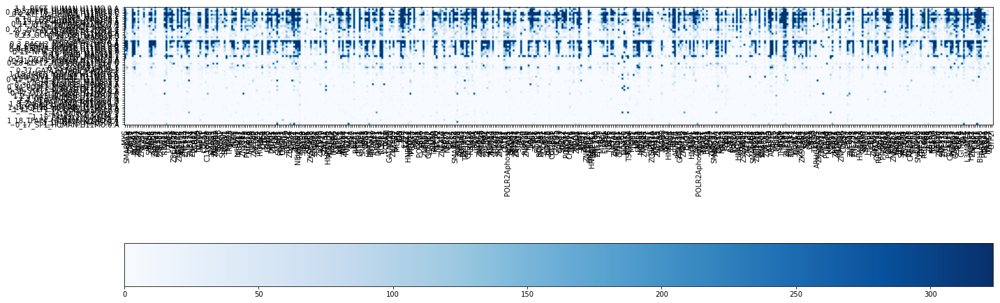

In [17]:
import sklearn.cluster
import scipy.cluster.hierarchy
import scipy.stats

def cluster_matrix_indices(matrix, num_clusters):
    """
    Clusters matrix using k-means. Always clusters on the first
    axis. Returns the indices needed to optimally order the matrix
    by clusters.
    """
    if len(matrix) == 1:
        # Don't cluster at all
        return np.array([0])

    num_clusters = min(num_clusters, len(matrix))
    
    # Perform k-means clustering
    kmeans = sklearn.cluster.KMeans(n_clusters=num_clusters)
    cluster_assignments = kmeans.fit_predict(matrix)

    # Perform hierarchical clustering on the cluster centers to determine optimal ordering
    kmeans_centers = kmeans.cluster_centers_
    cluster_order = scipy.cluster.hierarchy.leaves_list(
        scipy.cluster.hierarchy.optimal_leaf_ordering(
            scipy.cluster.hierarchy.linkage(kmeans_centers, method="centroid"), kmeans_centers
        )
    )

    # Order the peaks so that the cluster assignments follow the optimal ordering
    cluster_inds = []
    for cluster_id in cluster_order:
        cluster_inds.append(np.where(cluster_assignments == cluster_id)[0])
    cluster_inds = np.concatenate(cluster_inds)
    return cluster_inds

import matplotlib

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# Create a figure with the right dimensions
fig, ax = plt.subplots(figsize=(20, 16))


 
inds = cluster_matrix_indices(motif_chip_pval_matrix,10)

zero_mask = motif_chip_pval_matrix == 0
min_val = np.min(motif_chip_pval_matrix[~zero_mask])
motif_chip_pval_matrix[zero_mask] = min_val
logpval_matrix = -np.log10(motif_chip_pval_matrix)
 

hmap = ax.imshow(logpval_matrix[inds], cmap="Blues")


# Set axes on heatmap
ax.set_yticks(np.arange(len(unique_motifs)))
ax.set_yticklabels(np.array(unique_motifs)[inds])
ax.set_xticks(np.arange(len(uniq_tfs)))
ax.set_xticklabels(np.array(uniq_tfs), rotation=90)

fig.colorbar(hmap, orientation="horizontal")

fig.tight_layout()
    

plt.show()

In [18]:

from statsmodels.sandbox.stats.multicomp import multipletests



0_0_GATA3_GATA_1
['GATA1' 'TAL1' 'TCF12' 'STAT5A' 'TCF3']
0_1_CTCF_MA0139.1
['CTCF' 'SMC3' 'RAD21' 'ZNF143' 'CTCFL']
0_2_KLF12_HUMAN.H11MO.0.C
['SP1' 'SAFB2' 'E2F4' 'SP2' 'EGR1']
0_3_BACH2_MOUSE.H11MO.0.A
['NFE2L1' 'MAFF' 'NFE2' 'MAFK' 'MAFG']
0_4_Gabpa_MA0062.2
['ELK1' 'ELF1' 'GABPA' 'GABPB1' 'SIX5']
0_5_NFYB_HUMAN.H11MO.0.A
['NFYA' 'NFYB' 'SP2' 'FOS' 'CEBPZ']
0_6_CEBPG_HUMAN.H11MO.0.B
['CEBPG' 'DDIT3' 'ZSCAN32' 'ATF4' 'CEBPB']
0_7_ETV4_MOUSE.H11MO.0.B
['SPI1' 'ELF1' 'ELF4' 'GABPB1' 'ETV6']
0_8_NRF1_MA0506.1
['NRF1' 'POU5F1' 'ZBTB2' 'ZNF639' 'MEIS2']
0_9_BACH2_HUMAN.H11MO.0.A
['NFE2' 'NFE2L1' 'MAFF' 'MAFG' 'C11orf30']
0_10_FOSL1+JUND_MA1143.1
['COPS2' 'KHSRP' 'ATF2' 'ZBTB12' 'RFX5']
0_11_NFIC_HUMAN.H11MO.0.A
['NFIX' 'NFIC' 'SMAD1' 'NCOA2' 'ZKSCAN3']
0_12_ZNF76_HUMAN.H11MO.0.C
['SIX5' 'SUZ12' 'HCFC1' 'SMAD2' 'POU5F1']
0_13_SP2_HUMAN.H11MO.0.A
['CREBBP' 'POLR3G' 'BMI1' 'E2F4' 'SIX5']
0_14_TYY1_HUMAN.H11MO.0.A
['YY1' 'XRCC4' 'YBX3' 'KAT8' 'TAF1']
0_15_Stat4_MA0518.1
['STAT5A' 'DDX20' 'ET

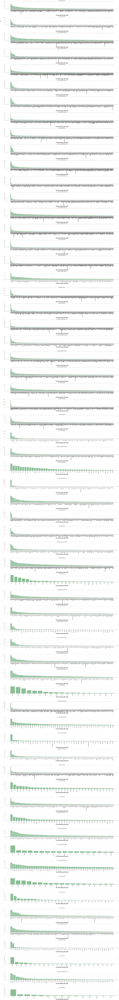

In [20]:
fig, axs = plt.subplots(len(unique_motifs),figsize=(30,250))
from matplotlib.ticker import StrMethodFormatter


for i in range(len(unique_motifs)):
    print(unique_motifs[i])
    p_adjusted = multipletests(motif_chip_pval_matrix[i,:], method='fdr_bh')
    idxs = np.argsort(odds_ratio[i,np.array(p_adjusted[0])])[::-1]
 
    ax = axs[i]
    tfs = np.array(uniq_tfs)[np.array(p_adjusted[0])][idxs]
    counts = odds_ratio[i,np.array(p_adjusted[0])][idxs]
    ax.bar(tfs, counts,color="#86bf91")
    ax.set_xticks(tfs,rotation='vertical')

    #ax.set_ylabel('odds ratio')
    #ax.set_ylabel('TFs significantly co-occuring with motif')

    ax.set_title(unique_motifs[i])

    print(np.array(uniq_tfs)[np.array(p_adjusted[0])][idxs][0:5])
    #print(odds_ratio[i,np.array(p_adjusted[0])][idxs][-5:])
    
for i,x in enumerate(axs):

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Set x-axis label
    x.set_xlabel("Tfs intersecting with motif", weight='bold', size=15)

    # Set y-axis label
    if i == 1:
        x.set_ylabel("TFs", labelpad=50, weight='bold', size=12)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

    x.tick_params(axis='x', rotation=90)
#plt.show()
plt.tight_layout()
plt.savefig(mode+"_histplot.pdf")


In [21]:
frames=[]
for i in range(len(unique_motifs)):
    print(unique_motifs[i])
    
    p_adjusted = multipletests(motif_chip_pval_matrix[i,:], method='fdr_bh')
    idxs = np.argsort(odds_ratio[i,np.array(p_adjusted[0])])[::-1]
 
    ax = axs[i]
    tfs = np.array(uniq_tfs)[np.array(p_adjusted[0])][idxs]
    counts = odds_ratio[i,np.array(p_adjusted[0])][idxs]

    new = []
    new.append(unique_motifs[i])
    new.extend(np.array(uniq_tfs)[np.array(p_adjusted[0])][idxs][0:10].tolist())
    frames.append(new)
    #ax.set_ylabel('odds ratio')
    #ax.set_ylabel('TFs significantly co-occuring with motif')

    print(np.array(uniq_tfs)[np.array(p_adjusted[0])][idxs][0:5])

outdf = pd.DataFrame(frames)
outdf.to_csv(mode+"_top10.tsv", sep='\t', header=False, index=False)

0_0_GATA3_GATA_1
['GATA1' 'TAL1' 'TCF12' 'STAT5A' 'TCF3']
0_1_CTCF_MA0139.1
['CTCF' 'SMC3' 'RAD21' 'ZNF143' 'CTCFL']
0_2_KLF12_HUMAN.H11MO.0.C
['SP1' 'SAFB2' 'E2F4' 'SP2' 'EGR1']
0_3_BACH2_MOUSE.H11MO.0.A
['NFE2L1' 'MAFF' 'NFE2' 'MAFK' 'MAFG']
0_4_Gabpa_MA0062.2
['ELK1' 'ELF1' 'GABPA' 'GABPB1' 'SIX5']
0_5_NFYB_HUMAN.H11MO.0.A
['NFYA' 'NFYB' 'SP2' 'FOS' 'CEBPZ']
0_6_CEBPG_HUMAN.H11MO.0.B
['CEBPG' 'DDIT3' 'ZSCAN32' 'ATF4' 'CEBPB']
0_7_ETV4_MOUSE.H11MO.0.B
['SPI1' 'ELF1' 'ELF4' 'GABPB1' 'ETV6']
0_8_NRF1_MA0506.1
['NRF1' 'POU5F1' 'ZBTB2' 'ZNF639' 'MEIS2']
0_9_BACH2_HUMAN.H11MO.0.A
['NFE2' 'NFE2L1' 'MAFF' 'MAFG' 'C11orf30']
0_10_FOSL1+JUND_MA1143.1
['COPS2' 'KHSRP' 'ATF2' 'ZBTB12' 'RFX5']
0_11_NFIC_HUMAN.H11MO.0.A
['NFIX' 'NFIC' 'SMAD1' 'NCOA2' 'ZKSCAN3']
0_12_ZNF76_HUMAN.H11MO.0.C
['SIX5' 'SUZ12' 'HCFC1' 'SMAD2' 'POU5F1']
0_13_SP2_HUMAN.H11MO.0.A
['CREBBP' 'POLR3G' 'BMI1' 'E2F4' 'SIX5']
0_14_TYY1_HUMAN.H11MO.0.A
['YY1' 'XRCC4' 'YBX3' 'KAT8' 'TAF1']
0_15_Stat4_MA0518.1
['STAT5A' 'DDX20' 'ET

In [22]:
motif_chip_pval_matrix[1,:]

array([4.94065646e-324, 9.99999994e-001, 1.00000000e+000, 1.00000000e+000,
       4.94065646e-324, 1.00000000e+000, 1.00000000e+000, 9.98988130e-001,
       4.94065646e-324, 1.00000000e+000, 3.71874206e-027, 1.00000000e+000,
       1.00000000e+000, 1.85317451e-214, 4.94065646e-324, 4.03145609e-075,
       9.99999941e-001, 9.99999920e-001, 9.99999997e-001, 1.00000000e+000,
       1.00000000e+000, 1.26677916e-189, 4.94065646e-324, 1.06702639e-216,
       4.94065646e-324, 4.94065646e-324, 9.99999973e-001, 9.80795571e-001,
       1.00000000e+000, 9.99999903e-001, 4.94065646e-324, 9.99999724e-001,
       1.00000000e+000, 9.99999886e-001, 4.94065646e-324, 1.00000000e+000,
       9.99999910e-001, 7.30561304e-020, 9.99965589e-001, 4.94065646e-324,
       1.00000000e+000, 8.25069420e-001, 1.00000000e+000, 4.94065646e-324,
       9.99999936e-001, 1.00000000e+000, 8.71109119e-032, 1.00000000e+000,
       1.00000000e+000, 4.94065646e-324, 1.00000000e+000, 9.77134400e-001,
       1.00000000e+000, 9

In [23]:
unique_motifs

['0_0_GATA3_GATA_1',
 '0_1_CTCF_MA0139.1',
 '0_2_KLF12_HUMAN.H11MO.0.C',
 '0_3_BACH2_MOUSE.H11MO.0.A',
 '0_4_Gabpa_MA0062.2',
 '0_5_NFYB_HUMAN.H11MO.0.A',
 '0_6_CEBPG_HUMAN.H11MO.0.B',
 '0_7_ETV4_MOUSE.H11MO.0.B',
 '0_8_NRF1_MA0506.1',
 '0_9_BACH2_HUMAN.H11MO.0.A',
 '0_10_FOSL1+JUND_MA1143.1',
 '0_11_NFIC_HUMAN.H11MO.0.A',
 '0_12_ZNF76_HUMAN.H11MO.0.C',
 '0_13_SP2_HUMAN.H11MO.0.A',
 '0_14_TYY1_HUMAN.H11MO.0.A',
 '0_15_Stat4_MA0518.1',
 '0_16_ZBTB33_MA0527.1',
 '0_17_SP1_HUMAN.H11MO.0.A',
 '0_18_ARNTL_bHLH_1',
 '0_19_JUND_MA0492.1',
 '0_20_ZNF76_HUMAN.H11MO.0.C',
 '0_21_CTCFL_MOUSE.H11MO.0.A',
 '0_22_SP2_HUMAN.H11MO.0.A',
 '0_23_GCR_MOUSE.H11MO.0.A',
 '0_24_SP1_MA0079.3',
 '0_25_ZNF524_C2H2_2',
 '0_26_YY1_MA0095.2',
 '0_27_TFE3_MA0831.2',
 '0_28_KLF12_HUMAN.H11MO.0.C',
 '0_29_Bhlha15_MA0607.1',
 '0_30_IRF1_MOUSE.H11MO.0.A',
 '0_31_KLF6_HUMAN.H11MO.0.A',
 '0_32_ETS1_ETS_2',
 '0_33_SOX8_HMG_7',
 '0_34_PO3F1_MOUSE.H11MO.0.C',
 '0_35_GATA3_GATA_1',
 '0_36_CTCF_C2H2_1',
 '0_37_GATA1+TAL1_MA0

In [ ]:
# data={}
# data["pval"] = motif_chip_pval_matrix
# data["odds"] = odds_ratio
# data["motif_names"] = unique_motifs
# data["tf_names"] = uniq_tfs

# import pickle as pkl
# ft = open("saving_pvals.pkl","wb")
# pkl.dump(data,ft)